In [1]:
library(Seurat)
library(dplyr)
library(ggpubr)
library(ggsci)
library(harmony)
library(ggtree)
library(colorspace)
library(RColorBrewer)
library(tidyverse)
library(clusterProfiler)
library(org.Hs.eg.db)
library(enrichplot)
library(pheatmap)
library(ComplexHeatmap)
library(circlize)
library(clustree)
library(tidyr)
library(reshape2) 
library(scales) 
library(irGSEA)
library(AUCell)
library(dplyr)
library(ggplot2)
library(ggrepel)
library(patchwork)
library(ReactomePA)
library(MAST)
library(ggnewscale)
library(monocle)
library(fgsea)
library(msigdbr)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: ggplot2

Loading required package: Rcpp

ggtree v3.4.4 For help: https://yulab-smu.top/treedata-book/

If you use the ggtree package suite in published research, please cite
the appropriate paper(s):

Guangchuang Yu, David Smith, Huachen Zhu, Yi Guan, Tommy Tsan-Yuk Lam.
ggtree: an R package for visualization and annotation of phylogenetic
trees with their covariates and other associated data. Methods in
Ecology and Evolution. 2017, 8(1):28-36. doi:10.1111/2041-210X.12628

Guangchuang Yu.  Data Integration, Manipulation and Visualization of
Phylogenetic Trees (1st edition). Chapman and Hall/CRC. 2022,
doi:10.1201/9781003279242

S Xu, Z Dai, P Guo, X Fu, S Liu, L Zhou, W Tang, T Feng, M Chen, L
Zhan, T Wu, E Hu, Y Jiang, X Bo, G Yu. ggtreeE

### 1、数据降维聚类

In [32]:
setwd('/home/zhouyao/Pan_cancer/pan_data/')
files <- list.files()
samplelist <- list()
for (i in files) {
  samplelist <- append(samplelist,readRDS(i))
}
seurat_raw <- Reduce(function(x, y) merge(x, y), samplelist)

In [2]:
seurat_raw <- readRDS("/home/zhouyao/Pan_cancer/data/seurat_raw.Rds")

In [33]:
seurat_raw@meta.data$patient[which(seurat_raw@meta.data$patient%in%'BRCA0137')] <- 'BRCA0173'

In [34]:
seurat_raw[["percent.mt"]] <- PercentageFeatureSet(seurat_raw,pattern = "^MT-")

In [35]:
seurat_raw@meta.data$tissue[which(seurat_raw@meta.data$tissue%in%'LN')] <- 'mLN'

In [36]:
seurat_qc <- subset(x = seurat_raw,subset = nFeature_RNA > 200 & nFeature_RNA < 6000 & percent.mt < 10)
seurat_qc

An object of class Seurat 
51164 features across 531779 samples within 2 assays 
Active assay: RNA (49164 features, 0 variable features)
 1 other assay present: integrated

In [37]:
####cell cycling
s.genes=Seurat::cc.genes.updated.2019$s.genes
g2m.genes=Seurat::cc.genes.updated.2019$g2m.genes
seurat_qc <- CellCycleScoring(seurat_qc, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)

In [ ]:
seurat_qc %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:20) %>%
  FindClusters(resolution = c(0.2,0.4))%>%
  #RunUMAP(reduction = "harmony", dims = 1:30)%>%
  RunTSNE(reduction = "harmony", dims = 1:20)
#saveRDS(seurat_qc, "/home/zhouyao/pancancer/seurat_qc.Rds")
#Idents(seurat_qc) <- seurat_qc@meta.data$RNA_snn_res.0.6
#marker_qc_0.6 <- FindAllMarkers(seurat_qc, only.pos = TRUE, min.pct = 0.25)
#save(marker_qc_0.6, file="/home/zhouyao/pancancer/marker_qc_0.6.RData")

In [39]:
saveRDS(seurat_qc, "/home/zhouyao/Pan_cancer/data/seurat_qc_test.Rds")

### 2、细胞大类注释

#### 2.1 点图

In [ ]:
table(seurat_qc$`RNA_snn_res.0.6`)

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggarrange(DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "Phase"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "RNA_snn_res.0.4"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),     
          DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         ncol=3     
        )

#### 2.2 气泡图

In [46]:
rm(list=ls())

In [256]:
table(seurat_qc$celltype)


Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
      32740      183439       47964      273693       82783 

In [10]:
genes_to_check <- list(
  immune=c('PTPRC'),
  T =c('CD3D','CD3E','CD3G','CD8A'),##T
  NK=c('KLRD1','KLRB1','NKG7','GNLY'),###NK
  B=c('CD79A','MS4A1','CD79B'),##B
    Plasma=c('IGHA1','IGHG1','JCHAIN'),##PLASMA
  MYOLD=c('CD68','CD14','LILRA4','CLEC4C','TPSAB1','TPSB2'),##MYOLD
  Epithelium=c('EPCAM','KRT8','KRT18','KRT19'),##epi
  Fibroblast=c('DCN','COL1A1','ACTA2'),##fib
  #muscle=c('ACTA2','TAGLN'),
  Endothelial=c('VWF','PECAM1'),###ENDO
  
  Cell_cycle=c('MKI67','PCNA','STMN1')
  )

In [ ]:
options(repr.plot.height = 13, repr.plot.width = 20)
pdf('/home/zhouyao/pancancer/figure/Section1/featureplot_marker.pdf',width = 20,height = 13)
FeaturePlot(seurat_qc,features = c('CD3D','CD3E','CD3G','KLRD1','KLRB1','NKG7','GNLY','CD79A','MS4A1','CD79B',
                                        'IGHA1','IGHG1','JCHAIN','CD68','CD14','LILRA4','CLEC4C','TPSAB1','TPSB2',
                                        'EPCAM','KRT8','KRT18','KRT19','DCN','COL1A1','ACTA2','VWF','PECAM1'),reduction = 'tsne',ncol=7)& ####&号，会把所有图都按照这个标准
theme(axis.line = element_blank(),axis.title=element_blank(),
        axis.text=element_blank(),
        axis.ticks=element_blank())

dev.off()
dev.off()

In [ ]:
options(repr.plot.height = 16, repr.plot.width = 14)
DotPlot(seurat_qc, features = genes_to_check, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.0.4') + scale_color_gradient2( low='blue',mid = 'white',high = '#d32420')+ ##scale_color_gradient( low ='white',high = '#d32420')
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [225]:
seurat_qc <- readRDS('/home/zhouyao/pancancer/seurat_qc.Rds')

In [250]:
seurat_qc

An object of class Seurat 
51164 features across 620619 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [33]:
table(seurat_qc$RNA_snn_res.0.4)


    0     1    10    11    12    13    14    15    16    17    18    19     2 
87618 65403 14358 12205 12096 10865  9848  8677  8088  7595  4821  4492 49988 
   20    21    22    23    24    25    26    27    28    29     3    30    31 
 2771  2489  2299  2205  1652  1574  1300   531   430   344 41095   296   240 
   32    33    34    35    36    37    38    39     4    40     5     6     7 
   92    80    62    57    50    49    33     2 40933     2 32228 28385 23356 
    8     9 
17126 16749 

In [ ]:
filter(marker_qc_0.6[order(marker_qc_0.6$avg_log2FC,decreasing = T),],cluster=='18')[1:100,]

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 20)
FeaturePlot(seurat_qc,c('CD3D','CD3E','EPCAM','KRT8','ALB'),ncol=3)

#### 2.3 重新定义cluster

In [ ]:
table(seurat_qc_20$RNA_snn_res.0.3)

In [189]:
seurat_qc <- subset(seurat_qc, subset = RNA_snn_res.0.6 %in% setdiff(unique(seurat_qc$RNA_snn_res.0.6), c('30')))

In [ ]:
seurat_qc_20 <- RenameIdents(seurat_qc_20,
    "20" = "19", "21" = "20", "22" = "21", "23" = "22",
    "24" = "23", "25" = "24", "26" = "25"
)

In [ ]:
seurat_qc_20$seurat_clusters <- Idents(seurat_qc_20)
table(seurat_qc_20$seurat_clusters) #######接下来的操作就是seurat_clusters了

In [ ]:
table(seurat_qc_20$RNA_snn_res.0.3)

In [ ]:
table(seurat_qc_20$seurat_clusters)

In [12]:
#####添加注释
#B = c(39,4,43)
#T =  c(16,24,29,7,0)
Lymphocyte = c(27,26,22,16,20,6,5,32,10,23,0,2)
Myeloid=c(18,3,9,31,17,24)
#NK=c(34,1,44,40)
Epithelium=c(14,8,19,21,1,12,29,11,15,13)
Endothelial=c(7)
Fibroblast=c(25,4)
doublet=c(28,30)
#Plasma=c(9)
#Cycling=c(16)
#Undefined=c(28,33,35,50,37,17)
#Doublet=c(15)
current.cluster.ids <- c(Lymphocyte,
                        # T,
                         Myeloid,
                        # NK,
                         Epithelium,
                         Endothelial,
                         Fibroblast,
                         doublet
                        # Plasma
                         #Cycling,
                         #Undefined
                         )

new.cluster.ids <- c(rep("Lymphocyte",length(Lymphocyte)),
                   #  rep("T",length(T)),
                     rep("Myeloid",length(Myeloid)),
                    # rep("NK/NKT",length(NK)),
                     rep("Epithelium",length(Epithelium)),
                     rep("Endothelial",length(Endothelial)),
                     rep("Fibroblast",length(Fibroblast)),
                     rep("doublet",length(doublet))
                    # rep("Cell_cycle",length(Cycling)),
                    # rep("Undefined",length(Undefined))
                     )
                    

seurat_qc@meta.data$celltype <- plyr::mapvalues(x = as.character(seurat_qc@meta.data$`RNA_snn_res.0.4`), from = current.cluster.ids, to = new.cluster.ids)

In [13]:
table(seurat_qc@meta.data$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
        515       23371      154852       40368      225718       67660 

In [154]:
table(seurat_qc@meta.data$cancer)


 BRCA2  BRCA3    HCC  HNSCC HNSCC2   Lung     OP   PRAD    PTC   STAD   TGCT 
 61414  11903  33162  28631  48945  65738  57124  32452 125362  21874  16791 

In [191]:
table(seurat_qc@meta.data$celltype)


          B Endothelial  Epithelium  Fibroblast     Myeloid      NK/NKT 
      40454       27522      147757       41320       63113       46345 
   Plasma_B           T 
      14593      103781 

In [ ]:
seurat_qc <- subset(seurat_qc, subset= celltype %in% setdiff(unique(seurat_qc$celltype),'Undefined'))

In [240]:
table(seurat_qc@meta.data$celltype)


          B  Cell_cycle Endothelial  Epithelium  Fibroblast     Myeloid 
      45286       21458       28055      137361       46912       61494 
     NK/NKT    Plasma_B           T   Undefined 
      47589       15880      119440        9651 

In [227]:
head(seurat_qc)

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>
GSM1909307_AAACCTGAGATGGGTC-1,GSM1909307,1898,872,BRCA2,GSM1909307,BRCA0040,T,9.272919,0,0,-0.001015388,-0.07312452,G1,0,11,18,19,19
GSM1909307_AAACCTGAGTCTTGCA-1,GSM1909307,3266,1025,BRCA2,GSM1909307,BRCA0040,T,6.644213,0,0,-0.065062899,-0.07097407,G1,0,22,30,32,32
GSM1909307_AAACCTGCATCACGAT-1,GSM1909307,3657,1317,BRCA2,GSM1909307,BRCA0040,T,4.539240,0,0,-0.013938450,-0.01603825,G1,1,1,1,1,1
GSM1909307_AAACCTGGTCATCCCT-1,GSM1909307,3265,1307,BRCA2,GSM1909307,BRCA0040,T,5.941807,0,0,-0.068150227,-0.08843860,G1,3,1,1,1,1
GSM1909307_AAACCTGGTGCAGACA-1,GSM1909307,3755,1141,BRCA2,GSM1909307,BRCA0040,T,6.205060,0,0,-0.056820921,-0.07469469,G1,0,1,1,1,1
GSM1909307_AAACCTGTCCCATTTA-1,GSM1909307,1433,650,BRCA2,GSM1909307,BRCA0040,T,2.930914,0,0,-0.062780389,-0.03973852,G1,10,2,4,4,4
GSM1909307_AAACCTGTCGCAGGCT-1,GSM1909307,2193,955,BRCA2,GSM1909307,BRCA0040,T,4.286366,0,0,0.012896734,-0.06939994,S,3,1,1,1,1
GSM1909307_AAACCTGTCTATCCTA-1,GSM1909307,5536,1663,BRCA2,GSM1909307,BRCA0040,T,4.533960,0,0,-0.014180652,-0.05174378,G1,3,1,1,1,1
GSM1909307_AAACGGGAGACTAGGC-1,GSM1909307,11701,2850,BRCA2,GSM1909307,BRCA0040,T,3.392872,0,0,0.027720654,-0.10697136,S,3,0,0,0,0


In [40]:
seurat_epi <- subset(seurat_qc, subset= celltype %in% c('Epithelium'))

In [253]:
seurat_epi

An object of class Seurat 
51164 features across 183439 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [ ]:
seurat_epi %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA(npcs = 30)%>%
  FindNeighbors(reduction = "pca", dims = 1:30) %>%
  FindClusters(resolution = c(0.4,0.6,0.8,1,1.2))%>%
  RunUMAP(reduction = "pca", dims = 1:30)

In [ ]:
filter(seurat_epi@meta.data,RNA_snn_res.0.4==4)

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 20)##RNA_snn_res.1
ggarrange(DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.5,group.by = "cancer"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.5,group.by = "celltype"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         
          DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=3     
        )

In [39]:
seurat_qc_test <- subset(seurat_qc,celltype!='doublet')

In [40]:
seurat_qc_test

An object of class Seurat 
51164 features across 490561 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 14)
DotPlot(seurat_epi, features = genes_to_check, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.0.4') + scale_color_gradient2( low='blue',mid = 'white',high = '#d32420')+ ##scale_color_gradient( low ='white',high = '#d32420')
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [50]:
table(seurat_qc@meta.data$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
        348       23356      128983       41075      248665       70057 

In [44]:
cell <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$`RNA_snn_res.0.4`%in%c('41'))]
seurat_qc@meta.data$celltype[match(cell,row.names(seurat_qc@meta.data))] <- 'doublet'

In [47]:
cell <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$`RNA_snn_res.0.4`%in%c('15','6','16'))]
seurat_qc@meta.data$celltype[match(cell,row.names(seurat_qc@meta.data))] <- 'Lymphocyte'

In [46]:
cell <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$`RNA_snn_res.0.4`%in%c('40'))]
seurat_qc@meta.data$celltype[match(cell,row.names(seurat_qc@meta.data))] <- 'Myeloid'

#### 2.5 堆叠小提琴图

In [ ]:
seurat_qc_2 <- RunUMAP(seurat_qc,reduction = "harmony", dims = 1:20)

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 15)
ggarrange(
    DimPlot(
  seurat_qc_test,reduction = "umap",pt.size = 0.5,group.by = "celltype"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_npg(),
DimPlot(
  seurat_qc_test,reduction = "umap",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_npg()
    )

In [48]:
seurat_qc$celltype <- factor(seurat_qc$celltype,levels = rev(c('T','NK/NKT','B','Plasma_B','Myeloid','Epithelium','Fibroblast','Endothelial')))
Idents(seurat_qc) <- seurat_qc$celltype
genes <- unlist(genes_to_check)
names(genes) <- NULL
genes <- setdiff(genes,c('LILRA4','CLEC4C','TPSAB1','TPSB2'))
#genes <- factor(genes,levels = rev(genes))
#genes_to_check <- rev(genes_to_check)
genes
length(genes)

[1] "PTPRC"  "CD3D"   "CD3E"   "CD3G"   "KLRD1"  "KLRB1"  "NKG7"   "GNLY"  
 [9] "CD79A"  "MS4A1"  "CD79B"  "IGHA1"  "IGHG1"  "JCHAIN" "CD68"   "CD14"  
[17] "EPCAM"  "KRT8"   "KRT18"  "KRT19"  "DCN"    "COL1A1" "ACTA2"  "VWF"   
[25] "PECAM1"

[1] 25

In [52]:
pdf('/home/zhouyao/pancancer/figure/qc_vlnplot.pdf',width = 18,height = 5)
#options(repr.plot.height = 5, repr.plot.width = 18)
VlnPlot(seurat_qc,features = genes,pt.size = 0,stack = TRUE)&
  scale_fill_manual(values = c(brewer.pal(11,"Set3"),brewer.pal(8,"Dark2"),brewer.pal(6,"Paired")))&###marker number
  theme(
    axis.title.x = element_blank(),
    axis.title.y = element_blank(),
    axis.ticks.y = element_blank(),
    axis.text.x = element_text(size = 10),
    axis.text.y = element_text(size = 10),
    strip.text.x = element_text(angle = 45,size = 10,hjust = 0,vjust = 0),
    legend.position = "none"
  )
dev.off()
dev.off()

png 
  2

null device 
          1

In [37]:
seurat_qc

An object of class Seurat 
49269 features across 533126 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [ ]:
options(repr.plot.height = 4, repr.plot.width = 10)
ggarrange(DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.5,group.by = "celltype"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_igv(),
DimPlot(
  seurat_qc,reduction = "umap",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_igv())

In [151]:
table(filter(seurat_qc@meta.data,celltype_new_last=='malignant'&cancer=='HCC')$tissue)


 mLN    T 
 950 4340 

In [ ]:
options(repr.plot.height = 4, repr.plot.width = 10)
FeaturePlot(seurat_qc,features = c('EPCAM','KRT8','CD3D','CD3E'))

In [133]:
length(cell)

[1] 780

In [134]:
table(seurat_test$celltype_new)


          B Endothelial  Epithelium  Fibroblast     Myeloid      NK/NKT 
      44161       28055      135438       46912       49478       45351 
   Plasma_B           T 
      14484      110944 

In [135]:
seurat_test_test <- subset(seurat_test,cells=setdiff(row.names(seurat_test@meta.data),cell))

In [102]:
a =seurat_test@meta.data

In [103]:
save(a,file='/home/zhouyao/pancancer/qc_meta.RData')

In [100]:
ls()

[1] "bar_data_cancer" "bar_per_cancer"  "cell"            "cells"          
 [5] "genes_to_check"  "lym_color"       "mye_color"       "p"              
 [9] "plot_fig"        "seurat_cycle"    "seurat_epi"      "seurat_Myeloid" 
[13] "seurat_qc"       "seurat_qc_1"     "seurat_qc_test"  "seurat_T"       
[17] "seurat_test"

In [97]:
seurat_test@meta.data$celltype_new[which(seurat_test@meta.data$celltype_new%in%'Cell_cycle')] <- 'Epithelium'

In [87]:
table(seurat_qc_test@meta.data$celltype_new)


          B  Cell_cycle Endothelial  Epithelium  Fibroblast     Myeloid 
      44161       21458       28055      124767       46912       49478 
     NK/NKT    Plasma_B           T 
      45351       14484      110944 

In [88]:
cell <-  row.names(seurat_qc_test@meta.data)[which(seurat_qc_test@meta.data$celltype_new%in%'Cell_cycle')]

In [95]:
seurat_test <- subset(seurat_qc_test,cells=cells)

In [90]:
cells <- setdiff(cell,row.names(seurat_cycle@meta.data))

In [93]:
cells <- setdiff(row.names(seurat_qc_test@meta.data),cells)

In [94]:
length(cells)

[1] 474823

In [72]:
seurat_test <- subset(seurat_qc_test,cells=setdiff(row.names(seurat_qc_test)[which(seurat_qc_test@meta.data)]))

In [79]:
seurat_cycle

An object of class Seurat 
49269 features across 10671 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [53]:
seurat_qc_test

An object of class Seurat 
49269 features across 485610 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [ ]:
seurat_qc_test

In [109]:
table(seurat_test$celltype_new)


          B Endothelial  Epithelium  Fibroblast     Myeloid      NK/NKT 
      44161       28055      135438       46912       49478       45351 
   Plasma_B           T 
      14484      110944 

In [ ]:
seurat_qc_test <- subset(seurat_qc,subset=celltype_new%in%setdiff(unique(seurat_qc$celltype_new),c('B_myeloid','Doublet','doublet_myeloid','Epi_myeloid','Fib_myeloid','T_myeloid')))

#### 2.4 上皮细胞

In [159]:
load('/home/zhouyao/pancancer/data/cells.RData')

In [160]:
length(cells)

[1] 124226

In [161]:
seurat_epi_test <- subset(seurat_epi,cells=cells)

In [163]:
table(seurat_epi_test$celltype_new_last)


non_malignant     malignant 
        15925        108301 

In [90]:
head(malignant)

,cell.names,copykat.pred
,<chr>,<chr>
GSM1909308_AAAGCAACAGGGTACA-1,GSM1909308_AAAGCAACAGGGTACA-1,diploid
GSM1909308_AAAGTAGGTCTAGTCA-1,GSM1909308_AAAGTAGGTCTAGTCA-1,diploid
GSM1909308_AAGCCGCCAGCTGTGC-1,GSM1909308_AAGCCGCCAGCTGTGC-1,diploid
GSM1909308_ACACCCTGTGGCGAAT-1,GSM1909308_ACACCCTGTGGCGAAT-1,diploid
GSM1909308_ACGATACCACGTCTCT-1,GSM1909308_ACGATACCACGTCTCT-1,diploid
GSM1909308_ACGCCGATCCTTAATC-1,GSM1909308_ACGCCGATCCTTAATC-1,diploid


In [93]:
head(match(row.names(malignant),row.names(seurat_epi@meta.data)))

[1] 4579 4592 4681 4753 4864 4895

In [235]:
seurat_epi@meta.data$celltype_new_last <- as.character(seurat_epi@meta.data$celltype_new_last)

In [236]:
seurat_epi@meta.data$celltype_new_last[match(row.names(malignant),row.names(seurat_epi@meta.data))] <- 
malignant$copykat.pred

In [231]:
seurat@meta.data$celltype_new_last <- as.character(seurat@meta.data$celltype_new_last)

In [232]:
seurat@meta.data$celltype_new_last[match(row.names(malignant),row.names(seurat@meta.data))] <- 
malignant$copykat.pred

In [239]:
table(seurat_epi@meta.data$celltype_new_last)


    malignant non_malignant 
       126756          7902 

In [240]:
seurat_epi_label <- data.frame(cells=row.names(seurat_epi@meta.data),celltype_new_last=seurat_epi@meta.data$celltype_new_last)

In [241]:
save(seurat_epi_label,file='/home/zhouyao/pancancer/data/seurat_epi_label.RData')

In [217]:
table(seurat_epi$celltype_new_last)


    malignant non_malignant 
       126295          8363 

In [238]:
seurat_epi$celltype_new_last[which(seurat_epi$celltype_new_last%in%'aneuploid')] <- 'malignant'
seurat_epi$celltype_new_last[which(seurat_epi$celltype_new_last%in%'diploid')] <- 'non_malignant'

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 5)
ggarrange(
       DimPlot(
  seurat,reduction = "tsne",pt.size = 0.1,group.by = "celltype_new_last"
  ,label=TRUE)+scale_color_igv()+labs(title = ""),     
       DimPlot(
  seurat,reduction = "tsne",pt.size = 0.1,group.by = "tissue"
  ,label=F)+scale_color_d3()+theme(legend.position = 'top')+labs(title = ""),
         ncol=1     
        )

In [8]:
cells_m <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$celltype_epi_new%in%'malignant')]
cells_non <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$celltype_new_last%in%'non_malignant')]

In [10]:
length(cells_m)
length(cells_non)
a <- intersect(cells_m,cells_non)

[1] 86787

[1] 44669

In [170]:
table(filter(seurat_epi_test@meta.data,celltype_new_last=='non_malignant'&tissue=='mLN')$cancer)


 BRCA    GC   HCC HNSCC  LUNG   OPC  PRAD   PTC 
  602     6    64   222   294     2   596   169 

In [119]:
cell <- row.names(filter(seurat_epi@meta.data,celltype_new_last=='non_malignant'&tissue=='mLN'&cancer=='BRCA'))
length(cell)

[1] 2463

In [120]:
seurat_brca <- subset(seurat_epi,cells=cell)

In [ ]:
FeaturePlot(seurat,features = c('EPCAM','KRT8','KRT18','KRT7'),reduction = 'tsne')

In [14]:
seurat_epi@meta.data$celltype_new_last[which(row.names(seurat_epi@meta.data)%in%a)] <- 'malignant'

In [175]:
seurat

An object of class Seurat 
49269 features across 15925 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [261]:
seurat <- subset(seurat_epi,celltype_new_last=='non_malignant')

In [212]:
table(filter(seurat@meta.data,celltype_new_last=='diploid'&tissue=='mLN')$cancer)


 BRCA    GC HNSCC  LUNG  PRAD   PTC 
  242     2     9   294   600    82 

In [264]:
table(seurat$sampleid)


BRONCHO_11 BRONCHO_58    EBUS_06    EBUS_10    EBUS_12    EBUS_13    EBUS_15 
        31          6          3        101         30          5        110 
   EBUS_19    EBUS_28    EBUS_51 GSM1909307 GSM1909308 GSM1909309 GSM1909311 
        15          3          1         39         13         85         57 
GSM1909312 GSM1909313 GSM1909314 GSM1909315 GSM1909316 GSM1909317 GSM1909318 
         3         68          1         27          9         24          5 
GSM1909320 GSM1909321 GSM4151980 GSM4151982 GSM5004181 GSM5004185 GSM5457201 
        10         43          8          1         35          2          2 
GSM5457204 GSM5457208 GSM5457211 GSM5457212 GSM5585107 GSM5585110 GSM5585112 
         2         11         21         75          1          1          7 
GSM5585114 GSM5585115 GSM5585117 GSM5585119 GSM5585121 GSM5585122 GSM5690378 
         9          4          2         54         25         68          3 
    HCC09T     HCC10T     HN263P         L2         L3         

In [269]:
table(seurat$cancer)


 BRCA    GC   HCC HNSCC  LUNG   OPC  PRAD   PTC 
 2517    37   274    11   586   145  4161   171 

In [268]:
filter(seurat@meta.data,sampleid=='T7')

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,celltype_new_last,cancer1,RNA_snn_res.1,celltype_epi,celltype_epi_new,RNA_snn_res.0.1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<fct>,<dbl>,<dbl>,<int>,⋯,<fct>,<fct>,<chr>,<chr>,<fct>,<chr>,<fct>,<fct>,<chr>,<fct>
AAACCCAGTCCTGTTC-T7,SeuratProject,770,502,BRCA,T7,LT7,T,2.597403,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAACGAACACAGTGTT-T7,SeuratProject,808,504,BRCA,T7,LT7,T,1.361386,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAACGAACATCAACCA-T7,SeuratProject,603,361,BRCA,T7,LT7,T,1.824212,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAACGAATCCTTCTTC-T7,SeuratProject,435,301,BRCA,T7,LT7,T,2.528736,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAACGCTCAACCAATC-T7,SeuratProject,525,368,BRCA,T7,LT7,T,1.714286,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAAGAACCATTGGATC-T7,SeuratProject,880,492,BRCA,T7,LT7,T,7.045455,0,0,⋯,5,7,NK/NKT,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAAGGATGTGCCGGTT-T7,SeuratProject,591,365,BRCA,T7,LT7,T,4.906937,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAAGGTAAGAAGTCTA-T7,SeuratProject,1834,751,BRCA,T7,LT7,T,1.526718,0,0,⋯,5,7,Epithelium,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7
AAAGTCCAGCACCAGA-T7,SeuratProject,1022,505,BRCA,T7,LT7,T,5.870841,0,0,⋯,5,7,T,Epithelium,non_malignant,BRCA,7,non_malignant,non_malignant,7


In [273]:
table(malignant$copykat.pred)


aneuploid   diploid 
      526      2748 

In [276]:
which(as.numeric(apply(rawmat[which(rownames(rawmat) %in% c("PTPRC", "LYZ", "PECAM1")), ], 2, mean)) > 1)

[1]   46  140  201  381  531  554  719  753  866 1086

In [ ]:
apply(rawmat[which(rownames(rawmat) %in% c("PTPRC", "LYZ", "PECAM1")),], 2, mean)

In [87]:
head(malignant)

,cell.names,copykat.pred
,<chr>,<chr>
GSM1909308_AAAGCAACAGGGTACA-1,GSM1909308_AAAGCAACAGGGTACA-1,diploid
GSM1909308_AAAGTAGGTCTAGTCA-1,GSM1909308_AAAGTAGGTCTAGTCA-1,diploid
GSM1909308_AAGCCGCCAGCTGTGC-1,GSM1909308_AAGCCGCCAGCTGTGC-1,diploid
GSM1909308_ACACCCTGTGGCGAAT-1,GSM1909308_ACACCCTGTGGCGAAT-1,diploid
GSM1909308_ACGATACCACGTCTCT-1,GSM1909308_ACGATACCACGTCTCT-1,diploid
GSM1909308_ACGCCGATCCTTAATC-1,GSM1909308_ACGCCGATCCTTAATC-1,diploid


In [112]:
table(pred.test$copykat.pred)


aneuploid   diploid 
       11       137 

In [113]:
seurat_GC@meta.data$label <- pred.test[row.names(seurat_GC@meta.data),2]

In [177]:
seurat_epi <- subset(seurat_qc, subset= celltype %in% c('Epithelium'))
seurat_epi

An object of class Seurat 
46188 features across 164832 samples within 2 assays 
Active assay: RNA (44188 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [ ]:
seurat_epi %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:30) %>%
  FindClusters(resolution = c(0.8))%>%
  RunUMAP(reduction = "harmony", dims = 1:30)
#saveRDS(seurat_qc, "/home/zhouyao/pancancer/seurat_qc.Rds")
#Idents(seurat_qc) <- seurat_qc@meta.data$RNA_snn_res.0.6
#marker_qc_0.6 <- FindAllMarkers(seurat_qc, only.pos = TRUE, min.pct = 0.25)
#save(marker_qc_0.6, file="/home/zhouyao/pancancer/marker_qc_0.6.RData")

In [ ]:
seurat_epi <- FindClusters(seurat_epi,resolution = c(0.1))
marker_epi_0.1 <- FindAllMarkers(seurat_epi, only.pos = TRUE, min.pct = 0.25)
save(marker_epi_0.1, file="/home/zhouyao/pancancer/data/marker_epi_0.1.RData")

In [243]:
table(seurat_qc$celltype_new)


                 B        Endothelial         Epithelium         Fibroblast 
             39233              27522             147757              41320 
           Myeloid Myeloid_Epithelium             NK/NKT           Plasma_B 
             59278               3835              44747              13886 
                 T       T_Epithelium 
             93598              13709 

In [24]:
seurat_epi <- subset(seurat_qc, subset= celltype_new %in% c('Epithelium','Myeloid_Epithelium','T_Epithelium'))

In [36]:
table(seurat_qc$celltype_new)


                 B        Endothelial         Epithelium         Fibroblast 
             39233              27522             147757              41320 
           Myeloid Myeloid_Epithelium             NK/NKT           Plasma_B 
             59278               3835              44747              13886 
                 T       T_Epithelium 
             93598              13709 

In [159]:
rm(list=ls())

In [108]:
seurat_epi

An object of class Seurat 
49269 features across 135438 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [255]:
saveRDS(seurat_epi,'/home/zhouyao/pancancer/data/seurat_epi.Rds')

In [179]:
genes_to_check <- list(
  immune=c('PTPRC'),
  T =c('CD3D','CD3E','CD3G'),##T
  NK=c('KLRD1','KLRB1','NKG7','GNLY'),###NK
  B=c('CD79A','MS4A1','CD79B'),##B
  MYOLD=c('CD68','CD163','CD14',"S100A8",'S100A9','FCGR3A','LST1','LILRB2',"FCGR3B",'CSF3R','FCN1','LILRA4','CLEC4C','TPSAB1','TPSB2','KIT'),##MYOLD
  Epithelium=c('EPCAM','KRT8','KRT18','KRT19','CD24','TG','CLU','ALB','HNF4A','POU5F1'),##epi
  Fibroblast=c('DCN','COL1A1','ACTA2'),##fib
  #muscle=c('ACTA2','TAGLN'),
  Endothelial=c('VWF','PECAM1'),###ENDO
  Plasma=c('IGHA1','IGHG1','JCHAIN')##PLASMA
  #Cell_cycle=c('MKI67','PCNA','STMN1')
  )

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


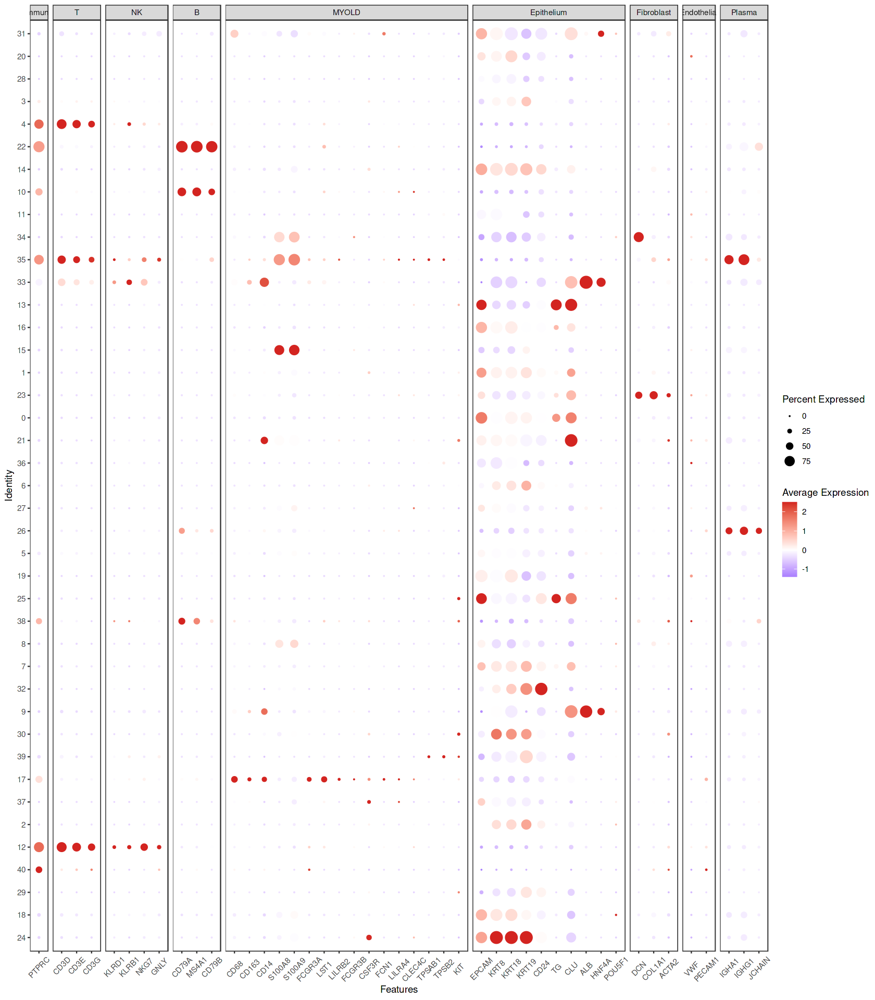

In [180]:
options(repr.plot.height = 16, repr.plot.width = 14)
DotPlot(seurat_epi, features = genes_to_check, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.0.8') + scale_color_gradient2( low='blue',mid = 'white',high = '#d32420')+ ##scale_color_gradient( low ='white',high = '#d32420')
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [184]:
table(seurat_qc@meta.data$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
        318       18039      137486       36328      228543       78268 

In [ ]:
filter(seurat_Myeloid@meta.data,cancer=='OP'&tissue=='T')

In [181]:
cell <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$RNA_snn_res.0.8%in%c('4','22','10','12'))]
seurat_qc@meta.data[cell,'celltype'] <- 'Lymphocyte'

In [183]:
cell <- row.names(seurat_epi@meta.data)[which(seurat_epi@meta.data$RNA_snn_res.0.8%in%c('35'))]
seurat_qc@meta.data[cell,'celltype'] <- 'doublet'

In [72]:
seurat_epi <- subset(seurat_epi, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_epi$RNA_snn_res.1), c('6','56')))

In [61]:
cell <- row.names(seurat_epi_test@meta.data)[which(seurat_epi_test@meta.data$RNA_snn_res.1%in%c('0','6','47'))]

In [66]:
seurat_epi <- subset(seurat_epi,cells=setdiff(row.names(seurat_epi@meta.data),cell))

In [75]:
seurat_epi

An object of class Seurat 
49269 features across 138246 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [63]:
cells=setdiff(row.names(seurat_epi@meta.data),cell)

In [64]:
length(cells)

[1] 142603

In [78]:
seurat_cycle

An object of class Seurat 
49269 features across 10671 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [41]:
table(seurat_epi$RNA_snn_res.1)


    0     1     2     3     4     5     6     7     8     9    10    11    12 
10975 10147  8706  6518  6457  6270  5888  5112  5061  4651  3796  3591  3392 
   13    14    15    16    17    18    19    20    21    22    23    24    25 
 3321  3241  3042  2891  2761  2728  2549  2463  2459  2250  2173  1970  1946 
   26    27    28    29    30    31    32    33    34    35    36    37    38 
 1938  1853  1761  1754  1620  1583  1524  1480  1373  1368  1224  1190  1144 
   39    40    41    42    43    44    45    46    47    48    49    50    51 
 1130  1064  1063  1050   985   965   900   830   821   640   636   591   466 
   52    53    54    55    56 
  405   338   295   222    64 

In [36]:
cell <- c(cell,row.names(seurat_qc@meta.data)[which(seurat_qc@meta.data$celltype_new%in%c('Cell_cycle','Endothelial','Fibroblast'))])

In [38]:
head(cell)

[1] "GSM1909307_AAACCTGAGATGGGTC-1" "GSM1909307_AAACCTGAGTCTTGCA-1"
[3] "GSM1909307_AAACCTGCATCACGAT-1" "GSM1909307_AAACCTGGTCATCCCT-1"
[5] "GSM1909307_AAACCTGGTGCAGACA-1" "GSM1909307_AAACCTGTCGCAGGCT-1"

In [45]:
head(seurat_qc_test)


,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>
GSM1909307_AAACCTGAGATGGGTC-1,GSM1909307,1898,872,BRCA2,GSM1909307,BRCA0040,T,9.272919,0,0,-0.001015388,-0.07312452,G1,0,17,21,25,25,Epithelium,Epithelium
GSM1909307_AAACCTGAGTCTTGCA-1,GSM1909307,3266,1025,BRCA2,GSM1909307,BRCA0040,T,6.644213,0,0,-0.065062899,-0.07097407,G1,0,17,21,25,25,Epithelium,Epithelium
GSM1909307_AAACCTGCATCACGAT-1,GSM1909307,3657,1317,BRCA2,GSM1909307,BRCA0040,T,4.539240,0,0,-0.013938450,-0.01603825,G1,1,1,2,3,3,Epithelium,Epithelium
GSM1909307_AAACCTGGTCATCCCT-1,GSM1909307,3265,1307,BRCA2,GSM1909307,BRCA0040,T,5.941807,0,0,-0.068150227,-0.08843860,G1,3,1,2,3,3,Epithelium,Epithelium
GSM1909307_AAACCTGGTGCAGACA-1,GSM1909307,3755,1141,BRCA2,GSM1909307,BRCA0040,T,6.205060,0,0,-0.056820921,-0.07469469,G1,0,1,2,3,3,Epithelium,Epithelium
GSM1909307_AAACCTGTCGCAGGCT-1,GSM1909307,2193,955,BRCA2,GSM1909307,BRCA0040,T,4.286366,0,0,0.012896734,-0.06939994,S,3,1,2,3,3,Epithelium,Epithelium
GSM1909307_AAACCTGTCTATCCTA-1,GSM1909307,5536,1663,BRCA2,GSM1909307,BRCA0040,T,4.533960,0,0,-0.014180652,-0.05174378,G1,3,1,2,3,3,Epithelium,Epithelium
GSM1909307_AAACGGGAGACTAGGC-1,GSM1909307,11701,2850,BRCA2,GSM1909307,BRCA0040,T,3.392872,0,0,0.027720654,-0.10697136,S,3,0,0,0,0,T,Epithelium
GSM1909307_AAACGGGAGCGTGAGT-1,GSM1909307,2963,1086,BRCA2,GSM1909307,BRCA0040,T,5.737428,0,0,-0.054290022,-0.05613037,G1,2,1,2,3,3,Epithelium,Epithelium


In [180]:
table(seurat_epi$`RNA_snn_res.0.4`)


    0     1     2     3     4     5     6     7     8     9    10    11    12 
11013  9254  7302  6674  6668  6295  5416  5312  5227  5025  4925  4034  3709 
   13    14    15    16    17    18    19    20    21    22    23    24    25 
 3670  3294  3229  2867  2857  2843  2776  2571  2412  2402  2217  2075  1895 
   26    27    28    29    30    31    32    33    34    35    36    37    38 
 1885  1817  1801  1577  1518  1343  1340  1213  1209  1121  1052  1037   826 
   39    40 
  491   466 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



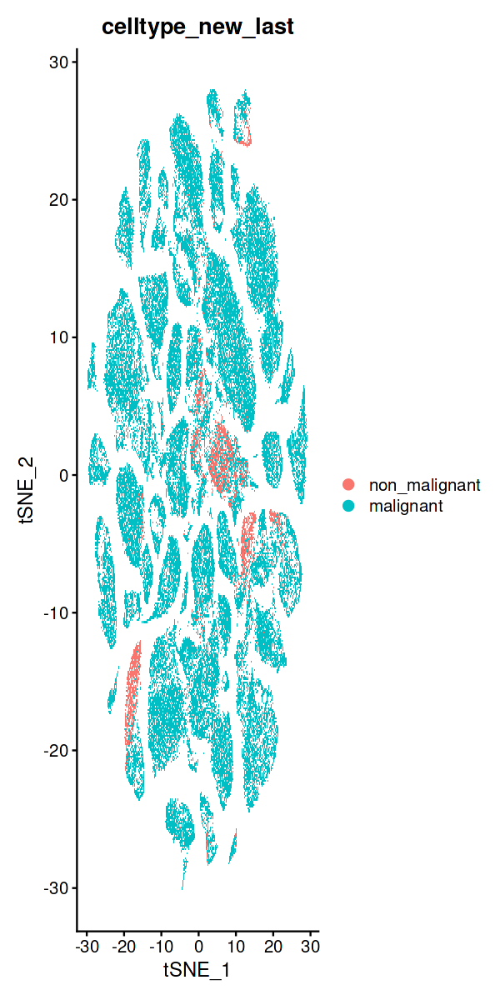

In [218]:
seurat_epi@meta.data$celltype_new_last <- factor(seurat_epi@meta.data$celltype_new_last,levels=c('non_malignant','malignant'))
p_celltype <- DimPlot(
  seurat_epi,reduction = "tsne",pt.size = 0.1,group.by = 'celltype_new_last'#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F,repel = TRUE)#+scale_color_aaas()+theme(legend.position = 'top')+labs(title = "")
  p_celltype

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



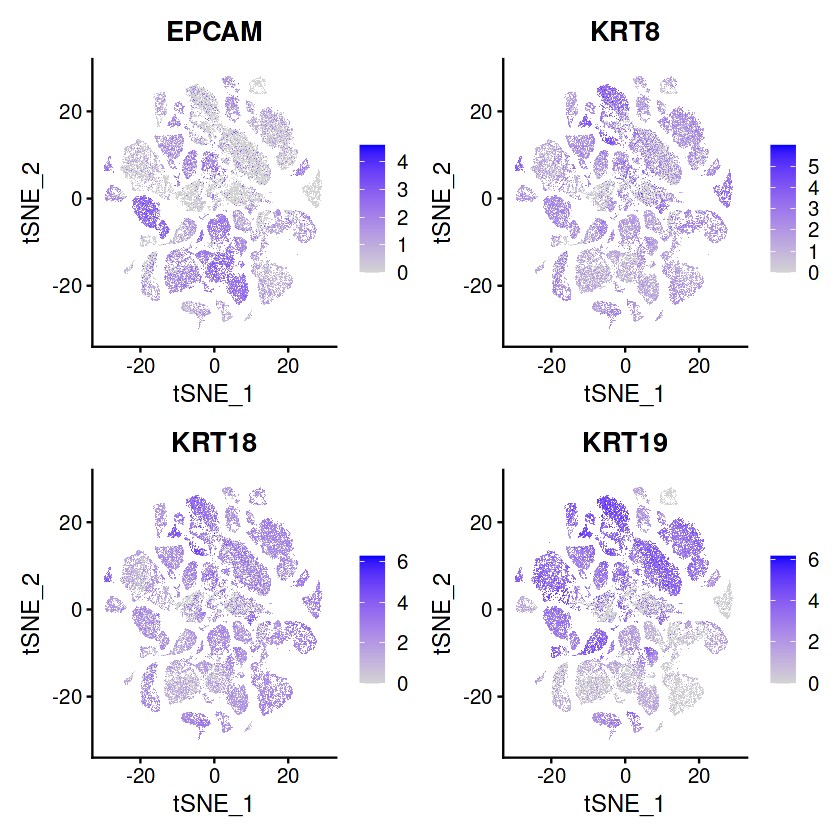

In [174]:
FeaturePlot(seurat_epi_test,features = c('EPCAM','KRT8','KRT18','KRT19'),reduction = 'tsne')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



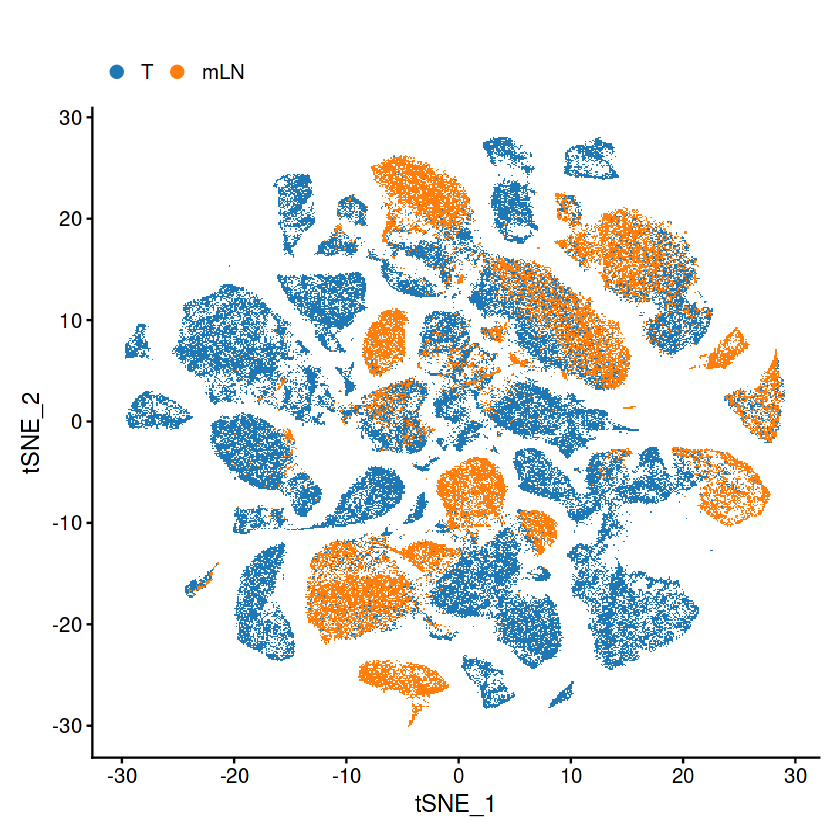

In [165]:
seurat_epi@meta.data$tissue <- factor(seurat_epi@meta.data$tissue,levels=c('T','mLN'))
p_tissue <-  DimPlot(
  seurat_epi,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_d3()+theme(legend.position = 'top')+labs(title = "")
  p_tissue

In [20]:
table(seurat_epi@meta.data[,'celltype_new_last'])


non_malignant     malignant 
        31999        102659 

In [220]:
bar_per_cancer

Var1,Var2,Freq,sum(Freq),percent
<fct>,<fct>,<int>,<int>,<dbl>
T,non_malignant,7134,95719,0.07453066
mLN,non_malignant,1229,38939,0.03156219
T,malignant,88585,95719,0.92546934
mLN,malignant,37710,38939,0.96843781


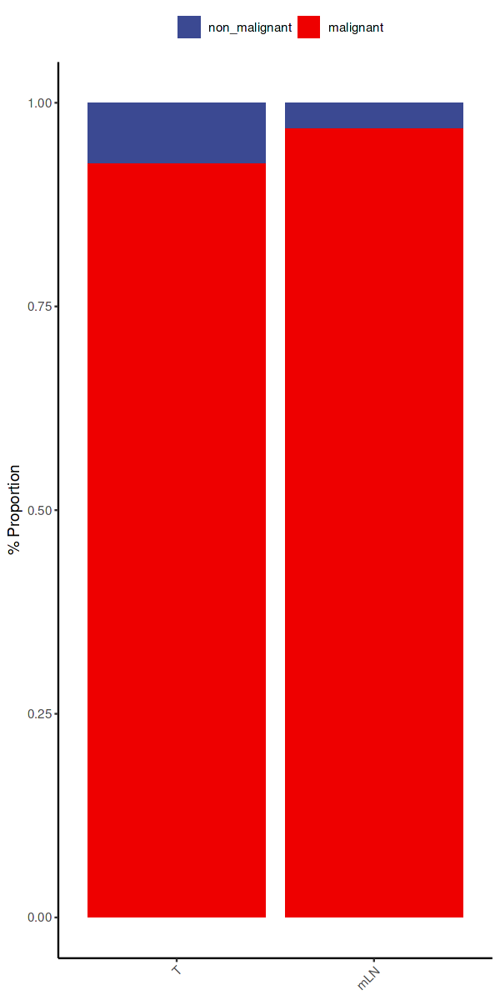

In [219]:
bar_per_cancer <- as.data.frame(table(seurat_epi@meta.data[,'tissue'],
           seurat_epi@meta.data[,'celltype_new_last'])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
p_cell_cancer <- ggplot(bar_per_cancer, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ,axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +labs(y = "% Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_aaas()
p_cell_cancer

In [281]:
#options(repr.plot.height = 5, repr.plot.width = 13)
#pdf('')
#p_celltype+p_tissue+p_cell_cancer
pdf('/home/zhouyao/pancancer/figure/seurat_epi.pdf',width = 13,height = 5)
p_celltype+p_tissue+p_cell_cancer
dev.off()
dev.off()

png 
  2

null device 
          1

#### 2.5 肿瘤细胞

##### 2.5.1 提取msigdbr数据

In [174]:
head(Hallmark)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'Hallmark' not found


In [24]:
library(msigdbr)

In [33]:
m_df <- msigdbr(species='Homo sapiens',category='C5')#%>%filter(gs_subcat%in%c('CP:KEGG','CP:REACTOME'))
#head(m_df)
m_df <- filter(m_df,gs_subcat=='GO:BP')
m_df$gs_name <- str_remove(string = m_df$gs_name ,pattern = "GOBP_")
m_df$gs_name <- str_to_title(m_df$gs_name)
m_df

gs_cat,gs_subcat,gs_name,gene_symbol,entrez_gene,ensembl_gene,human_gene_symbol,human_entrez_gene,human_ensembl_gene,gs_id,gs_pmid,gs_geoid,gs_exact_source,gs_url,gs_description
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,AASDHPPT,60496,ENSG00000149313,AASDHPPT,60496,ENSG00000149313,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,ALDH1L1,10840,ENSG00000144908,ALDH1L1,10840,ENSG00000144908,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,ALDH1L2,160428,ENSG00000136010,ALDH1L2,160428,ENSG00000136010,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,MTHFD1,4522,ENSG00000100714,MTHFD1,4522,ENSG00000100714,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,MTHFD1L,25902,ENSG00000120254,MTHFD1L,25902,ENSG00000120254,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,10_formyltetrahydrofolate_metabolic_process,MTHFD2L,441024,ENSG00000163738,MTHFD2L,441024,ENSG00000163738,M29088,,,GO:0009256,http://amigo.geneontology.org/amigo/term/GO:0009256,"The chemical reactions and pathways involving 10-formyltetrahydrofolate, the formylated derivative of tetrahydrofolate. [GOC:ai]"
C5,GO:BP,2fe_2s_cluster_assembly,BOLA2,552900,ENSG00000183336,BOLA2,552900,ENSG00000183336,M23654,,,GO:0044571,http://amigo.geneontology.org/amigo/term/GO:0044571,"The incorporation of two iron atoms and two sulfur atoms into an iron-sulfur cluster. [GOC:jl, GOC:mengo_curators, GOC:pde, GOC:tt, GOC:vw, PMID:15952888]"
C5,GO:BP,2fe_2s_cluster_assembly,BOLA2B,654483,ENSG00000169627,BOLA2B,654483,ENSG00000169627,M23654,,,GO:0044571,http://amigo.geneontology.org/amigo/term/GO:0044571,"The incorporation of two iron atoms and two sulfur atoms into an iron-sulfur cluster. [GOC:jl, GOC:mengo_curators, GOC:pde, GOC:tt, GOC:vw, PMID:15952888]"
C5,GO:BP,2fe_2s_cluster_assembly,GLRX3,10539,ENSG00000108010,GLRX3,10539,ENSG00000108010,M23654,,,GO:0044571,http://amigo.geneontology.org/amigo/term/GO:0044571,"The incorporation of two iron atoms and two sulfur atoms into an iron-sulfur cluster. [GOC:jl, GOC:mengo_curators, GOC:pde, GOC:tt, GOC:vw, PMID:15952888]"


In [34]:
save(m_df,file='/home/zhouyao/pancancer/data/m_df.RData')

In [26]:
table(m_df$gs_subcat)


 GO:BP  GO:CC  GO:MF    HPO 
721379 115769 122674 464649 

In [193]:
fgsea_sets_C7 <- data.frame(term=m_df$gs_name,gene=m_df$gene_symbol)
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "GOBP_")
fgsea_sets_C7$term <- str_to_title(fgsea_sets_C7$term) ###首字母大写

tail(fgsea_sets_C7)

,term,gene
,<chr>,<chr>
1118959,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNF654
1118960,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNF721
1118961,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNF761
1118962,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNF765
1118963,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNF845
1118964,Zak_pbmc_mrkad5_hiv_1_gag_pol_nef_age_20_50yo_correlated_with_cd8_t_cell_response_3dy_positive,ZNHIT6


In [184]:
fgsea_sets_Go <- data.frame(term=m_df$gs_name,gene=m_df$gene_symbol)
fgsea_sets_Go$term <- str_remove(string = fgsea_sets_Go$term ,pattern = "GOBP_")
fgsea_sets_Go$term <- str_to_title(fgsea_sets_Go$term) ###首字母大写
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "KEGG_")
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "REACTOME_")
tail(fgsea_sets_Go)

,term,gene
,<chr>,<chr>
721374,Zymogen_inhibition,CARD18
721375,Zymogen_inhibition,CARD8
721376,Zymogen_inhibition,CAST
721377,Zymogen_inhibition,CST7
721378,Zymogen_inhibition,NOL3
721379,Zymogen_inhibition,XIAP


In [176]:
fgsea_sets_H <- data.frame(term=m_df$gs_name,gene=m_df$gene_symbol)
fgsea_sets_H$term <- str_remove(string = fgsea_sets_H$term ,pattern = "HALLMARK_")
fgsea_sets_H$term <- str_to_title(fgsea_sets_H$term) ###首字母大写
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "KEGG_")
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "REACTOME_")
head(fgsea_sets_H)

,term,gene
,<chr>,<chr>
1,Adipogenesis,ABCA1
2,Adipogenesis,ABCB8
3,Adipogenesis,ACAA2
4,Adipogenesis,ACADL
5,Adipogenesis,ACADM
6,Adipogenesis,ACADS


In [189]:
fgsea_sets_Pathway <- data.frame(term=m_df$gs_name,gene=m_df$gene_symbol)
fgsea_sets_Pathway$term <- str_remove(string = fgsea_sets_Pathway$term ,pattern = "KEGG_")
fgsea_sets_Pathway$term <- str_remove(string = fgsea_sets_Pathway$term ,pattern = "REACTOME_")
fgsea_sets_Pathway$term <- str_to_title(fgsea_sets_Pathway$term) ###首字母大写
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "KEGG_")
#fgsea_sets_C7$term <- str_remove(string = fgsea_sets_C7$term ,pattern = "REACTOME_")
head(fgsea_sets_Pathway)

,term,gene
,<chr>,<chr>
1,Abc_transporters,ABCA1
2,Abc_transporters,ABCA10
3,Abc_transporters,ABCA12
4,Abc_transporters,ABCA13
5,Abc_transporters,ABCA2
6,Abc_transporters,ABCA3


In [194]:
save(fgsea_sets_C7,file='/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_C7.RData')

In [199]:
head(fgsea_sets_Go)

,term,gene
,<chr>,<chr>
1,10_formyltetrahydrofolate_metabolic_process,AASDHPPT
2,10_formyltetrahydrofolate_metabolic_process,ALDH1L1
3,10_formyltetrahydrofolate_metabolic_process,ALDH1L2
4,10_formyltetrahydrofolate_metabolic_process,MTHFD1
5,10_formyltetrahydrofolate_metabolic_process,MTHFD1L
6,10_formyltetrahydrofolate_metabolic_process,MTHFD2L


In [330]:
str_remove(string = ,pattern = "KEGG_")

[1] "ABC_TRANSPORTERS" "ABC_TRANSPORTERS"

In [345]:
fgsea_sets_Pathway <- m_df %>%split(x=.$gene_symbol,f=.$gs_name)

In [346]:
length(fgsea_sets_Pathway)

[1] 1801

In [333]:
names(fgsea_sets_Pathway) <- str_remove(string = names(fgsea_sets_Pathway),pattern = "KEGG_")
names(fgsea_sets_Pathway) <- str_remove(string = names(fgsea_sets_Pathway),pattern = "REACTOME_")

In [320]:
names(fgsea_sets_Go) <- str_sub(names(fgsea_sets_Go),6,-1)

In [359]:
save(fgsea_sets_H,file='/home/zhouyao/pancancer/data/enrichment_data/fgsea_sets_H.RData')

In [5]:
seurat_malignant <- subset(seurat_epi,celltype_new_last=='malignant')

In [ ]:
#####不去批次
seurat_malignant %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  #RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(dims = 1:30) %>%
  FindClusters(resolution = c(0.1,0.4,0.6,0.8))%>%
  RunUMAP( dims = 1:30)%>%
  RunTSNE( dims = 1:30)
saveRDS(seurat_malignant, "/home/zhouyao/pancancer/data/seurat_malignant.Rds")
Idents(seurat_malignant) <- seurat_malignant@meta.data$RNA_snn_res.0.1
marker_malignant_0.1 <- FindAllMarkers(seurat_malignant, only.pos = TRUE, min.pct = 0.25)
save(marker_malignant_0.1, file="/home/zhouyao/pancancer/data/marker_malignant_0.1.RData")

#### 2.6 成纤维细胞

In [387]:
table(seurat_qc$celltype)


          B Endothelial  Epithelium  Fibroblast     Myeloid      NK/NKT 
      44482       28055      129458       46912       48370       45709 
   Plasma_B           T 
      14707      115023 

In [ ]:
seurat_fib <- subset(seurat_qc,celltype=='Fibroblast')
seurat_fib %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(dims = 1:30,reduction = 'harmony') %>%
  FindClusters(resolution = c(0.1,0.4,0.6,0.8))%>%
  RunUMAP( dims = 1:30,reduction = 'harmony')%>%
  RunTSNE( dims = 1:30,reduction = 'harmony')
saveRDS(seurat_fib, "/home/zhouyao/pancancer/data/seurat_fib.Rds")

#### 2.7 内皮细胞

In [ ]:
seurat_endo <- subset(seurat_qc,celltype=='Endothelial')
seurat_endo %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(dims = 1:30,reduction = 'harmony') %>%
  FindClusters(resolution = c(0.1,0.4,0.6,0.8))%>%
  RunUMAP( dims = 1:30,reduction = 'harmony')%>%
  RunTSNE( dims = 1:30,reduction = 'harmony')
saveRDS(seurat_endo, "/home/zhouyao/pancancer/data/seurat_endo.Rds")

### 3、免疫细胞再注释

#### 3.1 重新降维聚类

In [ ]:
seurat_immune <- readRDS('/home/zhouyao/Pan_cancer/last_result/seurat_immune.Rds')

In [ ]:
seurat_qc <- readRDS('/home/zhouyao/Pan_cancer/last_result/seurat_qc.Rds')

In [ ]:
seurat_immune

In [ ]:
table(seurat_qc$celltype)

In [ ]:
seurat_immune %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:30) %>%
  FindClusters(resolution = c(0.4,0.6,0.8,1,1.2))%>%
  RunUMAP(reduction = "harmony", dims = 1:30)
#saveRDS(seurat_immune, "/home/zhouyao/Pan_cancer/Result/patient/seurat_immune.Rds")
Idents(seurat_immune) <- seurat_immune@meta.data$RNA_snn_res.1
marker_immune_1 <- FindAllMarkers(seurat_immune, only.pos = TRUE, min.pct = 0.25)
#save(marker_immune_1, file="/home/zhouyao/Pan_cancer/Result/patient/marker_immune_1.RData")

#### 3.2 免疫细胞类型注释

In [ ]:
immune <- list(#immune = c('PTPRC'),
              # Epi=c('EPCAM'),
               T =  c('CD3D','CD3E','CD3G'),##T
    NK=c('KLRD1','KLRB1'),###NK
               CD8 = c('CD8A','CD8B'),
               CD4 = c('CD4'),
               
                CD8_Ex =c('LAG3','PDCD1','HAVCR2','TIGIT','CTLA4'),##CD8 Ex
                CD8_EFF =c('IFNG','GZMA','GZMK','GZMB','NKG7'),#CD8 EFF
               # Memory_T=c('IL7R','CD44','LTB'),##Memory T
                Naive_T=c('CCR7','TCF7','LEF1','SELL'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4
               #CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),
               # CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),
               
               B=c('CD79A','CD79B','MS4A1'),##B
               plasma_B=c('IGHG1','JCHAIN'),
               #Myeloid=c('CD68','CD14','TPSAB1','TPSB2')
                Mac=c("CD68",'CD163','CD86',"CD80",'MRC1','MSR1','APOE','C1QA','SPP1'),
                #M1 =c("CD68",'CD86','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','MSR1','TGFB1','CCL18'),
                Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
               #Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
               Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37"),
                cDC1 = c("CLEC9A",'FLT3','IDO1'),
                cDC2=c('CD1C','CD1E','FCER1A','CLEC10A'),
                cDC3 =  c("LAMP3",'FSCN1'),
                pDC=c('CLEC4C','IL3RA','LILRA4'),
                #cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A"),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               Mast= c('TPSAB1','TPSB2','MS4A2','KIT')
)

In [1]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggarrange(DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "Phase"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "RNA_snn_res.1"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         
          DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=3     
        )

ERROR: Error in ggarrange(DimPlot(seurat_T, reduction = "tsne", pt.size = 0.1, : could not find function "ggarrange"


In [ ]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggarrange(DimPlot(
  seurat_immune,reduction = "umap",pt.size = 0.5,group.by = "Phase"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  seurat_immune,reduction = "umap",pt.size = 0.5,group.by = "RNA_snn_res.1"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         
          DimPlot(
  seurat_immune,reduction = "umap",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=3     
        )

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 20)
DotPlot(seurat_immune, features = immune, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.1') + scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [ ]:
filter(marker_immune_1[order(marker_immune_1$avg_log2FC,decreasing = T),],cluster=='14')

In [ ]:
cells <- subset(seurat_immune,subset= RNA_snn_res.1%in%c('31','22','38'))

In [ ]:
cells <- row.names(cells@meta.data)

In [ ]:
seurat_qc_20@meta.data$celltype_new[match(cells,row.names(seurat_qc_20@meta.data))] <- 'Epithelium'

In [ ]:
table(seurat_qc_20@meta.data$celltype_new)

In [ ]:
seurat_qc_20

In [ ]:
table(seurat_immune$`RNA_snn_res.0.5`)

In [ ]:
FeaturePlot(seurat_immune,features = c('CD3D','EPCAM','KRT19','KRT8','PTPRC'),ncol=4)

#### 3.3 去掉cluster，重命名

In [ ]:
seurat_immune <- subset(seurat_immune, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_immune$RNA_snn_res.1), c('31','22','38')))

In [ ]:
seurat_immune

In [ ]:
unique(seurat_immune$RNA_snn_res.1)

In [ ]:
Idents(seurat_immune) <- seurat_immune$RNA_snn_res.1

In [ ]:
table(seurat_immune$RNA_snn_res.1)

In [ ]:
table(seurat_immune$seurat_clusters)

In [ ]:
seurat_immune <- RenameIdents(seurat_immune,
    "23" = "22", "24" = "23", "25" = "24", "26" = "25",
    "27" = "26", "28" = "27", "29" = "28",
 "30" = "29", "32" = "30", "33" = "31", "34" = "32",
    "35" = "33", "36" = "34", "37" = "35",
 "39" = "36", "40" = "37", "41" = "38",
 "42" = "39", "43" = "40", "44" = "41", "45" = "42"
)

In [ ]:
seurat_immune$seurat_clusters <- Idents(seurat_immune)

#### 3.4 细胞类型注释

In [ ]:
NK=c(38,5)
NKT=c(35)
B=c(16,0,26,23,24)
plasma_B =c(7,33,21,31)
CD8_Ex =c(2,25)
CD8_EFF =c(18,13)
#Memory_T=c(16,13,1,5,23,29,15,21)
Naive_T=c(15,12,39,36,9,11,4,3,19,17,28) 
Treg=c(6)
#CD4_Th=c(43)
Macrophages=c(1,22,29,42,37,34,32)               
Monocyte =c(41,40,8)
Neutrophils = c(30)         
cDC=c(10,27)
pDC=c(20)
Mast= c(14)
#Undefined=c(27,18,28,38,19,43)

In [ ]:
current.cluster.ids <- c(
                         NK,
                         NKT,
                         B,
                         plasma_B,
                         CD8_Ex ,
                         CD8_EFF,
                         #Memory_T,
                         Naive_T,
                         Treg,
                         #CD4_Th,
                         Macrophages  ,             
                         Monocyte,
                         Neutrophils ,       
                         cDC,
                         pDC,
                         Mast                   
                        )

new.cluster.ids <- c( 
                     rep("NK",length(NK)),
                     rep("NKT",length(NKT)),
                     rep("B",length(B)),
                     rep("plasma_B",length(plasma_B)),
                     rep("CD8_Ex",length(CD8_Ex)),
                     rep("CD8_EFF",length(CD8_EFF)),
                    # rep("Memory_T",length(Memory_T)),
                     rep("Naive_T",length(Naive_T)),
                     rep("Treg",length(Treg)),
                    # rep("CD4_Th",length(CD4_Th)),
                    rep("Macrophages",length(Macrophages)),
                    rep("Monocyte",length(Monocyte)) ,
                   rep("Neutrophils",length(Neutrophils)),
                   rep("cDC",length(cDC)),
                   rep("pDC",length(pDC)),
                    rep("Mast",length(Mast)) 
                   #rep("Undefined",length(Undefined))
                   )

In [ ]:
seurat_immune@meta.data$celltype_new <- plyr::mapvalues(x = as.character(seurat_immune@meta.data$seurat_clusters), from = current.cluster.ids, to = new.cluster.ids)


In [ ]:
table(seurat_immune@meta.data$celltype_new)

In [ ]:
table(seurat_immune@meta.data$celltype_new)

In [ ]:
options(repr.plot.height = 14, repr.plot.width = 10)
ggarrange(
         DimPlot(
  seurat_immune$`RNA_snn_res.1``,reduction = "umap",pt.size = 0.5,group.by = "celltype_new_refined"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel=TRUE)+scale_color_igv(),  
          DimPlot(
  seurat_immune,reduction = "umap",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=1    
        )

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 20)
DotPlot(seurat_immune, features = immune_genes, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.1') + scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [ ]:
immune_genes <- list(
               NK=c('KLRD1','KLRB1'),###NK
               T =  c('CD3D','CD3E','CD3G'),##T                                          
                CD4_Ex = c('CD4','CXCL13', 'TIGIT'),
                CD8_Ex =c('CD8A','LAG3','PDCD1','HAVCR2','CTLA4'),##CD8 Ex,'TIGIT'
                CD8_EFF =c('IFNG','GZMA','GZMK','GZMB','NKG7'),#CD8 EFF              
                Naive_T=c('CCR7','LEF1','SELL','TCF7'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4
                          
               B=c('CD79A','CD79B','MS4A1'),##B
               plasma_B=c('IGHG1','IGHA1','JCHAIN'),
               Mac=c("CD68",'CD163','CD86','MRC1','MSR1'),
                #M1 =c("CD68",'CD86','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','MSR1','TGFB1','CCL18'),
                Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
               #Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
               Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37"),
                cDC1 = c("CLEC9A",'FLT3','IDO1'),
                cDC2=c('CD1C','CD1E','FCER1A','CLEC10A'),
                cDC3 =  c("LAMP3",'FSCN1'),
                pDC=c('CLEC4C','IL3RA','LILRA4'),
                #cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A"),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               Mast= c('TPSAB1','TPSB2','MS4A2','KIT')
)

In [ ]:
heatmap_gene <- unlist(immune_genes)
names(heatmap_gene) <- NULL
length(unique(heatmap_gene))
heatmap_gene

In [ ]:
heatmap_AveE <- AverageExpression(seurat_immune, assays = "RNA", features = heatmap_gene,verbose = TRUE, group.by ='celltype_new_refined' ) %>% .$RNA

In [ ]:
heatmap_AveE.scale <- t(scale(t(heatmap_AveE)))

In [ ]:
dim(heatmap_AveE.scale)

In [ ]:
col_fun <- colorRamp2(
  c(-2, 0, 2), 
  c("#4393C3", "white", "#B2182B")
  )

In [ ]:
?HeatmapAnnotation

In [ ]:
annotation_row <- HeatmapAnnotation(
    annotation_name_gp = gpar(
        fontsize = 5
      ),
    which=c('row'),
    annotation_name_rot=90,
df = data.frame( celltype = c(rep('NK',5),
                              rep('CD4_Ex',3),
               rep('CD8_Ex',5),
               rep('CD8_EFF',5),
               rep('Naive_T',4),
               rep('CD4_Treg',4),
               rep('B',3),
               rep('plasma_B',3),
               rep('Macrophages',5),
               rep('Mono_CD14',4),
               rep('Mono_CD16',3),
               rep('Neutrophils',5),
               rep('pDC',3),
               rep('cDC1',3),
               rep('cDC2',4),
               rep('cDC3',2),
               rep('Mast',4))), 
col = list(
    celltype = c('NK'='#E64B35FF',
'CD4_Ex'= '#002240', 
'CD8_Ex'='#7aa6dc',
'CD8_EFF'='#00A087FF',
'Naive_T'='#3C5488FF',
'CD4_Treg'='#F39B7FFF',
'B'='#8491B4FF',
'plasma_B'='#91D1C2FF',
'Macrophages'="#0099B4FF",
'Mono_CD14'="#ED0000FF",
'Mono_CD16'="#42B540FF",
'Neutrophils'="#00468BFF",
'pDC'="#925E9FFF",
'cDC1'="#FDAF91FF",
'cDC2'="#AD002AFF",
'cDC3'="#ADB6B6FF",
'Mast'='#374e55'
                  )
    )
  )

In [ ]:
annotation_row <- rowAnnotation(
    annotation_name_gp = gpar(
        fontsize = 5
      ),
    
df = data.frame( celltype = c(rep('NK',5),
                              rep('CD4_Ex',3),
               rep('CD8_Ex',5),
               rep('CD8_EFF',5),
               rep('Naive_T',4),
               rep('CD4_Treg',4),
               rep('B',3),
               rep('plasma_B',3),
               rep('Macrophages',5),
               rep('Mono_CD14',4),
               rep('Mono_CD16',3),
               rep('Neutrophils',5),              
               rep('cDC1',3),
               rep('cDC2',4),
               rep('cDC3',2),
             rep('pDC',3),
               rep('Mast',4))), 
col = list(
    celltype = c('NK'='#E64B35FF',
'CD4_Ex'= '#002240', 
'CD8_Ex'='#7aa6dc',
'CD8_EFF'='#00A087FF',
'Naive_T'='#3C5488FF',
'CD4_Treg'='#F39B7FFF',
'B'='#8491B4FF',
'plasma_B'='#91D1C2FF',
'Macrophages'="#0099B4FF",
'Mono_CD14'="#ED0000FF",
'Mono_CD16'="#42B540FF",
'Neutrophils'="#00468BFF",
'cDC1'="#FDAF91FF",
'cDC2'="#AD002AFF",
'cDC3'="#ADB6B6FF",
'pDC'="#925E9FFF",
'Mast'='#374e55'
                  )
    )
  )

In [ ]:
unique(colnames(heatmap_AveE.scale))

In [ ]:
#pdf('/home/zhouyao/Pan_cancer/last_result/Figure/heatmap_marker.pdf',width = 7,height = 12)
options(repr.plot.height = 12, repr.plot.width = 7)
Heatmap(heatmap_AveE.scale,name = "z_score",cluster_rows = F,cluster_columns = F, col = col_fun,
         rect_gp = gpar(col = "white", lwd = 1),
        column_names_side  = "top",
        column_names_rot=45,
        #annotation_names_rot=45,
        column_names_gp = gpar(
        fontsize = 12
      ),
        
        #row_names_rot=90,
        #column_names_centered=TRUE,
        left_annotation=annotation_row,
        #row_order=row.names(heatmap_AveE.scale),
        row_split= factor(c(rep('NK',5),
            rep('CD4_Ex',3),
               rep('CD8_Ex',5),
               rep('CD8_EFF',5),
               rep('Naive_T',4),
               rep('CD4_Treg',4),
               rep('B',3),
               rep('plasma_B',3),
               rep('Macrophages',5),
               rep('Mono_CD14',4),
               rep('Mono_CD16',3),
               rep('Neutrophils',5),              
               rep('cDC1',3),
               rep('cDC2',4),
               rep('cDC3',2),
               rep('pDC',3),
               rep('Mast',4)),
            levels=c('NK','CD4_Ex','CD8_Ex','CD8_EFF','Naive_T','CD4_Treg','B','plasma_B','Macrophages','Mono_CD14','Mono_CD16','Neutrophils','cDC1','cDC2','cDC3','pDC','Mast')),###按照细胞类型进行分割
        cluster_row_slices = FALSE,
        column_order=c('NK','CD4_Ex','CD8_Ex','CD8_EFF','Naive_T','CD4_Treg','B','plasma_B','Macrophages','Mono_CD14','Mono_CD16','Neutrophils','cDC1','cDC2','cDC3','pDC','Mast')
       )
#dev.off()

In [ ]:
unique(colnames(heatmap_AveE.scale))

In [ ]:
table(seurat_immune$celltype_new)

### 4、淋巴系细胞再聚类

#### 4.1 重新降维聚类

In [14]:
meta <- seurat_qc@meta.data
save(meta,file='/home/zhouyao/Pan_cancer/data/meta.RData')

In [ ]:
saveRDS(seurat_qc, "/home/zhouyao/Pan_cancer/data/seurat_qc.Rds")
#saveRDS(seurat_raw, "/home/zhouyao/Pan_cancer/data/seurat_raw.Rds")
saveRDS(seurat_T, "/home/zhouyao/Pan_cancer/data/seurat_T.Rds")
saveRDS(seurat_Myeloid, "/home/zhouyao/Pan_cancer/data/seurat_Myeloid.Rds")

In [3]:
seurat_qc <- readRDS('/home/zhouyao/Pan_cancer/data/seurat_qc.Rds')
seurat_T <- readRDS('/home/zhouyao/Pan_cancer/data/seurat_T.Rds')
seurat_Myeloid <- readRDS('/home/zhouyao/Pan_cancer/data/seurat_Myeloid.Rds')

In [26]:
seurat_Myeloid <- readRDS('/home/zhouyao/Pan_cancer/data/seurat_Myeloid.Rds')

In [2]:
seurat_qc <- readRDS('/home/zhouyao/pancancer/seurat_qc.Rds')

In [53]:
table(seurat_qc$celltype)


Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
      21387      149224       40747      214294       55870 

In [47]:
seurat_T <- subset(seurat_qc, subset= celltype %in% c('Lymphocyte'))
seurat_T

An object of class Seurat 
51164 features across 236033 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [55]:
saveRDS(seurat_qc, "/home/zhouyao/Pan_cancer/data/seurat_qc.Rds")
#saveRDS(seurat_raw, "/home/zhouyao/Pan_cancer/data/seurat_raw.Rds")
saveRDS(seurat_T, "/home/zhouyao/Pan_cancer/data/seurat_T.Rds")
saveRDS(seurat_Myeloid, "/home/zhouyao/Pan_cancer/data/seurat_Myeloid.Rds")

In [ ]:
#seurat_T <-  subset(seurat_immune, subset= celltype_new %in% c('NK','NKT','CD8_Ex','CD8_EFF','Naive_T','Treg','B','plasma_B'))
seurat_T %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony("patient", plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:20) %>%
  FindClusters(resolution = c(1))%>%
  #RunUMAP(reduction = "harmony", dims = 1:30)%>%
  RunTSNE(reduction = "harmony", dims = 1:20)
#saveRDS(seurat_T, "/home/zhouyao/Pancancer_test/data/seurat_T.Rds")

In [55]:
seurat_T <- RunTSNE(seurat_T,reduction = "harmony", dims = 1:30)

In [ ]:
saveRDS(seurat_T, "/home/zhouyao/pancancer/seurat_T.Rds")

In [ ]:
Idents(seurat_T) <- seurat_T@meta.data$RNA_snn_res.1
marker_T_1 <- FindAllMarkers(seurat_T, only.pos = TRUE, min.pct = 0.25)

In [ ]:
#save(marker_T_1, file="/home/zhouyao/pancancer/marker_T_1.RData")

In [ ]:
Idents(seurat_T) <- seurat_T@meta.data$RNA_snn_res.1
marker_T_1 <- FindAllMarkers(seurat_T, only.pos = TRUE, min.pct = 0.25)
save(marker_T_1, file="/home/zhouyao/Pan_cancer/last_result/marker_T_1.RData")

In [ ]:
seurat_T@meta.data <- seurat_T@meta.data[,-c(9,16,17)]

In [ ]:
colnames(seurat_T@meta.data)

In [ ]:
options(repr.plot.height = 10, repr.plot.width = 20)
clustree(seurat_T,prefix = 'RNA_snn_res.')

#### 4.2 点图

In [ ]:
seurat_T <- readRDS('/home/zhouyao/Pan_cancer/Result/patient/result/seurat_T.Rds')

In [205]:
colnames(seurat_T@meta.data)

[1] "orig.ident"          "nCount_RNA"          "nFeature_RNA"       
 [4] "cancer"              "sampleid"            "patient"            
 [7] "tissue"              "percent.mt"          "nCount_integrated"  
[10] "nFeature_integrated" "S.Score"             "G2M.Score"          
[13] "Phase"               "old.ident"           "RNA_snn_res.0.2"    
[16] "RNA_snn_res.0.4"     "seurat_clusters"     "celltype"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



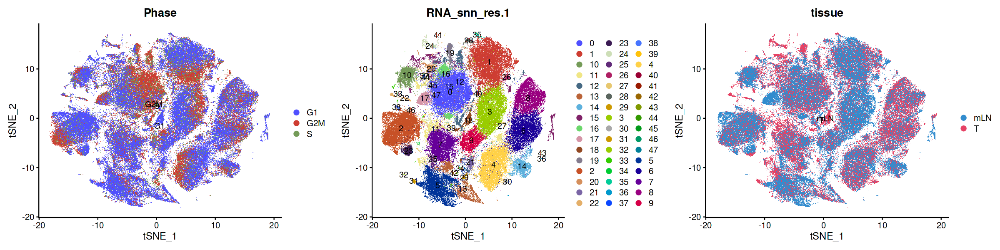

In [33]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggarrange(DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "Phase"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "RNA_snn_res.1"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         
          DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=3     
        )

#### 4.3 气泡图

In [ ]:
T_genes <- list( 
               T =  c('CD3D','CD3E','CD3G'),##T
               NK=c('KLRD1','KLRB1'),###NK                             
               CD8 = c('CD8A','CD8B'),
               CD8_Ex =c('LAG3','PDCD1','HAVCR2','TIGIT','CTLA4'),##CD8 Ex
               CD8_EFF =c('IFNG','GZMA','GZMK','GZMB','NKG7'),#CD8 EFF
                Memory_T=c('IL7R','CD44','LTB'),##Memory T
                Naive_T=c('CCR7','LEF1','SELL','TCF7'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4
               #CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),
               # CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),               
               B=c('CD79A','CD79B','MS4A1'),##B
               plasma_B=c('IGHG1','JCHAIN'))

In [34]:
immune_genes <- list(
               epi=c('EPCAM','KRT8','KRT19'),              
               T =  c('PTPRC','CD3D','CD3E','CD3G'),##T
               NK=c('KLRD1','KLRB1','KLRF1'),###NK
               
                CD4_Ex = c('CD4','CXCL13', 'TIGIT'),
                CD8_Ex =c('CD8A','LAG3','PDCD1','HAVCR2','CTLA4'),##CD8 Ex,'TIGIT'
                CD8_EFF =c('IFNG','GZMA','GZMK','GZMB','NKG7'),#CD8 EFF
               # CD8_EM =c('CXCR4','EOMES','CCL5', 'ANXA1'),
                 #MAIT=c('SLC4A10'),
                #Memory_T=c('IL7R','CD44','LTB','JUNB', 'FOSB','KLF2','ANXA1', 'LMNA'),##Memory T
                #Tcm =c('JUNB', 'FOSB','KLF2'),
                #Tem =c('ANXA1', 'LMNA','IL7R','CCL5','CXCR4','EOMES'),
                Naive_T=c('CCR7','LEF1','SELL','TCF7'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4
              # CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),
               # CD4_Th=c('IRF4','CREM','NR4A2','STAT4','IL12RB2','GATA3','STAT6','IL4'),
               
               #B=c('CD79A','CD79B','MS4A1'),##B
               #plasma_B=c('IGHG1','IGHA1','JCHAIN'),
               Mac=c("CD68",'CD163','TPSAB1','TPSB2')
          # profile = c('MKI67')
               #Myeloid=c('CD68','CD14','TPSAB1','TPSB2')
                #Mac=c("CD68",'CD163','CD86',"CD80",'MRC1','MSR1','APOE')
                #M1 =c("CD68",'IL12A','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','TGFB1','CCL18'),
                #Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                #Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
              # Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
              # Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37"),
              #  cDC1 = c("CLEC9A",'FLT3','IDO1'),
                #cDC2=c('CD1C','FCER1A','CLEC10A'),
                #cDC3 =  c("LAMP3",'FSCN1'),
                #pDC=c('CLEC4C','IL3RA','LILRA4'),
                #cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A",'FLT3','IDO1'),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               #Mast= c('TPSAB1','TPSB2')
    
)

In [41]:
table(seurat_T$RNA_snn_res.1)


    0     1    10    11    12    13    14    15    16    17    18    19     2 
29262 27572  6670  6399  5478  5386  5367  4873  3709  3420  3345  2643 22629 
   20    21    22    23    24    25    26    27    28    29     3    30    31 
 2370  2145  1865  1745  1666  1251   867   726   685   613 19995   542   526 
   32    33    34    35    36    37    38    39     4    40    41    42    43 
  446   424   344   267   191   179   179   146 18278   133   113    90    61 
   44    45    46    47     5     6     7     8     9 
    2     2     2     2 16291 15025 13742 12851  8148 

In [43]:
options(repr.plot.height = 10, repr.plot.width = 20)
DotPlot(seurat_T, features = immune_genes, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.1.2') + scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

ERROR: Error: Cannot find 'RNA_snn_res.1.2' in this Seurat object


In [62]:
Idents(seurat_T) <- seurat_T@meta.data$RNA_snn_res.1
df <- FindMarkers(seurat_T, ident.1 = "0", min.pct = 0.25,logfc.threshold = 0.25)

In [63]:
df[order(df$avg_log2FC,decreasing = T),]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
MT1E,0.000000e+00,1.7463792,0.284,0.168,0.000000e+00
MT1X,0.000000e+00,1.5089336,0.378,0.277,0.000000e+00
MT2A,0.000000e+00,1.3149620,0.516,0.433,0.000000e+00
IL7R,0.000000e+00,0.6841144,0.646,0.424,0.000000e+00
ANXA1,0.000000e+00,0.5602934,0.494,0.352,0.000000e+00
MT-ATP8,3.463210e-07,0.5600117,0.249,0.253,1.637025e-02
CCR7,0.000000e+00,0.5253176,0.392,0.301,0.000000e+00
CD3G,0.000000e+00,0.4904743,0.473,0.355,0.000000e+00
LEPROTL1,0.000000e+00,0.4743177,0.524,0.415,0.000000e+00


In [75]:
c <- seurat_T@meta.data$celltype_new_refined

In [42]:
table(seurat_qc$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
      21923       23356      128983       41075      236033       61114 

In [99]:
cell <- row.names(seurat_T@meta.data)[which(seurat_T@meta.data$RNA_snn_res.1%in%c('14','27','30','25','34','16','40'))]
seurat_qc@meta.data[cell,'celltype'] <- 'Epithelium'

In [100]:
cell <- row.names(seurat_T@meta.data)[which(seurat_T@meta.data$RNA_snn_res.1%in%c('45'))]
seurat_qc@meta.data[cell,'celltype'] <- 'Myeloid'

In [36]:
cell <- row.names(seurat_T@meta.data)[which(seurat_T@meta.data$RNA_snn_res.1%in%c('47','20','15','46','44','45','36','24','18','37'))]
seurat_qc@meta.data[cell,'celltype'] <- 'doublet'

In [136]:
table(seurat_qc$celltype)


Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
      23142      189364       45580      189491       64413 

In [77]:
table(seurat_T@meta.data$celltype_test)


       B   CD4_Ex CD4_Treg  CD8_EFF   CD8_Ex  Naive_T       NK plasma_B 
   46242     4214    15088    10794    14580    94068    16063    13891 

In [78]:
table(seurat_T@meta.data$celltype_new_refined)


       B   CD4_Ex CD4_Treg  CD8_EFF   CD8_Ex  Naive_T       NK plasma_B 
   46242     4214    15088    11052    14322    94068    16063    13891 

In [79]:
11052-10794

[1] 258

In [9]:
seurat_qc@meta.data$celltype_new <- seurat_qc@meta.data$celltype

In [12]:
table(seurat_qc@meta.data$celltype_new)


           B  Endothelial   Epithelium   Fibroblast      Myeloid       NK/NKT 
       39233        27522       147757        41320        63113        44747 
    Plasma_B            T T_Epithelium 
       13886        93598        13709 

In [11]:
cells <- row.names(seurat_qc@meta.data)[which(seurat_qc@meta.data$celltype%in%c('T','NK/NKT','B','Plasma_B'))]

In [15]:
seurat_qc@meta.data[cell,'celltype_new'] <- 'Epithelium'

In [39]:
table(seurat_qc@meta.data$celltype_new)


          B  Cell_cycle Endothelial  Epithelium  Fibroblast     Myeloid 
      44434       21458       28055      149271       46912       61263 
     NK/NKT    Plasma_B           T   Undefined 
      45777       14754      111551        9651 

In [13]:
cell <- setdiff(cells,row.names(seurat_T@meta.data))

In [11]:
cell <- row.names(seurat_T@meta.data)[which(seurat_T@meta.data$RNA_snn_res.1%in%c('25','32','20','39','31','17','16'))]
seurat_qc@meta.data[cell,'celltype_new'] <- 'T_Epithelium'

In [13]:
seurat_T <- subset(seurat_T, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_T$RNA_snn_res.1), c('25','32','20','39','31','17','16')))

In [14]:
seurat_T

An object of class Seurat 
49269 features across 191464 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [16]:
seurat_qc@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>
GSM1909307_AAACCTGAGATGGGTC-1,GSM1909307,1898,872,BRCA2,GSM1909307,BRCA0040,T,9.272919,0,0,-0.001015388,-0.073124516,G1,0,17,21,25,25,Epithelium
GSM1909307_AAACCTGAGTCTTGCA-1,GSM1909307,3266,1025,BRCA2,GSM1909307,BRCA0040,T,6.644213,0,0,-0.065062899,-0.070974074,G1,0,17,21,25,25,Epithelium
GSM1909307_AAACCTGCATCACGAT-1,GSM1909307,3657,1317,BRCA2,GSM1909307,BRCA0040,T,4.539240,0,0,-0.013938450,-0.016038249,G1,1,1,2,3,3,Epithelium
GSM1909307_AAACCTGGTCATCCCT-1,GSM1909307,3265,1307,BRCA2,GSM1909307,BRCA0040,T,5.941807,0,0,-0.068150227,-0.088438604,G1,3,1,2,3,3,Epithelium
GSM1909307_AAACCTGGTGCAGACA-1,GSM1909307,3755,1141,BRCA2,GSM1909307,BRCA0040,T,6.205060,0,0,-0.056820921,-0.074694691,G1,0,1,2,3,3,Epithelium
GSM1909307_AAACCTGTCCCATTTA-1,GSM1909307,1433,650,BRCA2,GSM1909307,BRCA0040,T,2.930914,0,0,-0.062780389,-0.039738517,G1,10,4,4,4,4,Myeloid
GSM1909307_AAACCTGTCGCAGGCT-1,GSM1909307,2193,955,BRCA2,GSM1909307,BRCA0040,T,4.286366,0,0,0.012896734,-0.069399943,S,3,1,2,3,3,Epithelium
GSM1909307_AAACCTGTCTATCCTA-1,GSM1909307,5536,1663,BRCA2,GSM1909307,BRCA0040,T,4.533960,0,0,-0.014180652,-0.051743783,G1,3,1,2,3,3,Epithelium
GSM1909307_AAACGGGAGACTAGGC-1,GSM1909307,11701,2850,BRCA2,GSM1909307,BRCA0040,T,3.392872,0,0,0.027720654,-0.106971360,S,3,0,0,0,0,T


In [10]:
seurat_qc@meta.data$celltype_new <- seurat_qc@meta.data$celltype

In [20]:
table(seurat_qc@meta.data$celltype_new)


          B  Cell_cycle Endothelial  Epithelium  Fibroblast     Myeloid 
      44679       21458       28055      146677       46912       61494 
     NK/NKT    Plasma_B           T   Undefined 
      46226       15020      112954        9651 

In [19]:
seurat_qc@meta.data[cell,'celltype_new'] <- 'Epithelium'

In [421]:
filter(marker_T_1[order(marker_T_1$avg_log2FC,decreasing = T),],cluster=='23')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
JUND2,0.000000e+00,2.436575,0.972,0.494,0.000000e+00,23,JUND
LINC015781,0.000000e+00,2.376436,0.658,0.059,0.000000e+00,23,LINC01578
ARL4C5,0.000000e+00,2.024816,0.830,0.319,0.000000e+00,23,ARL4C
UBE2S3,0.000000e+00,1.965226,0.797,0.216,0.000000e+00,23,UBE2S
SELENOK3,0.000000e+00,1.946648,0.814,0.190,0.000000e+00,23,SELENOK
TNFAIP35,0.000000e+00,1.919186,0.926,0.430,0.000000e+00,23,TNFAIP3
ATP1B34,0.000000e+00,1.858615,0.694,0.235,0.000000e+00,23,ATP1B3
EZR4,0.000000e+00,1.762146,0.889,0.456,0.000000e+00,23,EZR
CEMIP22,0.000000e+00,1.750580,0.577,0.107,0.000000e+00,23,CEMIP2


In [219]:
seurat_T <- subset(seurat_T, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_T$RNA_snn_res.1), c('25','32','20','39','31','17','16')))

In [220]:
seurat_T

An object of class Seurat 
49269 features across 191464 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [414]:
table(seurat_T$`RNA_snn_res.1`)


    0     1    10    11    12    13    14    15    16    17    18    19     2 
25579 23344  8618  7275  5709  4955  2850  2486  2262  2090  2082  2010 22157 
   20    21    22    23    24    25    26    27    28    29     3    30    31 
 1835  1789  1382  1344  1207  1181   626   289   215   187 17859   184   144 
    4     5     6     7     8     9 
15467 15167 14418 11447 11416  9189 

In [211]:
seurat_epi <- subset(seurat_epi, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_epi$RNA_snn_res.1), c('53','50','47','13')))

In [212]:
seurat_epi

An object of class Seurat 
49269 features across 129390 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [117]:
seurat_T_test <- seurat_T

In [156]:
seurat_T

An object of class Seurat 
49269 features across 165726 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [ ]:
load('/home/zhouyao/Pan_cancer/Result/patient/result/marker_T_1.RData')

In [ ]:
table(marker_T_1$cluster)

#### 4.4 去掉cluster，重新命名

In [ ]:
unique(seurat_T$RNA_snn_res.1)

In [ ]:
seurat_T <- readRDS('/home/zhouyao/Pan_cancer/last_result/seurat_T.Rds')

In [ ]:
seurat_T

In [ ]:
Idents(seurat_T) <- seurat_T$RNA_snn_res.1
seurat_T <- RenameIdents(seurat_T,
    "19" = "18", "20" = "19", "21" = "20", "22" = "21",
    "23" = "22", "24" = "23", "25" = "24",
 "26" = "25"
)
seurat_T$seurat_clusters <- Idents(seurat_T)

#### 4.5 细胞类型注释

In [ ]:
table(seurat_TT@meta.data$celltype_new)

In [ ]:
table(seurat_TT$`RNA_snn_res.1`)

In [ ]:
filter(seurat_T@meta.data,RNA_snn_res.1==13)

In [ ]:
colnames(seurat_T@meta.data)

In [46]:
NK=c(9,10)
#NKT=c()
B=c(19,3,2,16,25)
plasma_B =c(17,15,8)
CD8_Ex =c(32,33,5)
CD4_Ex =c(14)
CD8_EFF =c(31,29,7,30)
#Memory_T=c(6,7)
Naive_T=c(20,21,24,18,27,0,1,6,12,26,13,11) 
Treg=c(4)
#Doublet_T=c(10,25,23)
#Epi_T =c(27,29)
#Undefined=c(27,18,28,38,19,43)
current.cluster.ids <- c(
                         NK,                         
                         B,
                         plasma_B,
                         Treg,
                         CD4_Ex,                         
                         CD8_Ex ,                         
                         CD8_EFF,   
                       # Memory_T,
                         Naive_T    
                        
                         #Doublet_T
                        # Epi_T
                        )

new.cluster.ids <- c( 
                     rep("NK",length(NK)),
                     rep("B",length(B)),
                     rep("plasma_B",length(plasma_B)),
                     rep("CD4_Treg",length(Treg)),
                     rep("CD4_Ex",length(CD4_Ex)),
                     rep("CD8_Ex",length(CD8_Ex)),
                     rep("CD8_EFF",length(CD8_EFF)),  
                     #rep("Memory_T",length(Memory_T)) ,
                     rep("Naive_T",length(Naive_T))                   
                   # rep("Doublet_T",length(Doublet_T))
                     #rep("Epi_T",length(Epi_T))                    
                   )
seurat_T@meta.data$celltype_new_refined <- plyr::mapvalues(x = as.character(seurat_T@meta.data$RNA_snn_res.1), from = current.cluster.ids, to = new.cluster.ids)

In [44]:
table(seurat_T@meta.data$RNA_snn_res.1)


    0     1    10    11    12    13    14    15    16    17    18    19     2 
27904 26095  7863  7555  5395  5226  4214  3137  2454  2404  2280  2150 22722 
   20    21    22    23    24    25    26    27    28    29     3    30    31 
 2005  1718  1389     0  1088  1052  1035   556     0   250 17864   212    90 
   32    33    34     4     5     6     7     8     9 
   52    32     0 15088 14238 13211 10500  8350  8200 

In [49]:
table(seurat_T@meta.data$celltype_new_refined)


       B   CD4_Ex CD4_Treg  CD8_EFF   CD8_Ex  Naive_T       NK plasma_B 
   46242     4214    15088    11052    14322    94068    16063    13891 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



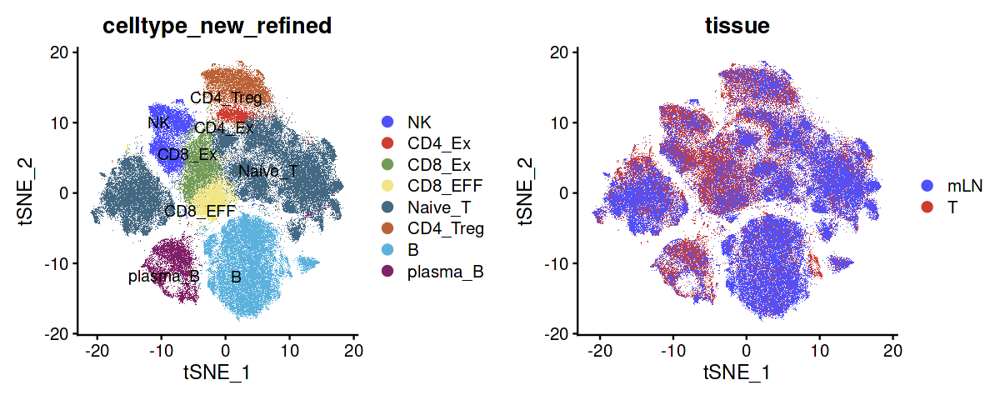

In [66]:
options(repr.plot.height = 4, repr.plot.width = 10)
ggarrange(DimPlot(repel = TRUE,
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "celltype_new_refined"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
DimPlot(
  seurat_T,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_igv())

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


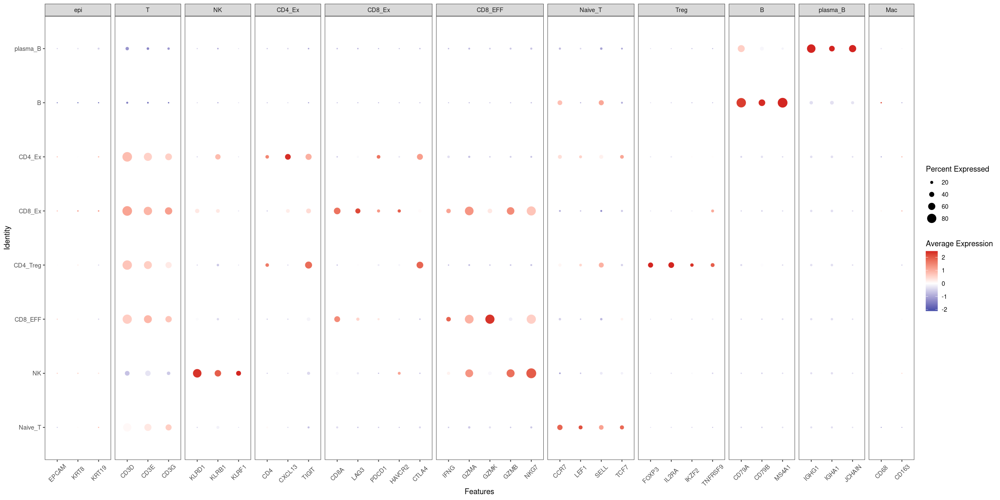

In [51]:
options(repr.plot.height = 10, repr.plot.width = 20)
DotPlot(seurat_T, features = immune_genes, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'celltype_new_refined') + scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+
  theme_bw()+
  theme( panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

#### 4.6 热图展示marker gene

In [323]:
immune_gene <- list(
               NK=c('KLRD1','KLRB1','KLRF1'),###NK
               T =  c('CD3D','CD3E','CD3G'),##T                                          
                CD4_Ex = c('CD4','CXCL13', 'TIGIT'),
                CD8_Ex =c('CD8A','LAG3','PDCD1','HAVCR2'),##CD8 Ex,'TIGIT'
                CD8_EFF =c('IFNG','GZMA','GZMK'),#CD8 EFF              
                Naive_T=c('CCR7','LEF1','SELL','TCF7'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4                         
               B=c('CD79A','CD79B','MS4A1'),##B
               plasma_B=c('IGHG1','IGHA1','JCHAIN')
               # Mac=c("CD68",'CD163','CD86','MRC1','MSR1'),
                #M1 =c("CD68",'CD86','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','MSR1','TGFB1','CCL18'),
                # Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                # Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
              # Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
               # Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37"),
                # cDC1 = c("CLEC9A",'FLT3','IDO1'),
                # cDC2=c('CD1C','CD1E','FCER1A','CLEC10A'),
                # cDC3 =  c("LAMP3",'FSCN1'),
                # pDC=c('CLEC4C','IL3RA','LILRA4'),
              #  cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A"),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               # Mast= c('TPSAB1','TPSB2','MS4A2','KIT')
)
heatmap_gene <- unlist(immune_gene)
names(heatmap_gene) <- NULL
length(unique(heatmap_gene))
heatmap_gene

[1] 30

[1] "KLRD1"   "KLRB1"   "KLRF1"   "CD3D"    "CD3E"    "CD3G"    "CD4"    
 [8] "CXCL13"  "TIGIT"   "CD8A"    "LAG3"    "PDCD1"   "HAVCR2"  "IFNG"   
[15] "GZMA"    "GZMK"    "CCR7"    "LEF1"    "SELL"    "TCF7"    "FOXP3"  
[22] "IL2RA"   "IKZF2"   "TNFRSF9" "CD79A"   "CD79B"   "MS4A1"   "IGHG1"  
[29] "IGHA1"   "JCHAIN"

In [324]:
###计算marker gene 在细胞类型的表达均值
heatmap_AveE <- AverageExpression(seurat_T, assays = "RNA", features = heatmap_gene,verbose = TRUE, group.by ='celltype_new_refined' ) %>% .$RNA
heatmap_AveE.scale <- t(scale(t(heatmap_AveE)))
###规定颜色
col_fun <- colorRamp2(
  c(-2, 0, 2), 
  c("#4393C3", "white", "#B2182B")
  )

In [326]:
annotation_row <- rowAnnotation(
    annotation_name_gp = gpar(
        fontsize = 5
      ),
df = data.frame( celltype = c(rep('NK',6), ####5是marker 基因个数
                              rep('CD4_Ex',3),
               rep('CD8_Ex',4),
               rep('CD8_EFF',3),
               rep('Naive_T',4),
               rep('CD4_Treg',4),
               rep('B',3),
               rep('plasma_B',3))), 
col = list(
    celltype = c('NK'='#E64B35FF', ####指定颜色'#8491B4FF','#91D1C2FF','#7E6148FF'
'CD4_Ex'= '#4DBBD5FF', 
'CD8_Ex'='#00A087FF',
'CD8_EFF'='#3C5488FF',
'Naive_T'='#F39B7FFF',
'CD4_Treg'='#8491B4FF',
'B'='#91D1C2FF',
'plasma_B'='#7E6148FF'
# 'Macrophages'="#0099B4FF",
# 'Mono_CD14'="#ED0000FF",
# 'Mono_CD16'="#42B540FF",
# 'Neutrophils'="#00468BFF",
# 'cDC1'="#FDAF91FF",
# 'cDC2'="#AD002AFF",
# 'cDC3'="#ADB6B6FF",
# 'pDC'="#925E9FFF",
# 'Mast'='#374e55'
)
    )
  )

In [329]:
####绘制热图
options(repr.plot.height = 10, repr.plot.width = 5)
 T_heatmap<- Heatmap(heatmap_AveE.scale,name = "z_score",cluster_rows = F,cluster_columns = F, col = col_fun,
        rect_gp = gpar(col = "white", lwd = 1),###添加白线分割
        column_names_side  = "top",
        column_names_rot=45, ###调整列名角度
        #annotation_names_rot=45,
        column_names_gp = gpar(
        fontsize = 12
      ),
        
        
        left_annotation=annotation_row,
        
        row_split= factor(c(rep('NK',6), ###添加分隔
            rep('CD4_Ex',3),
               rep('CD8_Ex',4),
               rep('CD8_EFF',3),
               rep('Naive_T',4),
               rep('CD4_Treg',4),
               rep('B',3),
               rep('plasma_B',3)
               # rep('Macrophages',5),
               # rep('Mono_CD14',4),
               # rep('Mono_CD16',3),
               # rep('Neutrophils',5),              
               # rep('cDC1',3),
               # rep('cDC2',4),
               # rep('cDC3',2),
               # rep('pDC',3),
               # rep('Mast',4)
),
            levels=c('NK','CD4_Ex','CD8_Ex','CD8_EFF','Naive_T','CD4_Treg','B','plasma_B')),###按照细胞类型进行分割
        cluster_row_slices = FALSE,
        column_order=c('NK','CD4_Ex','CD8_Ex','CD8_EFF','Naive_T','CD4_Treg','B','plasma_B')
       )

In [330]:
pdf('/home/zhouyao/pancancer/figure/T_heatmap.pdf',width = 5,height = 10)
T_heatmap
dev.off()
dev.off()

png 
  2

null device 
          1

#### 4.7 点图展示marker gene

In [192]:
immune_gene <- list(
    T =  c('CD3D','CD3E','CD3G'),##T             
    NK=c('KLRD1','KLRB1','KLRF1'),###NK
                                                      
                CD4_Ex = c('CD4','CXCL13', 'TIGIT'),
                CD8_Ex =c('CD8A','LAG3','PDCD1','HAVCR2'),##CD8 Ex,'TIGIT'
                CD8_EFF =c('IFNG','GZMA','GZMK'),#CD8 EFF              
                Naive_T=c('CCR7','LEF1','SELL','TCF7'),###Naive T
                Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4                         
               B=c('CD79A','CD79B','MS4A1'),##B
               plasma_B=c('IGHG1','IGHA1','JCHAIN')
               # Mac=c("CD68",'CD163','CD86','MRC1','MSR1'),
                #M1 =c("CD68",'CD86','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','MSR1','TGFB1','CCL18'),
                # Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                # Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
              # Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
               # Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37"),
                # cDC1 = c("CLEC9A",'FLT3','IDO1'),
                # cDC2=c('CD1C','CD1E','FCER1A','CLEC10A'),
                # cDC3 =  c("LAMP3",'FSCN1'),
                # pDC=c('CLEC4C','IL3RA','LILRA4'),
              #  cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A"),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               # Mast= c('TPSAB1','TPSB2','MS4A2','KIT')
)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


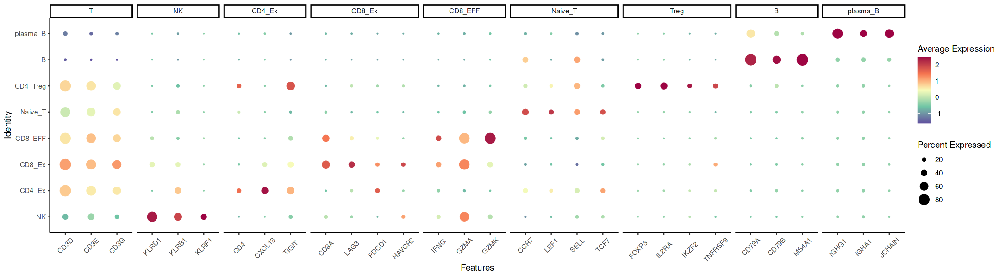

In [193]:
options(repr.plot.height = 5, repr.plot.width = 18)
Idents(seurat_T) <- seurat_T@meta.data$celltype_new_refined
DotPlot(seurat_T, features = immune_gene, 
        assay='RNA') +scale_color_gradientn(values = seq(0,1,0.2),colours = c('#5f509f','#6fc5a5','#f7fcba','#f47350','#9d0343'))+#scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+#scale_color_gradientn(values = seq(0,1,0.2),colours = c('#5f509f','#6fc5a5','#f7fcba','#f47350','#9d0343'))+#
  theme_classic()+
  theme(panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

### 5、髓系细胞再聚类

#### 5.1 重新降维聚类

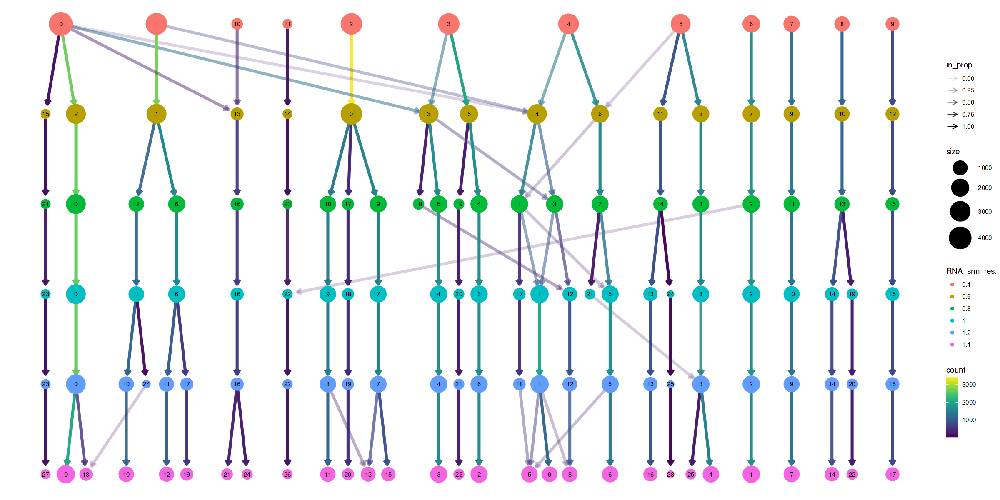

In [17]:
options(repr.plot.height = 10, repr.plot.width = 20)
clustree(seurat_Mac,prefix = 'RNA_snn_res.')

In [15]:
colnames(seurat_Mac@meta.data)

[1] "orig.ident"                "nCount_RNA"               
 [3] "nFeature_RNA"              "cancer"                   
 [5] "sampleid"                  "patient"                  
 [7] "tissue"                    "percent.mt"               
 [9] "nCount_integrated"         "nFeature_integrated"      
[11] "S.Score"                   "G2M.Score"                
[13] "Phase"                     "old.ident"                
[15] "RNA_snn_res.0.4"           "RNA_snn_res.0.6"          
[17] "RNA_snn_res.0.8"           "seurat_clusters"          
[19] "celltype"                  "celltype_new"             
[21] "RNA_snn_res.1"             "RNA_snn_res.1.2"          
[23] "RNA_snn_res.1.4"           "celltype_new_refined"     
[25] "RNA_snn_res.1.6"           "RNA_snn_res.1.8"          
[27] "celltype_new_refined_last" "cancer1"

In [16]:
seurat_Mac@meta.data <- seurat_Mac@meta.data[,setdiff(colnames(seurat_Mac@meta.data),c('RNA_snn_res.1.6','RNA_snn_res.1.8'))]

In [28]:
seurat_Myeloid

An object of class Seurat 
51164 features across 70057 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [27]:
table(seurat_qc$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
        448       23356      130893       41075      254717       61995 

In [15]:
seurat_Myeloid <- subset(seurat_qc,subset=celltype%in%c('Myeloid'))
seurat_Myeloid

An object of class Seurat 
51164 features across 67660 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [22]:
se <- subset(seurat_Myeloid,RNA_snn_res.1=='1')

In [23]:
se

An object of class Seurat 
51164 features across 5443 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, tsne

In [ ]:
seurat_Myeloid%<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c(,"nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony(c("sampleid"), plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:20) %>%
  FindClusters(resolution = c(1,1.2))%>%
  #RunUMAP(reduction = "harmony", dims = 1:20)%>%
  RunTSNE(reduction = "harmony", dims = 1:20)

In [ ]:
#saveRDS(seurat_Myeloid, "/home/zhouyao/pancancer/seurat_myeloid.Rds")
se %<>% NormalizeData(normalization.method = "LogNormalize") %>%
  FindVariableFeatures(selection.method = "vst")%>%
  ScaleData(vars.to.regress = c("S.Score","G2M.Score","nCount_RNA","percent.mt"))%>%
  RunPCA()%>%
  RunHarmony(c("patient",'cancer'), plot_convergence = TRUE)%>%
  FindNeighbors(reduction = "harmony", dims = 1:20) %>%
  FindClusters(resolution = c(0.4,0.6,0.8,1,1.2,1.4))%>%
  RunUMAP(reduction = "harmony", dims = 1:20)%>%
  RunTSNE(reduction = "harmony", dims = 1:20)

In [28]:
seurat_Mac <- RunTSNE(seurat_Mac,reduction = "harmony", dims = 1:20)

In [142]:
saveRDS(seurat_Mac, "/home/zhouyao/pancancer/data/seurat_Mac.Rds")
Idents(seurat_Mac) <- seurat_Mac@meta.data$RNA_snn_res.0.4

In [34]:
Idents(seurat_Mac) <- seurat_Mac@meta.data$RNA_snn_res.1

In [ ]:
marker_Myeloid <- FindAllMarkers(seurat_Mac, only.pos = TRUE, min.pct = 0.25)
save(marker_Mac_1, file="/home/zhouyao/pancancer/data/marker_Mac_1.RData")

In [25]:
load("/home/zhouyao/pancancer/data/marker_Mac_1.RData")

In [153]:
seurat_Myeloid <- RunTSNE(seurat_Myeloid,reduction = "harmony", dims = 1:30)

In [72]:
Idents(seurat_Myeloid) <- seurat_Myeloid@meta.data$RNA_snn_res.1

In [ ]:
seurat_Myeloid%<>% RunUMAP(reduction = "harmony", dims = 1:30)%>%
  RunTSNE(reduction = "harmony", dims = 1:30)

In [ ]:
Idents(seurat_Myeloid) <- seurat_Myeloid@meta.data$RNA_snn_res.1
marker_Myeloid <- FindAllMarkers(seurat_Myeloid, only.pos = TRUE, min.pct = 0.25)

In [115]:
marker_Myeloid_1

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CCL18,0,2.5379984,0.381,0.144,0,0,CCL18
APOE,0,1.8579720,0.940,0.528,0,0,APOE
APOC1,0,1.7325810,0.907,0.532,0,0,APOC1
GPNMB,0,1.6464172,0.763,0.370,0,0,GPNMB
SEPP1,0,1.4427129,0.464,0.175,0,0,SEPP1
SLC40A1,0,1.4107928,0.585,0.218,0,0,SLC40A1
LGMN,0,1.3764823,0.754,0.395,0,0,LGMN
C1QB,0,1.3533325,0.958,0.521,0,0,C1QB
C1QC,0,1.3509643,0.954,0.502,0,0,C1QC


#### 5.2 点图

In [ ]:
table(seurat_myeloid$RNA_snn_res.1)

In [105]:
seurat_Myeloid@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,RNA_snn_res.1,RNA_snn_res.1.2,RNA_snn_res.1.4,celltype_new_refined
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<fct>,<fct>,<chr>
GSM1909307_AAACGGGCATGGTCAT-1,GSM1909307,3571,1223,BRCA2,GSM1909307,BRCA0040,T,3.444413,0,0,⋯,4,4,4,19,Myeloid,Macrophages,8,15,19,Mac_C1QC
GSM1909307_AAAGCAACAGGTTTCA-1,GSM1909307,692,436,BRCA2,GSM1909307,BRCA0040,T,9.826590,0,0,⋯,4,4,4,10,Myeloid,Macrophages,5,3,10,Mac_SPP1
GSM1909307_AAAGTAGAGCTACCGC-1,GSM1909307,1315,603,BRCA2,GSM1909307,BRCA0040,T,1.749049,0,0,⋯,4,4,4,5,Myeloid,Macrophages,0,2,5,Mac_C1QC
GSM1909307_AACACGTGTAAGTAGT-1,GSM1909307,797,492,BRCA2,GSM1909307,BRCA0040,T,3.638645,0,0,⋯,4,4,4,5,Myeloid,Macrophages,8,2,5,Mac_C1QC
GSM1909307_AACTTTCGTTATGCGT-1,GSM1909307,1191,619,BRCA2,GSM1909307,BRCA0040,T,3.694374,0,0,⋯,9,9,9,19,Myeloid,Macrophages,8,15,19,Mac_C1QC
GSM1909307_AAGACCTCACCACCAG-1,GSM1909307,823,445,BRCA2,GSM1909307,BRCA0040,T,3.037667,0,0,⋯,18,20,23,1,Myeloid,Mast,3,1,1,Mast
GSM1909307_AAGGCAGAGAGGTACC-1,GSM1909307,3029,1213,BRCA2,GSM1909307,BRCA0040,T,2.938263,0,0,⋯,4,4,4,19,Myeloid,Macrophages,8,15,19,Mac_C1QC
GSM1909307_AAGGCAGAGTGTCCAT-1,GSM1909307,634,359,BRCA2,GSM1909307,BRCA0040,T,4.574132,0,0,⋯,18,20,23,1,Myeloid,Mast,3,1,1,Mast
GSM1909307_AAGGCAGGTGCAACGA-1,GSM1909307,525,333,BRCA2,GSM1909307,BRCA0040,T,4.571429,0,0,⋯,4,4,4,5,Myeloid,Macrophages,0,2,5,Mac_C1QC


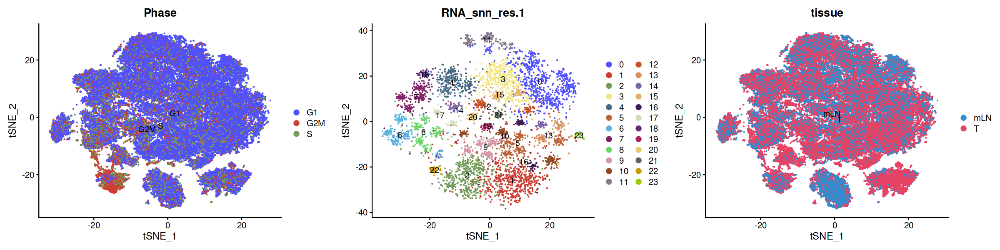

In [27]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggarrange(DimPlot(
  seurat_Myeloid,reduction = "tsne",pt.size = 0.1,group.by = "Phase"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),
         DimPlot(
  se,reduction = "tsne",pt.size = 0.1,group.by = "RNA_snn_res.1"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv(),      
          DimPlot(
  seurat_Myeloid,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_manual(values = c('#328cce','#e64264')),
         ncol=3
         )

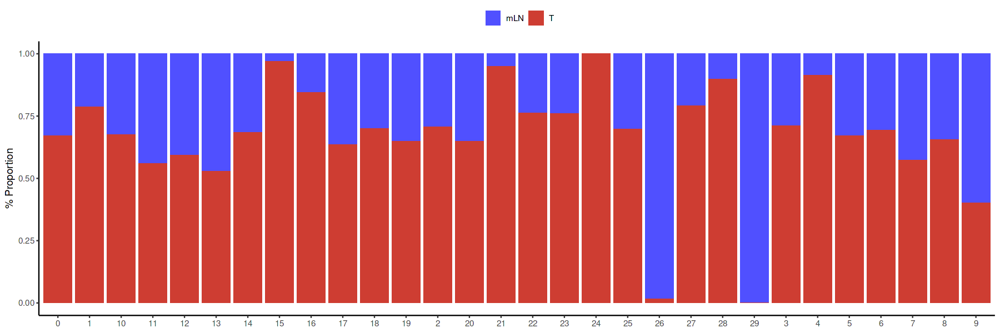

In [67]:
options(repr.plot.height = 5, repr.plot.width = 15)
bar_per <- as.data.frame(table(seurat_Myeloid@meta.data$`RNA_snn_res.1`,
           seurat_Myeloid@meta.data[,'tissue'])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
 ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ) +labs(y = "% Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_igv()

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 10)
DimPlot(
  seurat_Mono,split.by = 'tissue',reduction = "tsne",pt.size = 0.5,group.by = "RNA_snn_res.1"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE)+scale_color_igv()

#### 5.3 气泡图

In [19]:
myeloid_genes <- list(  
    immune <- c('PTPRC'),
     epi=c('EPCAM','KRT8','KRT19'),              
               T =  c('CD8A','CD3D','CD3E','CD3G'),##T
  #  T =  c('TRDC','TRGC2','TRGC1'),##T
      # CD8 = c('CD8A','CD4'),
       #         CD8_Ex =c('LAG3','PDCD1','HAVCR2','TIGIT','CTLA4'),##CD8 Ex
        #        CD8_EFF =c('IFNG','GZMA','GZMK','GZMB','NKG7'),#CD8 EFF
    #Naive_T=c('LEF1','SELL','TCF7'),###Naive T
              #  Treg=c('FOXP3','IL2RA','IKZF2','TNFRSF9'),##Treg,IKZF2,CD4
    B=c('CD79A','IGHG1','CD79B'),
    #fib=c('COL1A1'),
  Mac=c("CD68",'CD163','CD86',"ISG15",'PPARG','MSR1','MRC1','C1QC','APOE','C1QA','SPP1','MARCO','INHBA','IL1RN','CCL4','NLRP3','EREG','IL1B','LGALS9'),
                #M1 =c("CD68",'CD86','CXCL9','CXCL10'),
                #M2=c('CD163','MRC1','MSR1','TGFB1','CCL18'),
    #Mac=c('CD68','CD163','FN1','IL10'),
    #markers$M1 <- c('IL23', 'TNF', 'CXCL9', 'CXCL10', 'CXCL11', 'CD86', 'IL1A', 'IL1B', 'IL6', 'CCL5', 'IRF5', 'IRF1', 'CD40', 'IDO1', 'KYNU', 'CCR7')
#markers$M2 <- c('IL4R', 'CCL4', 'CCL13', 'CCL20', 'CCL17', 'CCL18', 'CCL22', 'CCL24', 
   #     'LYVE1', 'VEGFA', 'VEGFB', 'VEGFC', 'VEGFD', 'EGF', 'CTSA', 'CTSB', 'CTSC','CTSD', 'TGFB1', 'TGFB2', 'TGFB3', 
   #     'MMP14', 'MMP19', 'MMP9', 'CLEC7A', 'WNT7B', 'FASL', 'TNFSF12', 'TNFSF8', 'CD276', 'VTCN1', 'MSR1', 'FN1','IRF4')
    #M1=c( 'CD14','CD68','CCR7', 'CD80','CD86', 'TNF','CCL5', 'IL1A', 'IL1B', 'IL6','CXCL9','IRF5', 'IRF1', 'CD40'),#'FCGR3A',
    #M2=c('CD163', 'CCL4','MRC1','CTSB','CTSA','MSR1','IL4R','TGFB1','CD206','CD36', 'VEGFB', 'VEGFC','LGALS9')
    #M3=c('LGALS9', "CCL2"   ,  "CXCL10" ,  "CCL3L1"  , "TNF"  ,    "IL1RN"   , "TIMP1"  ,  "CCR1"  ,   "CCL3"   ,  "CXCL2" ,   "CCL4"   ,  "CCR5"    
     #      ,"CXCL8" ,   "IL6"   ,   "PTAFR"  ,  "TNFRSF1B" ,"CCL3L3")
     #M1=c( 'CD68','CD80','CD86', 'CCL5', 'IL1A', 'IL1B', 'CXCL9','IRF5', 'IRF1', 'CD40'),#'FCGR3A',
    #M2=c('CD163','MRC1','CTSB','MSR1','IL4R','CD206 ','CD36', 'VEGFB', 'VEGFC'),
   # M3=c('LGALS9', "CCL2"   ,  "CXCL10" ,  "CCL3L1"  , "TNF"  ,    "IL1RN"   , "TIMP1"  ,  "CCR1"  ,   "CCL3"   ,  "CXCL2" ,   "CCL4"   ,  "CCR5"    
     #      ,"CXCL8" ,   "IL6"   ,   "PTAFR"  ,  "TNFRSF1B" ,"CCL3L3")
    #Mac <- c('CD68','CD163','IL10'),
    #Mac_C1QC=c('C1QC','C1QA','APOE','CCL18'),
     #           Mac_SPP1=c('SPP1','CSTB','FABP5'),
      #          Mac_ISG15=c('ISG15','CXCL10','CCL8','IFIT2',''),
       #       Mac_IL1B=c('IL1B','CCL3L3','CCL3','CCL4'),
             #Mac_FN1=c('FN1','MARCO','RETN','CCL20')
    #Mac_C1QC=c('C1QC','C1QA','APOE'),
     #           Mac_SPP1=c('SPP1','CSTB','FABP5'),
      #          Mac_ISG15=c('ISG15','CXCL10','CCL8','IFIT2'),
       #       Mac_IL1B=c('IL1B','NLRP3','EREG'),
         #    Mac_FN1=c('FN1','MARCO','RETN','CCL20'),
          #   Mac_INHBA=c('INHBA','IL1RN','CCL4')
              #Mac_HSPA6=c('HSPA6','HSPA1B','DNAJB1'),  
   # Mono =c('CD14','FCGR3A','S100A12'),
    Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1"),###经典
                Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
               #Monocyte =c('CD14','FCGR3A',"FCN1",'LST1','LILRB2'),
               Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2","SLC25A37",'LSP1'),
                cDC1 = c("CLEC9A",'FLT3','IDO1'),
                cDC2=c('CD1C','CD1E','FCER1A','CLEC10A','HLA-DQA1'),
                cDC3 =  c("LAMP3",'FSCN1','CCR7'),
                pDC=c('CLEC4C','IL3RA','LILRA4'),
                #cDC=c('CD1C','FCER1A',"LAMP3",'FSCN1',"CLEC9A"),
               #pDC=c('LILRA4','CLEC4C','IL3RA'),
               #DC=c('CD1C','CLEC4C','CCR7','LAMP3','PTCRA'),
               Mast= c('TPSAB1','TPSB2','MS4A2','KIT'),
    Fibroblast=c('DCN','COL1A1','ACTA2'),##fib
  #muscle=c('ACTA2','TAGLN'),
  Endothelial=c('VWF','PECAM1')###ENDO
#Cell_cycle=c('MKI67','PCNA','STMN1')
)

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: CD206”


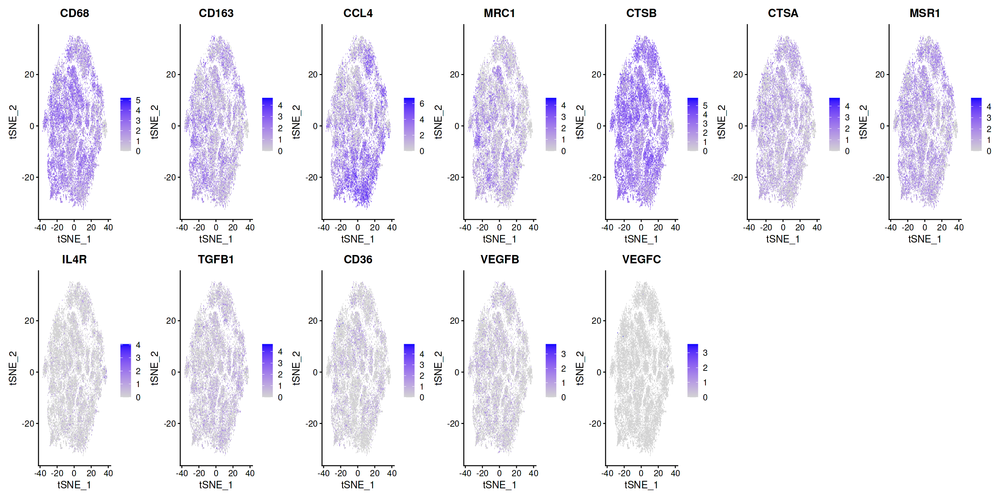

In [26]:
FeaturePlot(seurat_Mac,features = c('CD68','CD163', 'CCL4','MRC1','CTSB','CTSA','MSR1','IL4R','TGFB1','CD206','CD36', 'VEGFB', 'VEGFC'),reduction = 'tsne',ncol=7,raster = T)

In [107]:
filter(seurat@meta.data,RNA_snn_res.1==6)

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,RNA_snn_res.1,RNA_snn_res.1.2,RNA_snn_res.1.4,celltype_new_refined
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<fct>,<fct>,<chr>
GSM1909307_AGGTCATAGCTGAACG-1,GSM1909307,699,479,BRCA2,GSM1909307,BRCA0040,T,6.0085837,0,0,⋯,4,4,4,7,Myeloid,Neutrophils,6,7,7,Neutrophils
GSM1909309_ACATGGTGTCAGAATA-1,GSM1909309,965,534,BRCA2,GSM1909309,BRCA0043,T,2.7979275,0,0,⋯,4,4,4,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15
GSM1909309_CCTATTATCAGCTTAG-1,GSM1909309,1517,794,BRCA2,GSM1909309,BRCA0043,T,3.5596572,0,0,⋯,4,4,4,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15
GSM1909309_CTTCTCTTCGATGAGG-1,GSM1909309,1184,673,BRCA2,GSM1909309,BRCA0043,T,2.0270270,0,0,⋯,4,4,4,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15
GSM1909309_CTTCTCTTCGGACAAG-1,GSM1909309,912,537,BRCA2,GSM1909309,BRCA0043,T,2.6315789,0,0,⋯,9,9,9,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15
GSM1909309_GCTGCAGGTCGTCTTC-1,GSM1909309,774,462,BRCA2,GSM1909309,BRCA0043,T,5.2971576,0,0,⋯,9,9,9,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15
GSM1909309_GGGATGACAGCCTGTG-1,GSM1909309,826,463,BRCA2,GSM1909309,BRCA0043,T,1.3317191,0,0,⋯,9,9,9,7,Myeloid,Neutro_Mac,6,7,7,Mac_CCL4
GSM1909309_TAAGAGACAGCCAGAA-1,GSM1909309,534,349,BRCA2,GSM1909309,BRCA0043,T,5.9925094,0,0,⋯,9,9,9,11,Myeloid,Neutro_Mono,6,11,11,Mono_CD14
GSM1909309_TAAGAGATCCCAACGG-1,GSM1909309,857,547,BRCA2,GSM1909309,BRCA0043,T,2.8004667,0,0,⋯,4,4,4,7,Myeloid,Neutro_Mac,6,7,7,Mac_ISG15


In [110]:
table(seurat_qc$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
          2       21387      158931       40747      193266       67189 

In [26]:
se

An object of class Seurat 
51164 features across 5443 samples within 2 assays 
Active assay: RNA (49164 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, tsne, umap

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


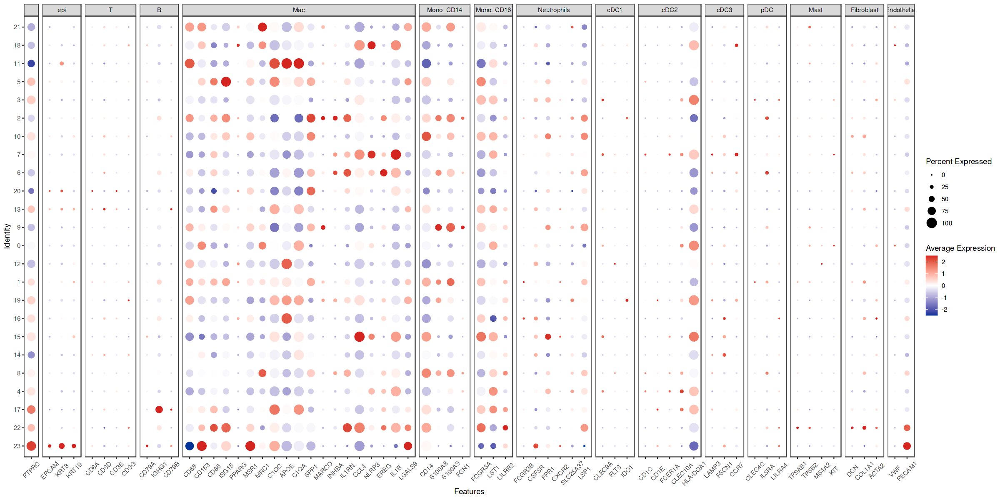

In [28]:
options(repr.plot.height = 10, repr.plot.width = 20)
DotPlot(se, features = myeloid_genes, cluster.idents = TRUE, 
        assay='RNA' ,group.by = 'RNA_snn_res.1') + scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+
  theme_bw()+
  theme(panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [94]:
filter(marker_Myeloid[order(marker_Myeloid$avg_log2FC,decreasing = T),],cluster=='14')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
IGKC2,1.940865e-197,3.621899,0.737,0.472,8.611231e-193,14,IGKC
IGHG1,3.495109e-71,3.016821,0.322,0.149,1.550710e-66,14,IGHG1
MS4A1,0.000000e+00,2.887222,0.685,0.021,0.000000e+00,14,MS4A1
CD79A,0.000000e+00,2.695844,0.678,0.032,0.000000e+00,14,CD79A
IGHM1,0.000000e+00,2.242553,0.374,0.074,0.000000e+00,14,IGHM
IGLC3,3.829867e-74,2.116811,0.298,0.133,1.699235e-69,14,IGLC3
IGLC22,8.532446e-117,2.037857,0.463,0.228,3.785676e-112,14,IGLC2
BANK1,0.000000e+00,1.776968,0.496,0.036,0.000000e+00,14,BANK1
CD79B,0.000000e+00,1.736858,0.516,0.038,0.000000e+00,14,CD79B


In [29]:
table(se$RNA_snn_res.1)


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
805 618 525 496 330 312 263 261 228 211 191 178 143 139 122 112 103  73  70  66 
 20  21  22  23 
 60  59  49  29 

In [128]:
table(seurat_qc$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
        963       21387      162601       41638      207313       47620 

In [100]:
seurat_qc@meta.data$celltype[which(seurat_qc@meta.data$celltype%in%'doublet')] <- 'Myeloid'

In [30]:
rm(list=ls())

In [32]:
table(seurat_qc@meta.data$celltype)


    doublet Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
       9291       23356      128983       41075      248665       61114 

In [ ]:
filter(seurat_qc@meta.data,cancer=='OP'&tissue=='mLN')

In [9]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1%in%c('12'))]
seurat_qc@meta.data[cell,'celltype'] <- 'Epithelium'

In [10]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1%in%c('16','4'))]
seurat_qc@meta.data[cell,'celltype'] <- 'Lymphocyte'

In [25]:
seurat_Myeloid@meta.data$RNA_snn_res.1

NULL

In [ ]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1%in%c('12','16','4','29','21'))]
cell

In [31]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1%in%c('12','16','4','29','21'))]
seurat_qc@meta.data[cell,'celltype'] <- 'doublet'

In [72]:
table(seurat_qc$celltype)


Endothelial  Epithelium  Fibroblast  Lymphocyte     Myeloid 
      21387      160851       40747      201567       56970 

In [134]:
table(seurat_Mac$`RNA_snn_res.0.4`)


   0    1    2    3    4    5    6    7    8    9   10   11 
5776 3793 3049 2826 2600 2326 2100 1521 1125  796  401  177 

In [37]:
seurat_Mac <- seurat_Mac_test

##### 5.2.1 展示差异maker

In [160]:
seurat_Mac

In [37]:
######巨噬细胞 M1,M2
#M1=c(19,7,4,16,17,18,12)
#M2=c(6,3,15,11,14,2,1,0,10,5,13,9,8,21,20,22)
M1=c(16,19)
M2=setdiff(unique(seurat_Mac$`RNA_snn_res.1`),M1)
#M1=c(14,11,6)
#M2=c(16,3,8,19,9,17,15,0,10,21,12,20,1,2,13,18,5,4,22,7)
current.cluster.ids <- c(
                            
                      M1,
                       M2  
                         
                        )

new.cluster.ids <- c(                                                          
                    rep("M1",length(M1)),
                    rep("M2",length(M2)) 
                   )
seurat_Mac@meta.data$celltype_new_refined_last_test <- plyr::mapvalues(x = as.character(seurat_Mac@meta.data$`RNA_snn_res.1`), from = current.cluster.ids, to = new.cluster.ids)

[1] "CD68"   "IRF1"   "IDO1"   "CD80"   "IL6"    "CD86"   "CD40"   "CCR7"  
 [9] "IL1B"   "CXCL10" "CXCL9"  "CD163"  "CCL4"   "CTSB"   "MSR1"   "FN1"

[1] 16

Warning message:
“Scaling data with a low number of groups may produce misleading results”
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


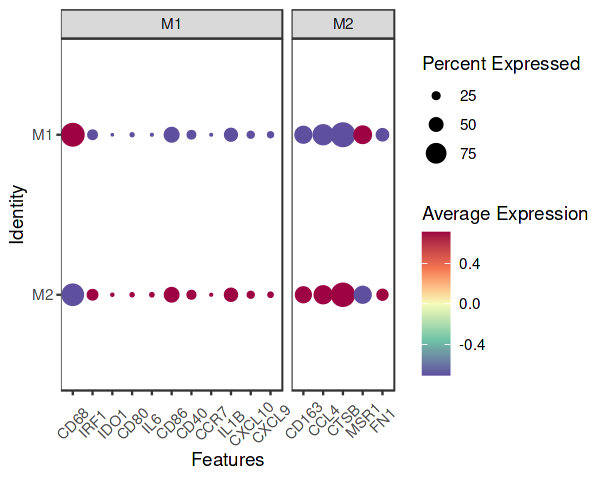

In [38]:
genes_to_check <- list(  
    
M1=c( 'CD68','IRF1','IDO1','CD80','IL6','CD86','CD40','CCR7','IL1B', 'CXCL10','CXCL9'),
    M2=c('CD163' ,'CCL4','CTSB','MSR1','FN1')
)
seurat_Mac$celltype_new_refined_last <- factor(seurat_Mac$celltype_new_refined_last_test,levels = rev(c('M1','M2')))
Idents(seurat_Mac) <- seurat_Mac$celltype_new_refined_last_test
genes <- unlist(genes_to_check)
names(genes) <- NULL
genes <- setdiff(genes,c('LILRA4','CLEC4C','TPSAB1','TPSB2'))
#genes <- factor(genes,levels = rev(genes))
#genes_to_check <- rev(genes_to_check)
genes
length(genes)

options(repr.plot.height = 4, repr.plot.width = 5)
#pdf('/home/zhouyao/pancancer/figure/Section5/Mac_dot_marker.pdf',width = 5,height = 4)
DotPlot(seurat_Mac, features = genes_to_check, 
        assay='RNA') +scale_color_gradientn(values = seq(0,1,0.2),colours = c('#5f509f','#6fc5a5','#f7fcba','#f47350','#9d0343'))+
 # coord_flip() +
theme_bw()+
  theme(panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

In [152]:
table(seurat_Mac@meta.data$RNA_snn_res.1)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
2265 2232 2000 1879 1848 1588 1552 1480 1398 1260 1239 1227 1211 1174  984  970 
  16   17   18   19 
 651  614  496  422 

In [210]:
filter(marker_Myeloid[order(marker_Myeloid$avg_log2FC,decreasing = T),],cluster=='M1')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
APOA2,9.012609e-13,1.1802536,0.203,0.165,4.260170e-08,M1,APOA2
CES1,9.514571e-33,0.7313035,0.190,0.123,4.497443e-28,M1,CES1
RBP4,7.657914e-18,0.7270652,0.213,0.164,3.619819e-13,M1,RBP4
AHSG,1.277036e-34,0.6965271,0.153,0.090,6.036420e-30,M1,AHSG
AKR1C2,9.070722e-89,0.6700921,0.116,0.038,4.287640e-84,M1,AKR1C2
APOA1,1.588744e-15,0.5923382,0.186,0.139,7.509834e-11,M1,APOA1
HP,8.334207e-24,0.5677040,0.157,0.103,3.939496e-19,M1,HP
CYP2E1,5.720825e-87,0.5610885,0.113,0.037,2.704177e-82,M1,CYP2E1
GGH,6.139932e-46,0.5515229,0.141,0.072,2.902284e-41,M1,GGH


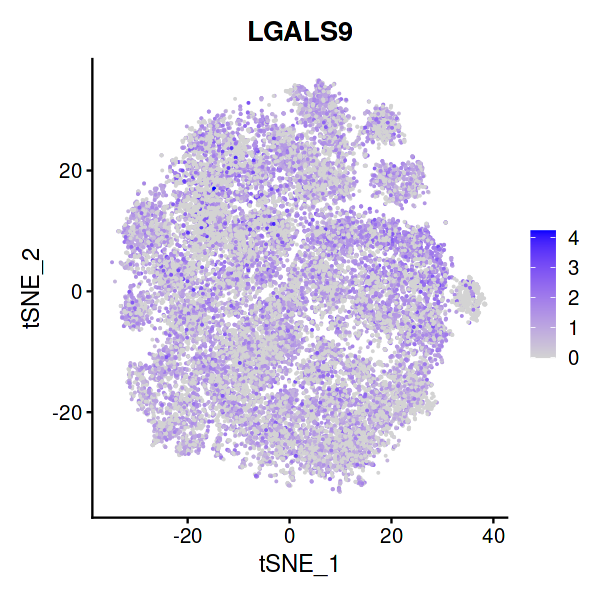

In [169]:
options(repr.plot.height = 5, repr.plot.width = 5)
FeaturePlot(seurat_Mac,'LGALS9',reduction = 'tsne')

In [26]:
filter(marker_Mac_1[order(marker_Mac_1$avg_log2FC,decreasing = T),],cluster=='6')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
EREG1,0.000000e+00,2.391994,0.555,0.131,0.000000e+00,6,EREG
CCL202,5.097677e-195,2.315925,0.492,0.216,2.409621e-190,6,CCL20
TIMP11,0.000000e+00,2.297530,0.893,0.612,0.000000e+00,6,TIMP1
S100A8,0.000000e+00,2.072727,0.777,0.285,0.000000e+00,6,S100A8
VCAN1,0.000000e+00,1.918991,0.600,0.156,0.000000e+00,6,VCAN
IL1RN1,0.000000e+00,1.843049,0.703,0.306,0.000000e+00,6,IL1RN
FCN1,0.000000e+00,1.815680,0.577,0.099,0.000000e+00,6,FCN1
INHBA,2.174330e-175,1.771859,0.291,0.089,1.027784e-170,6,INHBA
S100A9,0.000000e+00,1.756146,0.858,0.525,0.000000e+00,6,S100A9


In [76]:
marker_Mac_0.4 <- marker_Mac_0.4[-grep('MT-',row.names(marker_Mac_0.4),fixed=FALSE),]

In [20]:
table(seurat_Mac$RNA_snn_res.0.4)


   0    1    2    3    4    5    6    7    8    9   10   11 
5776 3793 3049 2826 2600 2326 2100 1521 1125  796  401  177 

In [21]:
2100+3793+1521+401+2826

[1] 10641

In [121]:
filter(marker_Mac_0.4[order(marker_Mac_0.4$avg_log2FC,decreasing = T),],cluster=='7'&gene=='IL1B')

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>


In [ ]:
grep('MT-',row.names(marker_Mac_0.4),fixed=FALSE)

In [77]:
head(marker_Mac_0.4)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
CCL18,0,2.314795,0.459,0.214,0,0,CCL18
SLC40A1,0,1.367885,0.684,0.354,0,0,SLC40A1
SEPP1,0,1.325890,0.583,0.282,0,0,SEPP1
LGMN,0,1.125766,0.865,0.569,0,0,LGMN
FOLR2,0,1.115973,0.662,0.361,0,0,FOLR2
GPNMB,0,1.019807,0.835,0.633,0,0,GPNMB


In [54]:
filter(marker_Mac[order(marker_Mac$avg_log2FC,decreasing = T),],cluster=='15')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
KLK3,0.000000e+00,5.098998,0.970,0.020,0.000000e+00,15,KLK3
MSMB,0.000000e+00,3.443886,0.741,0.012,0.000000e+00,15,MSMB
KLK2,0.000000e+00,3.212523,0.976,0.019,0.000000e+00,15,KLK2
SPON21,0.000000e+00,2.319696,0.687,0.043,0.000000e+00,15,SPON2
TFF3,8.627577e-236,2.251953,0.693,0.064,4.078169e-231,15,TFF3
TRGC1,0.000000e+00,2.249403,0.753,0.018,0.000000e+00,15,TRGC1
PDLIM5,6.450740e-97,2.204629,0.747,0.195,3.049200e-92,15,PDLIM5
H2AFJ,9.927081e-52,1.938715,0.837,0.462,4.692432e-47,15,H2AFJ
LINC01088,0.000000e+00,1.724844,0.530,0.003,0.000000e+00,15,LINC01088


In [148]:
table(seurat_Myeloid@meta.data$RNA_snn_res.1.2)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
5369 4339 4332 4071 4000 3498 2935 2561 1847 1725 1590 1395 1362 1327 1320 1300 
  16   17   18   19   20   21   22   23   24   25   26   27   28 
1207 1034  897  665  622  542  490  454  194  143  116   91   52 

In [109]:
markers_df <- FindMarkers(object = seurat_Myeloid, ident.1 = '19', min.pct = 0.25)

In [110]:
markers_df[order(markers_df$avg_log2FC,decreasing = T),]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CCL3L1,1.369754e-103,1.6252735,0.290,0.085,6.474693e-99
AC020656.1,7.873720e-92,1.1410411,0.292,0.090,3.721829e-87
FYB1,1.732358e-94,0.9742750,0.427,0.167,8.188683e-90
CXCL8,1.259443e-44,0.9689190,0.753,0.546,5.953260e-40
RACK1,4.310665e-62,0.9156342,0.410,0.193,2.037608e-57
FOS,1.255814e-65,0.9012233,0.947,0.849,5.936106e-61
NAMPT,1.090072e-20,0.8919944,0.774,0.640,5.152659e-16
ATP5F1E,9.001068e-70,0.8584848,0.498,0.238,4.254715e-65
ATP5MC2,2.239599e-68,0.8229186,0.380,0.165,1.058636e-63


In [55]:
seurat_Myeloid

An object of class Seurat 
49269 features across 49555 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [150]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1.2%in%c('13'))]
length(cell)

[1] 1327

In [239]:
table(seurat_qc@meta.data$celltype_new)


                 B        Endothelial         Epithelium         Fibroblast 
             39233              27522             147757              41320 
           Myeloid Myeloid_Epithelium             NK/NKT           Plasma_B 
             59278               3835              44747              13886 
                 T       T_Epithelium 
             93598              13709 

In [18]:
cell <- row.names(seurat_Myeloid@meta.data)[which(seurat_Myeloid@meta.data$RNA_snn_res.1.2%in%c('8','22'))]
seurat_qc@meta.data[cell,'celltype_new'] <- 'Myeloid_Epithelium'

In [151]:
seurat_Myeloid <- subset(seurat_Myeloid, subset = RNA_snn_res.1.2 %in% setdiff(unique(seurat_Myeloid$RNA_snn_res.1.2), c('13')))

In [46]:
seurat_gc <- subset(seurat_gc, subset = RNA_snn_res.1 %in% c('5','12'))

In [47]:
seurat_gc@meta.data$celltype <- 'malignant'

In [28]:
table(seurat_gc@meta.data$celltype)


       M2 malignant 
      542       793 

In [48]:
seurat_gc@meta.data$celltype[which(seurat_gc@meta.data$RNA_snn_res.1%in%c('12'))] <- 'M2'

In [208]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


       cDC1        cDC2        cDC3    Mac_C1QC  Mac_HSPA1B    Mac_IL1B 
        622        5682        1395       14434        1327        1847 
  Mac_ISG15   Mac_PPARG    Mac_SPP1        Mast   Mono_CD14   Mono_CD16 
       3498        1725        4895        4071        4339         665 
Neutrophils         pDC 
       1590        3297 

##### 5.3.1 差异基因

In [244]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


       cDC1        cDC2        cDC3    Mac_C1QC  Mac_HSPA1B    Mac_IL1B 
        622        5682        1395       14434        1327        1847 
  Mac_ISG15   Mac_PPARG    Mac_SPP1        Mast   Mono_CD14   Mono_CD16 
       3498        1725        2561        4071        4339         665 
Neutrophils         pDC 
       1590        3297 

In [169]:
seurat_Myeloid

An object of class Seurat 
49269 features across 48151 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [204]:
Idents(seurat_Mac) <- seurat_Mac@meta.data$celltype_new_refined_last_test
marker_Myeloid <- FindAllMarkers(seurat_Mac, only.pos = TRUE, min.pct = 0.1,logfc.threshold = 0.1)

Calculating cluster M2

Calculating cluster M1



In [206]:
filter(marker_Myeloid[order(marker_Myeloid$avg_log2FC,decreasing = T),],cluster=='M2')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
IGKC,8.452091e-15,0.4307270,0.511,0.433,3.995219e-10,M2,IGKC
IGHG3,2.434998e-12,0.3103025,0.174,0.124,1.150999e-07,M2,IGHG3
RGS1,1.297829e-09,0.2717672,0.744,0.709,6.134706e-05,M2,RGS1
VSIG4,2.494600e-14,0.2527657,0.497,0.435,1.179172e-09,M2,VSIG4
CCL3L1,7.726727e-04,0.2483425,0.112,0.093,1.000000e+00,M2,CCL3L1
IGHG1,2.576321e-10,0.2483304,0.176,0.131,1.217801e-05,M2,IGHG1
IGHG4,7.625068e-12,0.2295871,0.197,0.147,3.604294e-07,M2,IGHG4
ID2,9.957698e-14,0.2258721,0.623,0.560,4.706904e-09,M2,ID2
PLIN2,3.228836e-06,0.2023376,0.633,0.595,1.526238e-01,M2,PLIN2


In [171]:
save(marker_Myeloid,file='/home/zhouyao/pancancer/data/marker_Myeloid.RData')

In [172]:
marker_Myeloid

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
SEPP1,0,3.027388,0.473,0.091,0,Mac_C1QC,SEPP1
SLC40A1,0,2.344710,0.591,0.117,0,Mac_C1QC,SLC40A1
CCL18,0,2.212314,0.283,0.125,0,Mac_C1QC,CCL18
C1QB,0,2.094167,0.947,0.405,0,Mac_C1QC,C1QB
C1QA,0,2.058613,0.948,0.429,0,Mac_C1QC,C1QA
APOE,0,2.042019,0.893,0.434,0,Mac_C1QC,APOE
C1QC,0,2.030057,0.944,0.381,0,Mac_C1QC,C1QC
FOLR2,0,1.929914,0.563,0.115,0,Mac_C1QC,FOLR2
RNASE1,0,1.774795,0.600,0.226,0,Mac_C1QC,RNASE1


In [71]:
head(row.names(marker_Mac))

[1] "CXCL10" "IFIT2"  "CXCL11" "IFIT3"  "RSAD2"  "GBP1"

In [72]:
grep('MT-',row.names(marker_Mac))

[1]  627  675  899  948  964  984 1020 1034 1038 1048 1055 1057 1088 1089 1096
[16] 1109 1334 1842 1844 1904 1988 1991 1993 1996 1998 2004 2011 2012 2036 2061
[31] 2105 2130 2350 2488 2491 2505 2508 2605 3088 3092 3097 3132 3141 3171

In [174]:
unique(marker_Myeloid$cluster)

[1] Mac_C1QC    Mac_SPP1    Mac_ISG15   Mast        Neutrophils Mac_IL1B   
 [7] cDC2        Mono_CD16   Mac_FN1     pDC         cDC1        Mono_CD14  
[13] cDC3       
13 Levels: Mac_C1QC Mac_SPP1 Mac_ISG15 Mast Neutrophils Mac_IL1B ... cDC3

In [242]:
filter(marker_Myeloid[order(marker_Myeloid$avg_log2FC,decreasing = T),],cluster=='Mac_PPARG')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
MARCO1,0.000000e+00,2.3650177,0.756,0.163,0.000000e+00,Mac_PPARG,MARCO
RETN,0.000000e+00,2.3226268,0.528,0.089,0.000000e+00,Mac_PPARG,RETN
CCL202,1.097573e-213,2.2553726,0.459,0.179,5.188120e-209,Mac_PPARG,CCL20
FABP4,5.127369e-270,2.0805980,0.259,0.056,2.423656e-265,Mac_PPARG,FABP4
MCEMP1,0.000000e+00,2.0664506,0.643,0.088,0.000000e+00,Mac_PPARG,MCEMP1
FBP12,0.000000e+00,2.0359818,0.760,0.299,0.000000e+00,Mac_PPARG,FBP1
CXCL32,7.159560e-249,1.8297392,0.671,0.312,3.384253e-244,Mac_PPARG,CXCL3
INHBA,0.000000e+00,1.7470523,0.350,0.070,0.000000e+00,Mac_PPARG,INHBA
TIMP13,1.392139e-215,1.5970984,0.872,0.594,6.580503e-211,Mac_PPARG,TIMP1


In [202]:
 unique(marker_Myeloid_test$gene)

[1] "SEPP1"      "SLC40A1"    "CCL18"      "C1QB"       "APOE"      
  [6] "C1QA"       "C1QC"       "FOLR2"      "RNASE1"     "LGMN"      
 [11] "MT1G"       "SPP1"       "MT1X"       "CSTB"       "MT1E"      
 [16] "NUPR1"      "FABP5"      "CTSL"       "MMP9"       "MT2A"      
 [21] "CXCL10"     "CCL8"       "ISG15"      "IFIT2"      "CXCL11"    
 [26] "IFIT3"      "RSAD2"      "IFIT1"      "GBP1"       "TNFSF10"   
 [31] "TPSB2"      "TPSAB1"     "CPA3"       "MS4A2"      "GATA2"     
 [36] "HPGD"       "HPGDS"      "CD69"       "RGS13"      "CLU"       
 [41] "HSPA6"      "ZFAND2A"    "HSPA1B"     "DNAJB1"     "BAG3"      
 [46] "HSPA1A"     "HSPH1"      "HSP90AA1"   "HSPD1"      "HSPB1"     
 [51] "FCGR3B"     "HCAR3"      "CSF3R"      "CXCR2"      "CXCL8"     
 [56] "NAMPT"      "PTGS2"      "IVNS1ABP"   "IFITM2"     "PDE4B"     
 [61] "CCL3L3"     "CCL4L2"     "CCL4"       "CCL3"       "IL1B"      
 [66] "IER3"       "TNF"        "CXCL3"      "CXCL2"      "CCL20"     
 [71] "S100B"      "FCER1A"     "CD1C"       "HLA-DQB2"   "CD1E"      
 [76] "CLEC10A"    "PKIB"       "HLA-DQB1"   "AREG"       "HLA-DPB1"  
 [81] "FCN1"       "LILRA5"     "CFP"        "LST1"       "LINC01272" 
 [86] "COTL1"      "S100A4"     "CDKN1C"     "CD52"       "STXBP2"    
 [91] "MARCO"      "RETN"       "MCEMP1"     "FBP1"       "INHBA"     
 [96] "FABP4"      "TIMP1"      "EREG"       "GZMB"       "PTGDS"     
[101] "JCHAIN"     "TCL1A"      "ITM2C"      "PLAC8"      "IRF7"      
[106] "PPP1R14B"   "CLIC3"      "LTB"        "CPVL"       "CLEC9A"    
[111] "DNASE1L3"   "LGALS2"     "CPNE3"      "C1orf54"    "WDFY4"     
[116] "IDO1"       "SNX3"       "CST3"       "S100A8"     "S100A9"    
[121] "S100A12"    "VCAN"       "THBS1"      "BIRC3"      "CCL17"     
[126] "CCR7"       "CCL19"      "CCL22"      "FSCN1"      "LAMP3"     
[131] "MARCKSL1"   "GADD45A"    "TXN"        "SNHG5"      "AL627171.2"
[136] "AC020916.1" "CSKMT"      "EEF1G"      "SPAG9"      "IFI30"     
[141] "CCL3L1"     "HSPA2"      "SNHG12"

In [210]:
marker_Myeloid_test <- marker_Myeloid %>% group_by(cluster) %>% top_n(n=10,wt= avg_log2FC)
marker_Myeloid_test

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.954853,0.473,0.097,0.000000e+00,Mac_C1QC,SEPP1
0.000000e+00,2.316875,0.591,0.120,0.000000e+00,Mac_C1QC,SLC40A1
0.000000e+00,2.240621,0.283,0.123,0.000000e+00,Mac_C1QC,CCL18
0.000000e+00,2.062693,0.947,0.413,0.000000e+00,Mac_C1QC,C1QB
0.000000e+00,2.033719,0.893,0.440,0.000000e+00,Mac_C1QC,APOE
0.000000e+00,2.024695,0.948,0.437,0.000000e+00,Mac_C1QC,C1QA
0.000000e+00,1.995199,0.944,0.389,0.000000e+00,Mac_C1QC,C1QC
0.000000e+00,1.913141,0.563,0.118,0.000000e+00,Mac_C1QC,FOLR2
0.000000e+00,1.767549,0.600,0.229,0.000000e+00,Mac_C1QC,RNASE1


Warning message in DoHeatmap(subset(seurat_Myeloid, downsample = 2000), features = unique(marker_Myeloid_test$gene), :
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: SNHG12, SPAG9, CSKMT, SNX3, S100A4, COTL1, LST1, HLA-DPB1, HLA-DQB1, IFITM2, IVNS1ABP, CSF3R”
Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


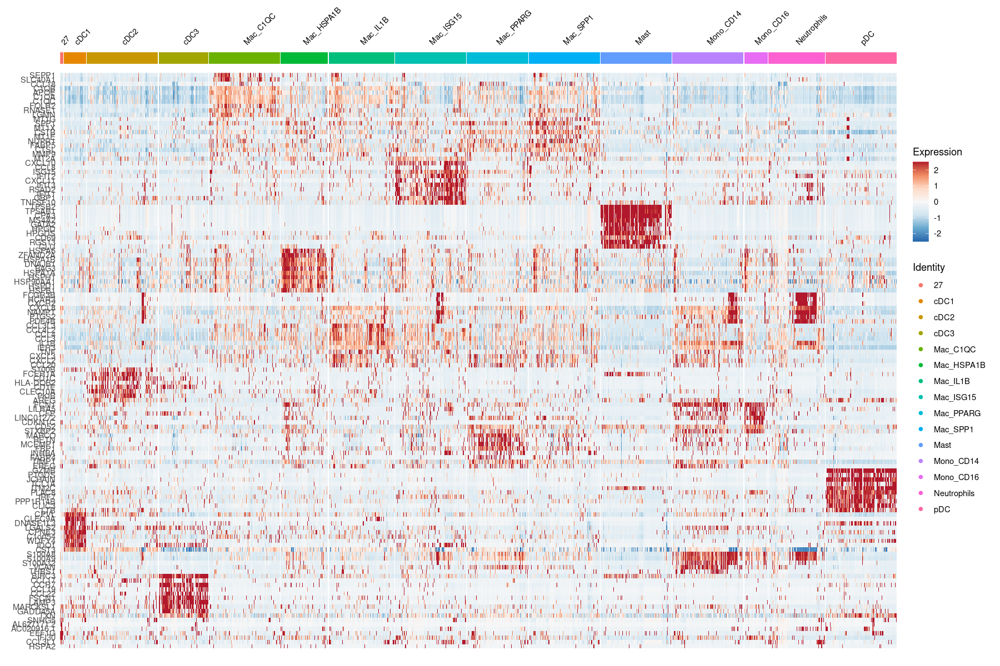

In [203]:
options(repr.plot.height = 10, repr.plot.width = 15)
DoHeatmap(subset(seurat_Myeloid, downsample = 2000), features = unique(marker_Myeloid_test$gene), size = 3, draw.lines = T, lines.width = 20, group.by = "celltype_new_refined") + 
    scale_fill_distiller(palette = "RdBu", na.value = "white")#
    #scale_color_manual(values = ECSMC_Colors) + 
    #guides(color = "none")

In [170]:
head(marker_Myeloid)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
SEPP1,0,2.956878,0.473,0.096,0,Mac_C1QC,SEPP1
SLC40A1,0,2.317729,0.591,0.120,0,Mac_C1QC,SLC40A1
CCL18,0,2.242981,0.283,0.123,0,Mac_C1QC,CCL18
C1QB,0,2.063866,0.947,0.413,0,Mac_C1QC,C1QB
APOE,0,2.033086,0.893,0.440,0,Mac_C1QC,APOE
C1QA,0,2.024961,0.948,0.437,0,Mac_C1QC,C1QA


In [90]:
table(seurat$tissue)


 mLN    T 
 385 3681 

In [99]:
saveRDS(seurat_Mac,'/home/zhouyao/pancancer/seurat_Mac.Rds')
meta <- seurat_Myeloid@meta.data
saveRDS(meta,'/home/zhouyao/pancancer/meta.Rds')

In [98]:
table(seurat_Myeloid@meta.data$celltype_new)


       B_DC         cDC      epi_DC      Mac_DC    Mac_Mast    Mac_Mono 
        186        5647          91        1065         433         757 
 Mac_Neutro Macrophages        Mast    Monocyte   Neutro_DC  Neutro_Mac 
        196       26814        3633        4858         654         435 
Neutro_Mono Neutrophils         pDC 
       1028         588        3093 

In [396]:
table(seurat_Myeloid$celltype_new_refined)


       cDC1        cDC2        cDC3 Macrophages        Mast    Monocyte 
        638        5262        1341       27249        4066        5771 
Neutrophils         pDC 
        784        3332 

In [205]:
table(seurat_Myeloid$`RNA_snn_res.1.2`)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
5369 4339 4332 4071 4000 3498 2935 2561 1847 1725 1590 1395 1362 1327 1320 1300 
  16   17   18   19   20   21   22   23   24   25   26   27   28 
1207 1034  897  665  622  542  490  454  194  143  116   91   52 

In [237]:
seurat_Myeloid

An object of class Seurat 
49269 features across 47053 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [236]:
seurat_Myeloid <- subset(seurat_Myeloid, subset = RNA_snn_res.1.2 %in% setdiff(unique(seurat_Myeloid$RNA_snn_res.1.2), c('17','15')))

In [ ]:
table(seurat_qc@meta.data$celltype)

##### 5.3.2 点图展示差异基因

In [ ]:
R.utils::setOption("clusterProfiler.download.method","wget")##解决KEGG运行不成功的方法

In [336]:
marker_Myeloid.markers2 <- subset(marker_Myeloid, p_val_adj < 0.05 )
marker_Myeloid.markers2$cluster <- factor(marker_Myeloid.markers2$cluster, levels = c('Mac_ISG15','Mac_C1QC','Mac_FN1','Mac_IL1B','Mac_SPP1','Mono_CD14','Mono_CD16',
'cDC1','cDC2','cDC3','pDC','Neutrophils','Mast'))

In [337]:
marker_Myeloid.markers2$avg_log2FC[marker_Myeloid.markers2$avg_log2FC > 3] <- 3
marker_Myeloid.markers2$avg_log2FC[marker_Myeloid.markers2$avg_log2FC < -2.5] <- -2.5
marker_Myeloid.markers2$cell.ann.ind <- as.numeric(marker_Myeloid.markers2$cluster)
marker_Myeloid.markers2$threshold <- as.factor(ifelse(marker_Myeloid.markers2$avg_log2FC > 0 , 'Up', 'Down'))
marker_Myeloid.markers2$threshold2 <- as.factor(ifelse(abs(marker_Myeloid.markers2$avg_log2FC) > 1, 'Highly', 'Lowly'))
marker_Myeloid.markers2$thr_signi <- as.character(marker_Myeloid.markers2$cluster)
marker_Myeloid.markers2

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,cell.ann.ind,threshold,threshold2,thr_signi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>,<fct>,<fct>,<chr>
SEPP1,0,3.000000,0.473,0.091,0,Mac_C1QC,SEPP1,2,Up,Highly,Mac_C1QC
SLC40A1,0,2.344710,0.591,0.117,0,Mac_C1QC,SLC40A1,2,Up,Highly,Mac_C1QC
CCL18,0,2.212314,0.283,0.125,0,Mac_C1QC,CCL18,2,Up,Highly,Mac_C1QC
C1QB,0,2.094167,0.947,0.405,0,Mac_C1QC,C1QB,2,Up,Highly,Mac_C1QC
C1QA,0,2.058613,0.948,0.429,0,Mac_C1QC,C1QA,2,Up,Highly,Mac_C1QC
APOE,0,2.042019,0.893,0.434,0,Mac_C1QC,APOE,2,Up,Highly,Mac_C1QC
C1QC,0,2.030057,0.944,0.381,0,Mac_C1QC,C1QC,2,Up,Highly,Mac_C1QC
FOLR2,0,1.929914,0.563,0.115,0,Mac_C1QC,FOLR2,2,Up,Highly,Mac_C1QC
RNASE1,0,1.774795,0.600,0.226,0,Mac_C1QC,RNASE1,2,Up,Highly,Mac_C1QC


In [181]:
table(marker_Myeloid.markers2$threshold2)


Highly  Lowly 
   754   4360 

In [338]:
top_up_label <- marker_Myeloid.markers2 %>% 
  subset(., threshold %in% "Up") %>% 
  group_by(cell.ann.ind) %>% 
  top_n(n = 7, wt = avg_log2FC) %>% 
  as.data.frame()
head(top_up_label)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,cell.ann.ind,threshold,threshold2,thr_signi
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>,<fct>,<fct>,<chr>
1,0,3.000000,0.473,0.091,0,Mac_C1QC,SEPP1,2,Up,Highly,Mac_C1QC
2,0,2.344710,0.591,0.117,0,Mac_C1QC,SLC40A1,2,Up,Highly,Mac_C1QC
3,0,2.212314,0.283,0.125,0,Mac_C1QC,CCL18,2,Up,Highly,Mac_C1QC
4,0,2.094167,0.947,0.405,0,Mac_C1QC,C1QB,2,Up,Highly,Mac_C1QC
5,0,2.058613,0.948,0.429,0,Mac_C1QC,C1QA,2,Up,Highly,Mac_C1QC
6,0,2.042019,0.893,0.434,0,Mac_C1QC,APOE,2,Up,Highly,Mac_C1QC


In [245]:
top_down_label <- marker_Myeloid.markers2 %>% 
  subset(., threshold %in% "Down") %>% 
  group_by(cell.ann.ind) %>% 
  top_n(n = -5, wt = avg_log2FC) %>% 
  as.data.frame()
head(top_down_label)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,cell.ann.ind,threshold,threshold2,thr_signi
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<dbl>,<fct>,<fct>,<chr>


In [339]:
top_label <- rbind(top_up_label, top_down_label)
background_position <- marker_Myeloid.markers2 %>%
  group_by(cluster) %>%
  summarise(Min = min(avg_log2FC) - 0.2, Max = max(avg_log2FC) + 0.2) %>%
  as.data.frame()
background_position$cell.ann.ind <- as.numeric(background_position$cluster)
background_position$start <- background_position$cell.ann.ind - 0.4
background_position$end <- background_position$cell.ann.ind + 0.4
#cluster_bar_position <- backgr

cluster_bar_position <- background_position
cluster_bar_position$start <- cluster_bar_position$cell.ann.ind - 0.5
cluster_bar_position$end <- cluster_bar_position$cell.ann.ind + 0.5


In [203]:
top_label

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,cell.ann,cell.ann.ind,threshold,threshold2,thr_signi
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>,<fct>,<dbl>,<fct>,<fct>,<chr>
0,2.500000,0.473,0.091,0,Mac_C1QC,SEPP1,Mac_C1QC,1,Up,Highly,Mac_C1QC
0,2.344710,0.591,0.117,0,Mac_C1QC,SLC40A1,Mac_C1QC,1,Up,Highly,Mac_C1QC
0,2.212314,0.283,0.125,0,Mac_C1QC,CCL18,Mac_C1QC,1,Up,Highly,Mac_C1QC
0,2.094167,0.947,0.405,0,Mac_C1QC,C1QB,Mac_C1QC,1,Up,Highly,Mac_C1QC
0,2.058613,0.948,0.429,0,Mac_C1QC,C1QA,Mac_C1QC,1,Up,Highly,Mac_C1QC
0,2.500000,0.323,0.081,0,Mac_SPP1,MT1G,Mac_SPP1,2,Up,Highly,Mac_SPP1
0,2.500000,0.718,0.289,0,Mac_SPP1,SPP1,Mac_SPP1,2,Up,Highly,Mac_SPP1
0,2.366859,0.492,0.260,0,Mac_SPP1,MT1X,Mac_SPP1,2,Up,Highly,Mac_SPP1
0,1.995560,0.912,0.698,0,Mac_SPP1,CSTB,Mac_SPP1,2,Up,Highly,Mac_SPP1


Warning message:
“ggrepel: 16 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


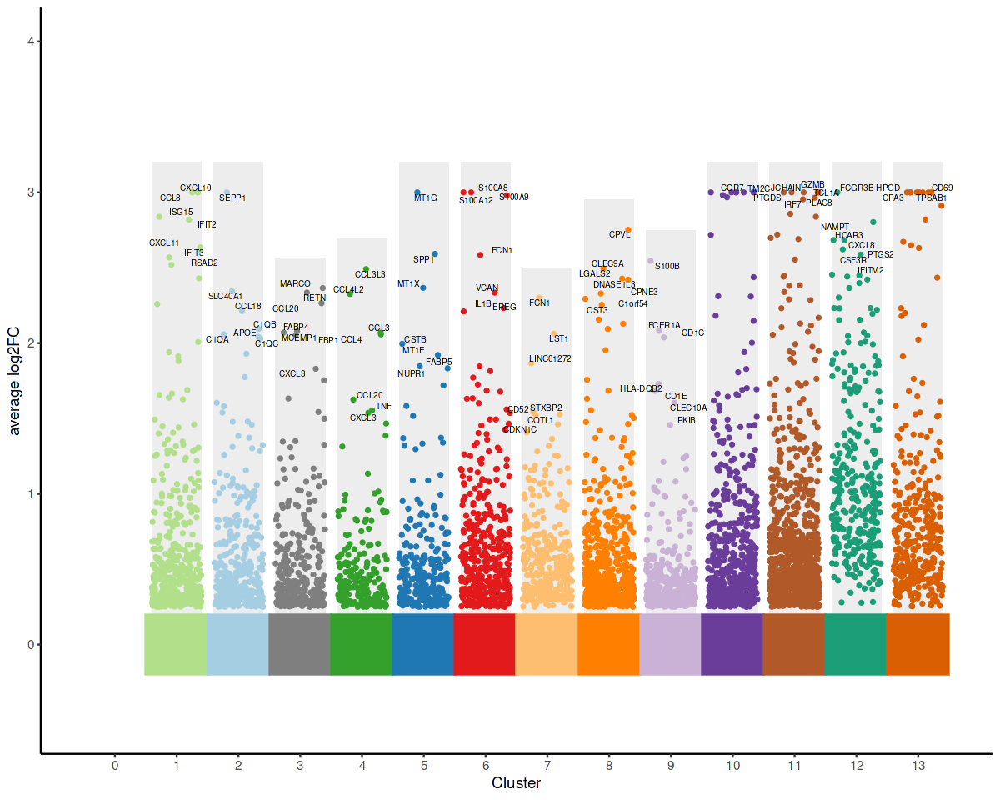

In [344]:
options(repr.plot.height = 8, repr.plot.width = 10)
#pdf('/home/zhouyao/pancancer/figure/myeloid_diffgenes.pdf',width = 10,height = 8)
ggplot() +
  geom_rect(data = background_position, aes(xmin = start, xmax = end, ymin = Min, ymax = Max), fill = "#525252", alpha = 0.1) + # 灰背景
  geom_jitter(data = marker_Myeloid.markers2, aes(x = cell.ann.ind, y = avg_log2FC, color = thr_signi), size = 1, position = position_jitter(seed = 1), show.legend = F) +
  scale_color_manual(values = c(mye_color, Lowly = "grey")) +
  scale_x_continuous(limits = c(-0.5, max(marker_Myeloid.markers2$cell.ann.ind) + 0.5),
                     breaks = seq(0, max(marker_Myeloid.markers2$cell.ann.ind), 1),
                     label = seq(0, max(marker_Myeloid.markers2$cell.ann.ind), 1)) + 
  geom_text_repel(data = top_label, aes(x = cell.ann.ind, y = avg_log2FC, label = gene), position = position_jitter(seed = 1),
                  show.legend = F, size = 2, box.padding = unit(0, "lines")) +
  new_scale_color() + 
  geom_rect(data = cluster_bar_position, aes(xmin = start, xmax = end, ymin = -0.2, ymax = 0.2, fill = cluster, color = cluster), show.legend = F) +
  scale_fill_manual(values = mye_color) + 
  scale_y_continuous(limits = c(-0.5, 4)) + 
  scale_color_manual(values = mye_color) + 
  labs(x = "Cluster", y = "average log2FC") +
  theme_classic() 
#T_heatmap
#dev.off()
#dev.off()

In [5]:
seurat_Myeloid <- readRDS('/home/zhouyao/pancancer/data/seurat_Myeloid.Rds')

In [6]:
marker_Myeloid <- FindAllMarkers(seurat_Myeloid, only.pos = TRUE,min.pct = 0.25,logfc.threshold = 0)

Calculating cluster Mast

Calculating cluster Neutrophils

Calculating cluster pDC

Calculating cluster cDC3

Calculating cluster cDC2

Calculating cluster cDC1

Calculating cluster Mono_CD16

Calculating cluster Mono_CD14

Calculating cluster Macro



In [7]:
marker_Myeloid.markers2 <- marker_Myeloid[marker_Myeloid$p_val_adj < 0.05 & marker_Myeloid$avg_log2FC > 0.6, ]
marker_Myeloid.markers2.cluster <- split(marker_Myeloid.markers2$gene, marker_Myeloid.markers2$cluster)

In [8]:
clusters <- c('Macro','Mono_CD14','Mono_CD16',
'cDC1','cDC2','cDC3','pDC','Neutrophils','Mast')
marker_Myeloid.markers2.GOBP <- compareCluster(marker_Myeloid.markers2.cluster[clusters], fun = "enrichGO", OrgDb = org.Hs.eg.db, keyType = "SYMBOL", pvalueCutoff = 0.05, ont = "BP")

In [9]:
as.data.frame(marker_Myeloid.markers2.GOBP)

Cluster,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
<fct>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
Macro,GO:0002683,negative regulation of immune system process,24/156,425/18800,1.158565e-13,3.255567e-10,2.343960e-10,C1QC/GPNMB/CCL2/A2M/TREM2/CD68/CCL3/ISG15/HMOX1/MAFB/VSIG4/LGALS3/SERPING1/GRN/TMEM176B/CD59/TMEM176A/GPX1/TYROBP/MERTK/LILRB4/IL4I1/CD84/HLA-A,24
Macro,GO:0006898,receptor-mediated endocytosis,18/156,246/18800,2.300502e-12,3.232206e-09,2.327140e-09,APOE/APOC1/CTSL/MSR1/DAB2/CD14/CD81/MARCO/MRC1/STAB1/C3/ANXA2/CD63/SCARB2/FCER1G/LILRB4/SIGLEC1/LRP1,18
Macro,GO:0002443,leukocyte mediated immunity,23/156,457/18800,4.244124e-12,3.975330e-09,2.862178e-09,C1QB/C1QA/C1QC/TREM2/FCGR3A/CCL3/HMOX1/CD81/SERPING1/CTSC/PRDX1/C3/FCGR1A/C2/LAMP1/TYROBP/FCER1G/LILRB4/IL4I1/CD84/HLA-DMA/HLA-A/HLA-DMB,23
Macro,GO:0097529,myeloid leukocyte migration,16/156,229/18800,8.156608e-11,5.730017e-08,4.125527e-08,CCL18/LGMN/CCL2/TREM2/CCL4/CCL3/CCL3L3/CD81/LGALS3/PLA2G7/CXCL3/C3AR1/CSF1R/MMP14/AIF1/FCER1G,16
Macro,GO:0002449,lymphocyte mediated immunity,19/156,365/18800,2.037118e-10,1.144861e-07,8.242824e-08,C1QB/C1QA/C1QC/TREM2/FCGR3A/CD81/SERPING1/CTSC/PRDX1/C3/FCGR1A/C2/LAMP1/FCER1G/LILRB4/IL4I1/HLA-DMA/HLA-A/HLA-DMB,19
Macro,GO:0044403,biological process involved in symbiotic interaction,17/156,286/18800,2.552940e-10,1.189101e-07,8.561346e-08,APOE/CTSL/IFI27/CTSB/CCL4/CCL3/CD81/MRC1/FN1/LY6E/LAMP1/CSF1R/GPX1/SCARB2/LGALS1/NRP1/SIGLEC1,17
Macro,GO:0050777,negative regulation of immune response,14/156,179/18800,2.962172e-10,1.189101e-07,8.561346e-08,A2M/TREM2/ISG15/HMOX1/VSIG4/LGALS3/SERPING1/GRN/CD59/GPX1/LILRB4/IL4I1/CD84/HLA-A,14
Macro,GO:0002253,activation of immune response,19/156,386/18800,5.223165e-10,1.834637e-07,1.320911e-07,C1QB/C1QA/C1QC/A2M/TREM2/VSIG4/CD81/LGALS3/SERPING1/CFD/C3/FPR3/C2/C3AR1/CD59/TYROBP/FCER1G/LILRB4/HLA-A,19
Macro,GO:0097006,regulation of plasma lipoprotein particle levels,10/156,84/18800,1.888694e-09,5.896922e-07,4.245695e-07,APOE/APOC1/LIPA/MSR1/TREM2/PLTP/HMOX1/PLA2G7/ANXA2/ABCA1,10


In [12]:
marker_Myeloid.markers2.Mono <- filter(marker_Myeloid.markers2.GOBP,Cluster%in%c('Mono_CD14','Mono_CD16'))

In [ ]:
as.data.frame(marker_Myeloid.markers2.Mono)

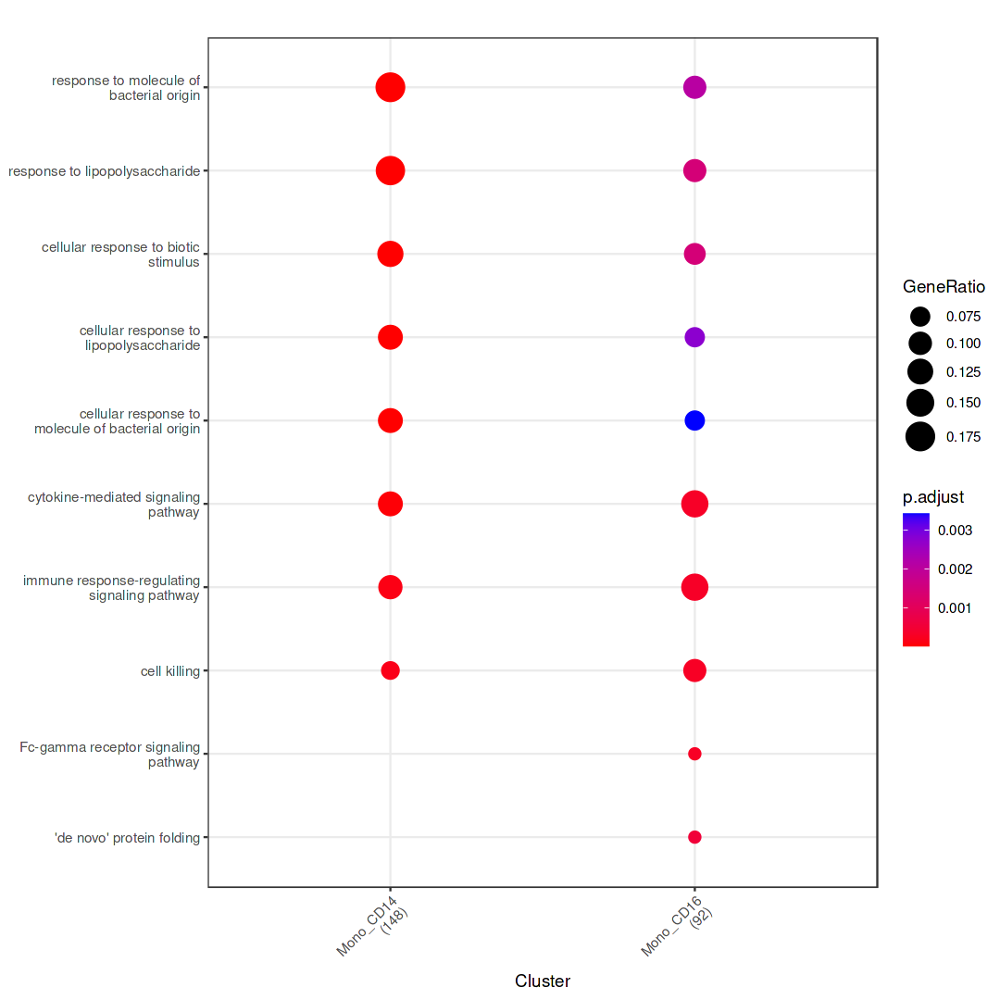

In [14]:
options(repr.plot.height = 9, repr.plot.width = 9)
#pdf('/home/zhouyao/pancancer/figure/myeloid_diffgenes_go.pdf',width = 9,height = 9)
dotplot(marker_Myeloid.markers2.Mono,showCategory = 5)+theme_bw()+
theme(axis.text.x = element_text(angle=45, hjust=1, vjust=1))
#dev.off()
#dev.off()

In [309]:
class(marker_Myeloid.markers2.cluster)

[1] "list"

In [ ]:
library(R.utils)

In [317]:
save(marker_Myeloid.markers2.cluster,file='/home/zhouyao/pancancer/data/marker_Myeloid.markers2.cluster.RData')

In [ ]:
marker_Myeloid.markers2.pathway <- compareCluster(marker_Myeloid.markers2.cluster, fun = "enrichKEGG")

In [308]:
marker_Myeloid.markers2.pathway

NULL

In [311]:
library(clusterProfiler)
getOption("clusterProfiler.download.method")

[1] "libcurl"

In [ ]:
options(repr.plot.height = 15, repr.plot.width = 10)
dotplot(marker_Myeloid.markers2.pathway,showCategory = 3)

In [ ]:
dotplot(marker_Myeloid.markers2.pathway,showCategory=10,includeAll=TRUE)

In [212]:
mye_color <- c("Mac_ISG15" = "#B2DF8A","Mac_C1QC" = "#A6CEE3",  "Mac_FN1" = "#FB9A99", "Mac_IL1B" = "#33A02C","Mac_SPP1" = "#1F78B4", 
                "Mono_CD14" = "#E31A1C", "Mono_CD16" = "#FDBF6F", "cDC1" = "#FF7F00", "cDC2" = "#CAB2D6", "cDC3" = "#6A3D9A", "pDC" = "#B15928", "Neutrophils" = "#1B9E77", 
                "Mast" = "#D95F02")

#### 5.4 细胞类型注释

In [22]:
mye_color <- c("Macro" = "#1F78B4",
               "Mono_CD14" = "#E31A1C",
               "Mono_CD16" = "#FDBF6F", 
               "cDC1" = "#FF7F00", 
               "cDC2" = "#CAB2D6",
               "cDC3" = "#6A3D9A", 
               "pDC" = "#B15928", 
               "Neutrophils" = "#00b1bf", 
               "Mast" = "#D95F02",
              "M1" = "#ce3079", 
               "M2" = "#4562ad",
              'LGALS9_H'='#cd151c',
              'LGALS9_L'= '#129880')

main_color <- c("T" = "#E31A1C", 
                "NK/NKT" = "#A6CEE3",
                "B" = "#FF7F00", 
                "Plasma_B" = '#f39b7f', 
                "Myeloid" = '#d87ab1', 
                "Epithelium" = "#1F78B4", 
                "Endothelial" = "#B15928", 
                "Fibroblast" = "#6A3D9A")
main_color <- c("T" = "#E31A1C", 
               "NK/NKT" = "#A6CEE3",
                "B" = "#FF7F00", 
                #"Plasma_B" = '#f39b7f', 
                "Myeloid" = '#d87ab1', 
                "Epithelium" = "#1F78B4", 
                "Endothelial" = "#B15928", 
                "Fibroblast" = "#6A3D9A")
lym_color <- c("CD8_Ex" = "#E31A1C", 
               "NK" = "#A6CEE3",
               "B" = "#FF7F00", 
               "Plasma_B" = '#f39b7f', 
               "Naive_T" = '#d87ab1', 
               "CD8_EFF" = "#1F78B4", 
               "CD4_Treg" = "#B15928", 
               "CD4_Ex" = "#6A3D9A")

#cancer_color <- c('BRCA'='#b23c87','PTC'='#dc0000','HNSCC'='#91d1c2','LUNG'='#b5bd61','OPC'='#ff8c81','PRAD'='#ff3399','HCC'='#00b1bf','GC'='#8384bf','TC'='#c98225')
#cancer_color <- c('BRCA'='#d87ab1','PTC'='#b5bd61','HNSCC'='#26becf','LUNG'='#aec7e7','OPC'='#fbba78','PRAD'='#9cd089','HCC'='#f69697','GC'='#91d1c2','TC'='#b09c85')
#cancer_color <- c("#d72829","#8459a5","#f57f22","#d87ab1","#b5bd61","#26becf","#279f69","#7e6148","#307eb9")
cancer_color <- c("#94519f",'#00b1bf',"#f39b7f","#dc0000","#007bc0","#f279b9","#ff7c10","#d0badc",'#7e6148')
names(cancer_color) <- c('BRCA','PTC','HNSCC','LUNG','OPC','PRAD','HCC','GC','TC')
#seurat_qc@meta.data$tissue <- factor(seurat_qc@meta.data$tissue,levels = c('T','mLN'))
plot_fig <- function(seurat_qc,goal,type){
    seurat_qc@meta.data$tissue <- factor(seurat_qc@meta.data$tissue,levels = c('T','mLN'))
    seurat_qc@meta.data$cancer <- factor(seurat_qc@meta.data$cancer,levels = names(cancer_color))
    #seurat_qc@meta.data$celltype_total <- factor(seurat_qc@meta.data$celltype_total,levels=c("T","NK/NKT",'B',
      #                                                                      'Myeloid','Epithelium','Endothelial','Fibroblast'))
    if(type=='T'){
    p_celltype <- DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_manual(values = lym_color)+theme(title = ,legend.position = 'top')+labs(title = "")}
    if(type=='Myeloid'){
    p_celltype <- DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_manual(values = mye_color)+theme(legend.position = 'top')+labs(title = "")}
    if(type=='qc'){
        p_celltype <- DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_manual(values = main_color)+theme(legend.position = 'top')+labs(title = "")
    }
    p_tissue <-  DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_d3()+theme(legend.position = 'top')+labs(title = "")
    p_cancer <-  DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "cancer"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_manual(values = cancer_color)+theme(legend.position = 'top')+labs(title = "")
 
bar_per <- as.data.frame(table(seurat_qc@meta.data$tissue,
           seurat_qc@meta.data[,goal])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
    if(type=='qc'){p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values=main_color)}
    if(type=='T'){
p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "right" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values = lym_color)}
     if(type=='Myeloid'){
p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values = mye_color)}
    
bar_per_cancer <- as.data.frame(table(seurat_qc@meta.data[,goal],
           seurat_qc@meta.data[,'cancer'])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
    bar_per_cancer$Var2 <- factor(bar_per_cancer$Var2,levels=names(cancer_color))
p_cell_cancer <- ggplot(bar_per_cancer, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ,axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values=cancer_color)
    plot <- list(p_celltype,p_tissue,p_cancer,p_tissue_cell,p_cell_cancer)
}

In [23]:
p <- plot_fig(seurat_qc=seurat_Mac,goal='celltype_new_refined_last_test',type='Myeloid')

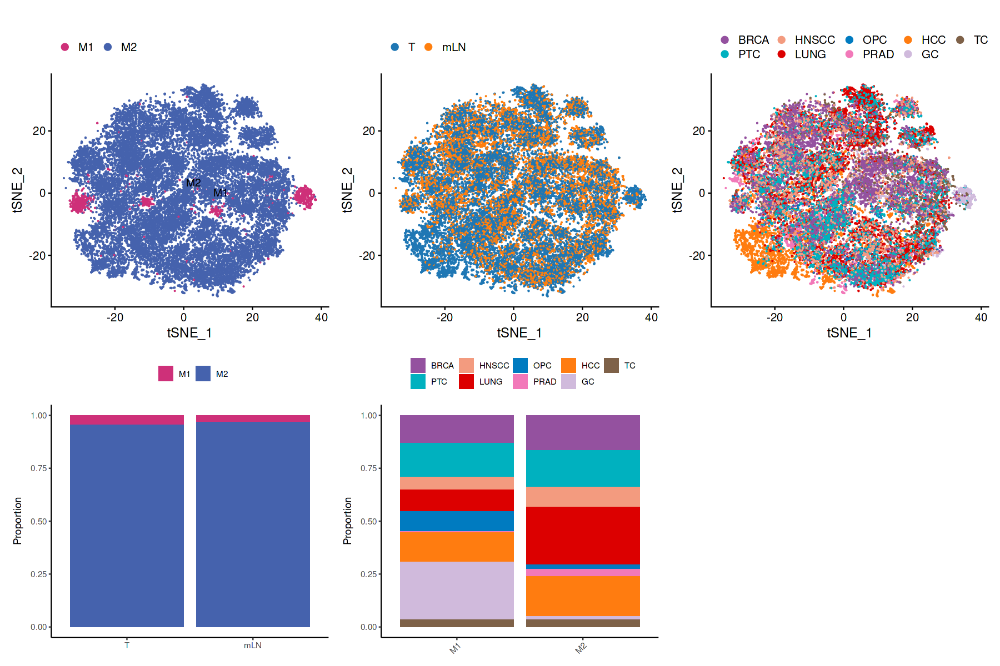

In [24]:
options(repr.plot.height = 10, repr.plot.width = 15)
#pdf('/home/zhouyao/pancancer/figure/Section1/celltype.pdf',width = 15,height = 10)
p[[1]]+p[[2]]+p[[3]]+p[[4]]+p[[5]]

In [10]:
table(seurat_Mac@meta.data$celltype_new_refined_last_test)


   M1    M2 
 1073 25417 

In [130]:
#Macrophages=c(24,13,7,4,12,5,16,8,14,21,0,17,20,11)               
#Monocyte =c(2,19)
Mono_CD14=c(1)
Mono_CD16=c(19)
#Mono_CD16CD16=c(17)
#Mac_HSPA6=c(11)
Mac_C1QC=c(23,4,18,21,12,0,22,14)
Mac_ISG15=c(5)
Mac_IL1B=c(8,27)
Mac_SPP1=c(15,7,17,13)
#Mac_INHBA=c(9)
Mac_FN1=c(9)
Neutrophils = c(10)         
cDC1=c(20)
cDC2=c(25,2,16)
cDC3=c(11)
pDC=c(26,24,28,6)
Mast= c(3)
#doublet_myeloid =c(27)
#Fib_myeloid =c(23)
#B_myeloid = c(17)
#T_myeloid =c(5)
#Epi_myeloid =c(27,11)
current.cluster.ids <- c(
                      # Macrophages,          
                       Mono_CD14,
                       Mono_CD16,
    #Mac_HSPA6,
Mac_C1QC,
Mac_ISG15,
Mac_IL1B,
Mac_SPP1,
    Mac_FN1,
    #Mac_INHBA,
                         Neutrophils ,       
                         cDC1,
                         cDC2,
                         cDC3,
                         pDC,
                         Mast 
                         
                        )

new.cluster.ids <- c(                                         
                    #rep("Macrophages",length(Macrophages)) ,
                    rep("Mono_CD14",length(Mono_CD14)) ,
                    rep("Mono_CD16",length(Mono_CD16)),                   
                   # rep("Mac_HSPA6",length(Mac_HSPA6)),
                      rep("Mac_C1QC",length(Mac_C1QC)),
                rep("Mac_ISG15",length(Mac_ISG15)),
                 rep("Mac_IL1B",length(Mac_IL1B)),
                rep("Mac_SPP1",length(Mac_SPP1)),   
    rep("Mac_FN1",length(Mac_FN1)),  
                    rep("Neutrophils",length(Neutrophils)),
                    rep("cDC1",length(cDC1)),
                    rep("cDC2",length(cDC2)) ,
                    rep("cDC3",length(cDC3)),
                    rep("pDC",length(pDC)) ,                                                   
                    rep("Mast",length(Mast))   
                   )
seurat_Myeloid@meta.data$celltype_new_refined <- plyr::mapvalues(x = as.character(seurat_Myeloid@meta.data$`RNA_snn_res.1.2`), from = current.cluster.ids, to = new.cluster.ids)

In [9]:
seurat_qc

ERROR: Error in eval(expr, envir, enclos): object 'seurat_qc' not found


In [22]:
Mono_CD14=c(1)
Mono_CD16=c(19)
M1=c(23,22,8,5,18,27)
M2=c(17,12,7,4,0,9,15,21,14)
Neutrophils = c(10)         
cDC1=c(20)
cDC2=c(25,2,16)
cDC3=c(11)
pDC=c(26,24,28,6)
Mast= c(3)

current.cluster.ids <- c(
                            
                       Mono_CD14,
                       Mono_CD16,
                       M1,
                        M2,
                         Neutrophils ,       
                         cDC1,
                         cDC2,
                         cDC3,
                         pDC,
                         Mast 
                         
                        )

new.cluster.ids <- c(                                         
                    
                    rep("Mono_CD14",length(Mono_CD14)) ,
                    rep("Mono_CD16",length(Mono_CD16)),                             
                    rep("M1",length(M1)),   
                    rep("M2",length(M2)),  
                    rep("Neutrophils",length(Neutrophils)),
                    rep("cDC1",length(cDC1)),
                    rep("cDC2",length(cDC2)) ,
                    rep("cDC3",length(cDC3)),
                    rep("pDC",length(pDC)) ,                                                   
                    rep("Mast",length(Mast))   
                   )
seurat_Myeloid@meta.data$celltype_new_refined_last <- plyr::mapvalues(x = as.character(seurat_Myeloid@meta.data$`RNA_snn_res.1.2`), from = current.cluster.ids, to = new.cluster.ids)

In [222]:
######巨噬细胞
Mac_C1QC=c(5,0,11,2,10,8)
Mac_SPP1=c(4,9)
Mac_ISG15=c(3,7)
Mac_IL1B=c(1)
Mac_FN1=c(6)
current.cluster.ids <- c(
                            
                      Mac_C1QC,
                       Mac_SPP1,
                       Mac_ISG15,
                       Mac_IL1B,
                       Mac_FN1  
                         
                        )

new.cluster.ids <- c(                                         
                    
                    rep("Mac_C1QC",length(Mac_C1QC)) ,
                    rep("Mac_SPP1",length(Mac_SPP1)),                             
                    rep("Mac_ISG15",length(Mac_ISG15)),   
                    rep("Mac_IL1B",length(Mac_IL1B)) ,
                    rep("Mac_FN1",length(Mac_FN1)) 
                    
                   )
seurat_Mac@meta.data$celltype_new_refined_last_last <- plyr::mapvalues(x = as.character(seurat_Mac@meta.data$`RNA_snn_res.0.4`), from = current.cluster.ids, to = new.cluster.ids)

##### 5.4.3 M1/M2注释

In [223]:
######巨噬细胞 M1,M2
#M1=c(19,7,4,16,17,18,12)
#M2=c(6,3,15,11,14,2,1,0,10,5,13,9,8,21,20,22)
M1=c(16,13,17,8)
M2=setdiff(unique(seurat_Mac$`RNA_snn_res.1`),M1)
#M1=c(14,11,6)
#M2=c(16,3,8,19,9,17,15,0,10,21,12,20,1,2,13,18,5,4,22,7)
current.cluster.ids <- c(
                            
                      M1,
                       M2  
                         
                        )

new.cluster.ids <- c(                                                          
                    rep("M1",length(M1)),
                    rep("M2",length(M2)) 
                   )
seurat_Mac@meta.data$celltype_new_refined_last_test <- plyr::mapvalues(x = as.character(seurat_Mac@meta.data$`RNA_snn_res.1`), from = current.cluster.ids, to = new.cluster.ids)

In [110]:
table(seurat_Mac@meta.data$celltype_new_refined_last_test)


   M1    M2 
 3183 23307 

In [193]:
######巨噬细胞 M1,M2
#M1=c(19,7,4,16,17,18,12)
#M2=c(6,3,15,11,14,2,1,0,10,5,13,9,8,21,20,22)
LGALS9_L =c(8,18,19,16,2,15,9,7,6)
LGALS9_H =setdiff(unique(seurat_Mac$`RNA_snn_res.1`),LGALS9_L)

#M1=c(14,11,6)
#M2=c(16,3,8,19,9,17,15,0,10,21,12,20,1,2,13,18,5,4,22,7)
current.cluster.ids <- c(                           
                      LGALS9_L,
                       LGALS9_H                           
                        )

new.cluster.ids <- c(                                                          
                    rep("LGALS9_L",length(LGALS9_L)),
                    rep("LGALS9_H",length(LGALS9_H)) 
                   )
seurat_Mac@meta.data$celltype_new_refined_last_LGALS9 <- plyr::mapvalues(x = as.character(seurat_Mac@meta.data$`RNA_snn_res.1`), from = current.cluster.ids, to = new.cluster.ids)

In [15]:
table(seurat_Mac@meta.data$celltype_new_refined_last_test)


   M1    M2 
 1603 24887 

In [194]:
table(seurat_Mac@meta.data$celltype_new_refined_last_LGALS9)


LGALS9_H LGALS9_L 
   16261    10229 

In [50]:
table(filter(seurat_Mac@meta.data,cancer=='PTC'&tissue=='mLN')$celltype_new_refined_last)


 M1  M2 
345 582 

In [139]:
table(seurat_Mac@meta.data$`RNA_snn_res.0.4`)


   0    1    2    3    4    5    6    7    8    9   10   11 
5776 3793 3049 2826 2600 2326 2100 1521 1125  796  401  177 

In [286]:
class(seurat_Myeloid@meta.data$celltype_new_refined)

[1] "character"

In [131]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


       cDC1        cDC2        cDC3    Mac_C1QC     Mac_FN1    Mac_IL1B 
        622        5682        1395       14434        1725        1938 
  Mac_ISG15    Mac_SPP1        Mast   Mono_CD14   Mono_CD16 Neutrophils 
       3498        6222        4071        4339         665        1590 
        pDC 
       3297 

In [196]:
seurat_Myeloid@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,RNA_snn_res.1,RNA_snn_res.1.2,RNA_snn_res.1.4,celltype_new_refined
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>,<fct>,<fct>,<fct>,<chr>
GSM1909307_AAACGGGCATGGTCAT-1,GSM1909307,3571,1223,BRCA2,GSM1909307,BRCA0040,T,3.444413,0,0,⋯,4,4,4,19,Myeloid,Myeloid,8,15,19,Mac_C1QC
GSM1909307_AAAGCAACAGGTTTCA-1,GSM1909307,692,436,BRCA2,GSM1909307,BRCA0040,T,9.826590,0,0,⋯,4,4,4,10,Myeloid,Myeloid,5,3,10,Mac_SPP1
GSM1909307_AAAGTAGAGCTACCGC-1,GSM1909307,1315,603,BRCA2,GSM1909307,BRCA0040,T,1.749049,0,0,⋯,4,4,4,5,Myeloid,Myeloid,0,2,5,Mac_C1QC
GSM1909307_AACACGTGTAAGTAGT-1,GSM1909307,797,492,BRCA2,GSM1909307,BRCA0040,T,3.638645,0,0,⋯,4,4,4,5,Myeloid,Myeloid,8,2,5,Mac_C1QC
GSM1909307_AACTTTCGTTATGCGT-1,GSM1909307,1191,619,BRCA2,GSM1909307,BRCA0040,T,3.694374,0,0,⋯,9,9,9,19,Myeloid,Myeloid,8,15,19,Mac_C1QC
GSM1909307_AAGACCTCACCACCAG-1,GSM1909307,823,445,BRCA2,GSM1909307,BRCA0040,T,3.037667,0,0,⋯,18,20,23,1,Myeloid,Myeloid,3,1,1,Mast
GSM1909307_AAGGCAGAGAGGTACC-1,GSM1909307,3029,1213,BRCA2,GSM1909307,BRCA0040,T,2.938263,0,0,⋯,4,4,4,19,Myeloid,Myeloid,8,15,19,Mac_C1QC
GSM1909307_AAGGCAGAGTGTCCAT-1,GSM1909307,634,359,BRCA2,GSM1909307,BRCA0040,T,4.574132,0,0,⋯,18,20,23,1,Myeloid,Myeloid,3,1,1,Mast
GSM1909307_AAGGCAGGTGCAACGA-1,GSM1909307,525,333,BRCA2,GSM1909307,BRCA0040,T,4.571429,0,0,⋯,4,4,4,5,Myeloid,Myeloid,0,2,5,Mac_C1QC


In [198]:
table(seurat_Myeloid@meta.data$celltype_new)


        cDC Macrophages        Mast    Monocyte Neutrophils         pDC 
       7404       27249        4066        6643         784        3332 

In [191]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


         cDC1          cDC2          cDC3      Mac_C1QC      Mac_CCL4 
          638          5425          1341         14658          1398 
   Mac_HSPA1B     Mac_ISG15      Mac_SPP1          Mast     Mono_CD14 
         1125          3557          6511          4066          5106 
    Mono_CD16 Mono_CD16CD16   Neutrophils           pDC 
          665           872           784          3332 

In [175]:
table(seurat_T@meta.data$celltype_new_refined)


       B   CD4_Ex CD4_Treg  CD8_EFF   CD8_Ex Memory_T  Naive_T       NK 
   24325     2627    12305    13887    17635    19040    40846    15308 
plasma_B 
   19753 

In [107]:
table(seurat_Myeloid$celltype_new_refined)


         cDC1          cDC2          cDC3      Mac_C1QC      Mac_CCL4 
          638          5425          1341         14658          1398 
   Mac_HSPA1B     Mac_ISG15      Mac_SPP1          Mast     Mono_CD14 
         1125          3557          6511          4066          5106 
    Mono_CD16 Mono_CD16CD16   Neutrophils           pDC 
          665           872           784          3332 

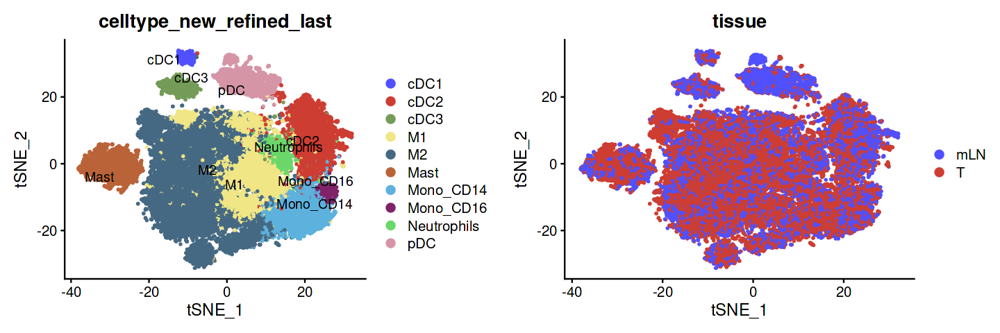

In [24]:
options(repr.plot.height = 4, repr.plot.width = 12)
ggarrange(DimPlot(
  seurat_Myeloid,reduction = "tsne",pt.size = 0.5,group.by = "celltype_new_refined_last"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel=TRUE)+scale_color_igv(),
DimPlot(
  seurat_Myeloid,reduction = "tsne",pt.size = 0.5,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_igv())

In [156]:
seurat_qc

An object of class Seurat 
49269 features across 474043 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 3 dimensional reductions calculated: pca, harmony, umap

In [157]:
length(cell)

[1] 1327

#### 5.5 去掉cluster，重新命名

In [ ]:
seurat_Myeloid <- subset(seurat_Myeloid, subset = RNA_snn_res.1 %in% setdiff(unique(seurat_Myeloid$RNA_snn_res.1), c('5','17','23','25')))

In [ ]:
Idents(seurat_Myeloid) <- seurat_Myeloid$RNA_snn_res.1
seurat_Myeloid <- RenameIdents(seurat_Myeloid,
    "6" = "5", "7" = "6", "8" = "7", "9" = "8",
    "10" = "9", "11" = "10", "12" = "11",
 "13" = "12", "14" = "13", "15" = "14", "16" = "15",
    "18" = "16", "19" = "17", "20" = "18",
 "21" = "19", "22" = "20", "24" = "21",
 "26" = "22"
)
seurat_Myeloid$seurat_clusters <- Idents(seurat_Myeloid)

In [ ]:
seurat_Myeloid

In [17]:
rm(list=ls())

#### 5.6 点图展示marker gene

In [262]:
seurat_Myeloid@meta.data$celltype_new_refined[which(seurat_Myeloid@meta.data$celltype_new_refined%in%'Mac_PPARG')] <- 'Mac_INHBA' 

In [263]:
unique(marker_Myeloid$cluster)

[1] Mac_C1QC    Mac_ISG15   Mast        Mac_SPP1    Mac_HSPA1B  Neutrophils
 [7] Mac_IL1B    cDC2        Mono_CD16   Mac_PPARG   pDC         cDC1       
[13] Mono_CD14   cDC3       
14 Levels: Mac_C1QC Mac_ISG15 Mast Mac_SPP1 Mac_HSPA1B Neutrophils ... cDC3

In [261]:
filter(marker_Myeloid[order(marker_Myeloid$avg_log2FC,decreasing = T),],cluster=='Mac_PPARG')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
MARCO1,0.000000e+00,2.426877,0.756,0.154,0.000000e+00,Mac_PPARG,MARCO
RETN,0.000000e+00,2.343453,0.528,0.087,0.000000e+00,Mac_PPARG,RETN
CCL202,5.294399e-225,2.286122,0.459,0.173,2.502610e-220,Mac_PPARG,CCL20
FABP4,2.691653e-290,2.155521,0.259,0.053,1.272317e-285,Mac_PPARG,FABP4
FBP13,0.000000e+00,2.095132,0.760,0.289,0.000000e+00,Mac_PPARG,FBP1
MCEMP1,0.000000e+00,2.082641,0.643,0.086,0.000000e+00,Mac_PPARG,MCEMP1
CXCL32,4.030342e-264,1.859616,0.671,0.302,1.905102e-259,Mac_PPARG,CXCL3
INHBA,0.000000e+00,1.772710,0.350,0.066,0.000000e+00,Mac_PPARG,INHBA
TIMP13,4.146668e-215,1.585008,0.872,0.592,1.960089e-210,Mac_PPARG,TIMP1


In [354]:
myeloid_marker <- list(      
                    #Mac_C1QC=c('C1QC','C1QA','APOE','CCL18'),
                #Mac_SPP1=c('SPP1','CSTB','FABP5'),
                #Mac_ISG15=c('ISG15','CXCL10','CCL8','IFIT2'),
              #Mac_IL1B=c('IL1B','CCL3L3','CCL3','CCL4'),
             #Mac_FN1=c('FN1','MARCO','RETN','CCL20'),
              #Mac_HSPA6=c('HSPA6','HSPA1B','DNAJB1'),  
              M1=c( 'CD68','CD86','CXCL9', 'CXCL10','IRF5'),#'FCGR3A',
              M2=c('CD163', 'MRC1', 'MSR1','FN1')
                Mono_CD14 =c('CD14',"S100A8",'S100A9',"FCN1",'VCAN'),###经典
                Mono_CD16 = c('FCGR3A','LST1','LILRB2'),###非经典
               
                cDC1 = c("CLEC9A",'FLT3','IDO1'),
                cDC2=c('CD1C','CD1E','FCER1A','HLA-DQB2'),
                cDC3 =  c("LAMP3",'FSCN1','CCR7'),
                pDC=c('LILRA4','CLEC4C','IL3RA','GZMB'),
                Neutrophils =  c("FCGR3B",'CSF3R','FPR1',"CXCR2"),
               Mast= c('TPSAB1','TPSB2','MS4A2','KIT'))

In [284]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


   Mac_C1QC    Mac_SPP1   Mac_ISG15    Mac_IL1B   Mac_INHBA   Mac_HSPA6 
      14434        2561        3498        1847        1725           0 
  Mono_CD14   Mono_CD16        cDC1        cDC2        cDC3         pDC 
       4339         665         622        5682        1395        3297 
Neutrophils        Mast 
       1590        4071 

In [357]:
seurat_Myeloid@meta.data$celltype_new_refined <- factor(seurat_Myeloid@meta.data$celltype_new_refined,levels = rev(names(myeloid_marker)))

In [271]:
seurat_Myeloid@meta.data$celltype_new_refined <- as.character(seurat_Myeloid@meta.data$celltype_new_refined)

In [ ]:
seurat_Myeloid@meta.data$celltype_new_refined

In [274]:
table(seurat_Myeloid@meta.data$celltype_new_refined)


       cDC1        cDC2        cDC3    Mac_C1QC    Mac_IL1B   Mac_INHBA 
        622        5682        1395       14434        1847        1725 
  Mac_ISG15    Mac_SPP1        Mast   Mono_CD14   Mono_CD16 Neutrophils 
       3498        2561        4071        4339         665        1590 
        pDC 
       3297 

In [76]:
Idents(seurat_Myeloid) <- factor(seurat_Myeloid@meta.data$celltype_new_refined,levels =rev( names(myeloid_marker)))

In [72]:
Idents(seurat_Myeloid)<- seurat_Myeloid@meta.data$celltype_new_refined

In [74]:
unique(seurat_Myeloid@meta.data$celltype_new_refined)

[1] "Mac_C1QC"    "Mac_SPP1"    "Mac_ISG15"   "Mast"        "Neutrophils"
 [6] "Mac_IL1B"    "cDC2"        "Mono_CD16"   "Mac_FN1"     "pDC"        
[11] "cDC1"        "Mono_CD14"   "cDC3"

In [358]:
options(repr.plot.height = 5, repr.plot.width = 18)
dot_plot <- DotPlot(seurat_Myeloid, features = myeloid_marker, 
        assay='RNA') +scale_color_gradientn(values = seq(0,1,0.2),colours = c('#5f509f','#6fc5a5','#f7fcba','#f47350','#9d0343'))+#scale_color_gradient2( low='#003399',mid = 'white',high = '#d32420')+#scale_color_gradientn(values = seq(0,1,0.2),colours = c('#5f509f','#6fc5a5','#f7fcba','#f47350','#9d0343'))+#
  theme_classic()+
  theme(panel.grid=element_blank(),axis.text.x = element_text(angle = 45,vjust = 0.5, hjust=0.5)) 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


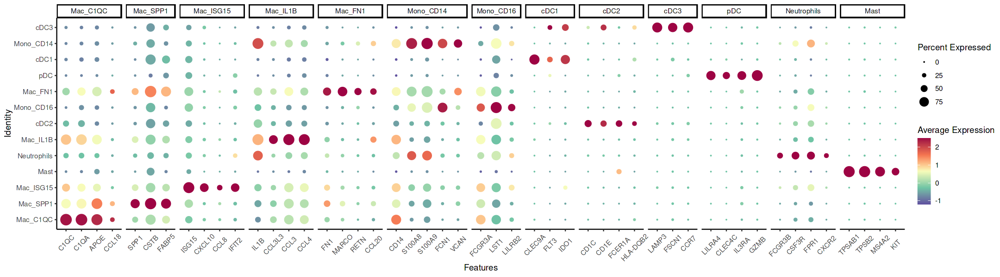

In [359]:
dot_plot

### 6、整合各个细胞类型标签

In [28]:
seurat_qc

An object of class Seurat 
49269 features across 472716 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [6]:
seurat_qc@meta.data$celltype_new_last_new <- seurat_qc@meta.data$celltype_new_last

In [9]:
table(seurat_qc@meta.data$celltype_new_last_new)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         1073         25417        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [70]:
table(seurat_Mac@meta.data$celltype_new_refined_last_test)


   M1    M2 
 2553 23937 

In [8]:
seurat_qc@meta.data$celltype_new_last_new[match(row.names(seurat_Mac@meta.data),row.names(seurat_qc@meta.data))] <- 
as.character(seurat_Mac@meta.data$celltype_new_refined_last_test)

In [114]:
seurat_qc@meta.data$celltype_new_last[match(row.names(seurat_Myeloid@meta.data),row.names(seurat_qc@meta.data))] <- 
as.character(seurat_Myeloid@meta.data$celltype_new_refined_last)

In [226]:
seurat_qc@meta.data$celltype_new_last_last[match(row.names(seurat_Mac@meta.data),row.names(seurat_qc@meta.data))] <- 
as.character(seurat_Mac@meta.data$celltype_new_refined_last_last)

In [39]:
seurat_qc@meta.data$celltype_new_last_last[match(row.names(seurat_Mac@meta.data),row.names(seurat_qc@meta.data))] <- 
as.character(seurat_Mac@meta.data$celltype_new_refined_last)

In [42]:
table(seurat_qc@meta.data$celltype_new_last_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         5906         20584        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [18]:
table(seurat_Mac$celltype_new_refined_last)


   M1    M2 
 7698 18792 

In [46]:
seurat_PTC <- subset(seurat_qc,subset=cancer=='PTC'&celltype_new_last_new%in%c('M1','M2','malignant'))

In [48]:
table(filter(seurat_PTC@meta.data,tissue=='T')$celltype_new_last)


       M1        M2 malignant 
     1135      2500     10140 

In [ ]:
filter(seurat_PTC@meta.data,tissue=='mLN')

In [9]:
seurat_PTC

An object of class Seurat 
49269 features across 28079 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [159]:
head(match(row.names(seurat_Mac@meta.data),row.names(seurat_qc@meta.data)))

[1] 424566 424567 424568 424569 424570 424571

In [225]:
seurat_qc@meta.data$celltype_new_last_last <- as.character(seurat_qc@meta.data$celltype_new_last)

In [156]:
seurat_qc@meta.data$celltype_new_last_last <- as.character(seurat_qc@meta.data$celltype_new_last_last)

In [230]:
table(seurat_qc@meta.data$celltype_new_last_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
     Mac_C1QC       Mac_FN1      Mac_IL1B     Mac_ISG15      Mac_SPP1 
        12854          2100          3793          4347          3396 
    malignant          Mast     Mono_CD14     Mono_CD16       Naive_T 
       127282          4071          4339           665         94068 
  Neutrophils            NK non_malignant           pDC      plasma_B 
         1590         16063          7376          3297         13891 

In [119]:
#seurat_qc@meta.data$celltype_new_last_refined <- seurat_qc@meta.data$celltype_new_last
seurat_qc@meta.data$celltype_new_last_refined[match(row.names(seurat_Myeloid@meta.data),row.names(seurat_qc@meta.data))]<- 
as.character(seurat_Myeloid@meta.data$celltype_new_refined_last)

In [120]:
table(seurat_qc@meta.data$celltype_new_last_refined)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         7277         19213         91816          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063         42842 
          pDC      plasma_B 
         3297         13891 

In [ ]:
cells <- row.names(seurat_qc@meta.data)[which(seurat_qc@meta.data$celltype_new_last%in%'Epithelium')]
length(cells)
d <- malignant[match(cells,malignant$cell.names),]
tail(d)

In [396]:
tail(d)

,cell.names,copykat.pred
,<chr>,<chr>
GSM5457212_ATTATACGACTC,GSM5457212_ATTATACGACTC,aneuploid
GSM5457212_CCCCCACACAGT,GSM5457212_CCCCCACACAGT,aneuploid
GSM5457212_CAGCAAGAAATA,GSM5457212_CAGCAAGAAATA,diploid
GSM5457212_GATAAATTCGGT,GSM5457212_GATAAATTCGGT,diploid
GSM5457212_GTTCTCCCTTCA,GSM5457212_GTTCTCCCTTCA,diploid
GSM5457213_GTAACTTACCCC,GSM5457213_GTAACTTACCCC,diploid


In [399]:
seurat_qc@meta.data['GSM1909307_AAACGGGCATGGTCAT-1',]

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,G2M.Score,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,celltype_new_last
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>,<chr>
GSM1909307_AAACGGGCATGGTCAT-1,GSM1909307,3571,1223,BRCA2,GSM1909307,BRCA0040,T,3.444413,0,0,⋯,-0.003918081,G1,7,4,4,4,4,Myeloid,Myeloid,Mac_C1QC


In [135]:
table(seurat_Myeloid$celltype_new_refined)


       cDC1        cDC2        cDC3    Mac_C1QC     Mac_FN1    Mac_IL1B 
        622        5682        1395       14434        1725        1938 
  Mac_ISG15    Mac_SPP1        Mast   Mono_CD14   Mono_CD16 Neutrophils 
       3498        6222        4071        4339         665        1590 
        pDC 
       3297 

In [391]:
table(d$copykat.pred)


aneuploid   diploid 
    89622     45036 

In [392]:
seurat_qc@meta.data$celltype_new_last[match(d$cell.names,row.names(seurat_qc@meta.data))]<- as.character(d$copykat.pred)

In [384]:
table(seurat_Myeloid$celltype_new_refined)


       Mast Neutrophils         pDC        cDC3        cDC2        cDC1 
       4071        1590        3297        1395        5682         622 
  Mono_CD16   Mono_CD14   Mac_HSPA6   Mac_INHBA    Mac_IL1B   Mac_ISG15 
        665        4339        1327        1725        1847        3498 
   Mac_SPP1    Mac_C1QC 
       2561       14434 

In [401]:
seurat_qc@meta.data$celltype_new_last[which(seurat_qc@meta.data$celltype_new_last%in%'aneuploid')] <- 'malignant'
seurat_qc@meta.data$celltype_new_last[which(seurat_qc@meta.data$celltype_new_last%in%'diploid')] <- 'non_malignant'

In [402]:
table(seurat_qc@meta.data$celltype_new_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
     Mac_C1QC     Mac_HSPA6      Mac_IL1B     Mac_INHBA     Mac_ISG15 
        14434          1327          1847          1725          3498 
     Mac_SPP1     malignant          Mast     Mono_CD14     Mono_CD16 
         2561         89622          4071          4339           665 
      Naive_T   Neutrophils            NK non_malignant           pDC 
        94068          1590         16063         45036          3297 
     plasma_B 
        13891 

#### 6.2 构建cellphonedb 输出文件

In [16]:
ls()

[1] "cellphone_input" "data"            "seurat_BRCA"     "seurat_Mac"     
[5] "seurat_qc"

In [3]:
cellphone_input <- function(sce,type){
if(type=='Tcell'){
print('Tcell')
sce_last <- subset(sce,subset=celltype_new_last_refined%in%c('malignant','Naive_T','CD8_Ex','plasma_B','CD8_EFF','B','NK','CD4_Treg','CD4_Ex'))
print('T')
sce_T <- subset(sce_last,subset=tissue%in%'T')
meta_T <- as.matrix(data.frame(Cell = rownames(sce_T@meta.data), 
                         cell_type = sce_T@meta.data$celltype_new_last_refined))

sce_T<- apply(sce_T@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_T), '/home/zhouyao/pancancer/cellphonedb/Tcell/T/T_count.txt', sep='\t', quote=F)
write.table(meta_T, '/home/zhouyao/pancancer/cellphonedb/Tcell/T/T_meta.txt', sep='\t', quote=F, row.names=F)

print('mLN')
sce_mLN <- subset(sce_last,subset=tissue%in%'mLN')
meta_mLN <- as.matrix(data.frame(Cell = rownames(sce_mLN@meta.data), 
                         cell_type = sce_mLN@meta.data$celltype_new_last_refined))

sce_mLN<- apply(sce_mLN@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_mLN), '/home/zhouyao/pancancer/cellphonedb/Tcell/mLN/mLN_count.txt', sep='\t',quote=F)
write.table(meta_mLN, '/home/zhouyao/pancancer/cellphonedb/Tcell/mLN/mLN_meta.txt', sep='\t',quote=F, row.names=F)
}

if(type=='Myeloid'){
print('Myeloid')
#sce_last <- subset(sce,subset=celltype_new_last%in%c('malignant','Macrophages','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Mast','Neutrophils'))
#sce_last <- subset(sce,subset=celltype_new_last_last%in%c('malignant','Mac_C1QC','Mac_SPP1','Mac_ISG15','Mac_IL1B','Mac_FN1'))
#sce_last <- subset(sce,subset=celltype_new_last_new%in%c('malignant','M1','M2'))
sce_last <- sce
sce_T <- subset(sce_last,subset=tissue%in%'T')
print('T')
meta_T <- as.matrix(data.frame(Cell = rownames(sce_T@meta.data), 
                         cell_type = sce_T@meta.data$celltype_new_refined_last_test))

sce_T<- apply(sce_T@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_T), '/home/zhouyao/pancancer/cellphonedb/LGALS9_high/Tumor/T_count.txt', sep='\t', quote=F)
write.table(meta_T,  '/home/zhouyao/pancancer/cellphonedb/LGALS9_high/Tumor/T_meta.txt', sep='\t', quote=F, row.names=F)

sce_mLN <- subset(sce_last,subset=tissue%in%'mLN')
print('mLN')
meta_mLN <- as.matrix(data.frame(Cell = rownames(sce_mLN@meta.data), 
                         cell_type = sce_mLN@meta.data$celltype_new_refined_last_test))

sce_mLN<- apply(sce_mLN@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_mLN), '/home/zhouyao/pancancer/cellphonedb/LGALS9_high/mLN/mLN_count.txt', sep='\t',quote=F)
write.table(meta_mLN, '/home/zhouyao/pancancer/cellphonedb/LGALS9_high/mLN/mLN_meta.txt', sep='\t',quote=F, row.names=F)
}
}

In [50]:
table(seurat_qc@meta.data$tissue[which(seurat_qc@meta.data$cancer=='PTC'&seurat_qc@meta.data$tissue=='mLN')])


  mLN 
41611 

In [49]:
seurat_qc@meta.data$tissue[which(seurat_qc@meta.data$cancer=='GC'&seurat_qc@meta.data$tissue=='T')] <- 'T1'
seurat_qc@meta.data$tissue[which(seurat_qc@meta.data$cancer=='GC'&seurat_qc@meta.data$tissue=='mLN')] <- 'T'
seurat_qc@meta.data$tissue[which(seurat_qc@meta.data$cancer=='GC'&seurat_qc@meta.data$tissue=='T1')] <- 'mLN'

In [10]:
table(seurat_qc$celltype_new_last_new)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         1073         25417        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [24]:
rm(list=ls())

In [37]:
seurat_TC <- subset(seurat_qc,subset=cancer=='TC'&celltype_new_last_new%in%c('M1','M2','malignant'))

In [49]:
table(filter(seurat_gc@meta.data,celltype=='M2')$tissue)


mLN   T 
 63 439 

In [4]:
data <- cellphone_input(sce=seurat_M2_new,type='Myeloid')

[1] "Myeloid"
[1] "T"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 6.4 GiB”


[1] "mLN"


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.4 GiB”


In [5]:
table(seurat_qc$celltype_new_last_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         5906         20584        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [7]:
seurat_qc@meta.data$celltype_new_last[which(seurat_qc@meta.data$celltype_new_last%in%c('M1','M2'))] <- 'Macrophages'

In [55]:
cellphone_input <- function(sce,type,inputdir){
if(type=='Tcell'){
print('Tcell')
sce_last <- subset(sce,subset=celltype_new_last_refined%in%c('malignant','Naive_T','CD8_Ex','plasma_B','CD8_EFF','B','NK','CD4_Treg','CD4_Ex'))
print('T')
sce_T <- subset(sce_last,subset=tissue%in%'T')
meta_T <- as.matrix(data.frame(Cell = rownames(sce_T@meta.data), 
                         cell_type = sce_T@meta.data$celltype_new_last_refined))

sce_T<- apply(sce_T@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_T), '/home/zhouyao/pancancer/cellphonedb/Tcell/T/T_count.txt', sep='\t', quote=F)
write.table(meta_T, '/home/zhouyao/pancancer/cellphonedb/Tcell/T/T_meta.txt', sep='\t', quote=F, row.names=F)

print('mLN')
sce_mLN <- subset(sce_last,subset=tissue%in%'mLN')
meta_mLN <- as.matrix(data.frame(Cell = rownames(sce_mLN@meta.data), 
                         cell_type = sce_mLN@meta.data$celltype_new_last_refined))

sce_mLN<- apply(sce_mLN@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_mLN), '/home/zhouyao/pancancer/cellphonedb/Tcell/mLN/mLN_count.txt', sep='\t',quote=F)
write.table(meta_mLN, '/home/zhouyao/pancancer/cellphonedb/Tcell/mLN/mLN_meta.txt', sep='\t',quote=F, row.names=F)
}

if(type=='Myeloid'){
print('Myeloid')
sce_last <- subset(sce,subset=celltype_new_last%in%c('malignant','Macrophages','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Mast','Neutrophils'))
#sce_last <- subset(sce,subset=celltype_new_last_last%in%c('malignant','Mac_C1QC','Mac_SPP1','Mac_ISG15','Mac_IL1B','Mac_FN1'))
#sce_last <- subset(sce,subset=celltype_new_last_last%in%c('malignant','M1','M2'))
#sce_last <- sce
sce_T <- subset(sce_last,subset=tissue%in%'T')
print('T')
meta_T <- as.matrix(data.frame(Cell = rownames(sce_T@meta.data), 
                         cell_type = sce_T@meta.data$celltype_new_last))

sce_T<- apply(sce_T@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_T), paste0(inputdir,'/Tumor/T_count.txt'), sep='\t', quote=F)
write.table(meta_T,  paste0(inputdir,'/Tumor/T_meta.txt'), sep='\t', quote=F, row.names=F)

sce_mLN <- subset(sce_last,subset=tissue%in%'mLN')
print('mLN')
meta_mLN <- as.matrix(data.frame(Cell = rownames(sce_mLN@meta.data), 
                         cell_type = sce_mLN@meta.data$celltype_new_last))

sce_mLN<- apply(sce_mLN@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
write.table(as.matrix(sce_mLN), paste0(inputdir,'/mLN/mLN_count.txt'), sep='\t',quote=F)
write.table(meta_mLN, paste0(inputdir,'/mLN/mLN_meta.txt'), sep='\t',quote=F, row.names=F)
}
}


In [54]:
table(seurat_qc@meta.data$celltype_new_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
  Macrophages     malignant          Mast     Mono_CD14     Mono_CD16 
        26490        127282          4071          4339           665 
      Naive_T   Neutrophils            NK non_malignant           pDC 
        94068          1590         16063          7376          3297 
     plasma_B 
        13891 

In [ ]:
data <- cellphone_input(sce=seurat_qc,type='Myeloid',inputdir='/home/zhouyao/pancancer/cellphonedb/Mac_T_mLN/')

In [75]:
table(seurat_qc$celltype_new_last_new)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         2553         23937        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [ ]:
data <- cellphone_input(sce= seurat_qc ,type='Tcell')

### 7 绘图整理

#### 7.1 细胞大类展示（细胞类型、组织来源、比例、小提琴图）

In [217]:
seurat_qc@meta.data$celltype_new <- factor(seurat_qc@meta.data$celltype_new,levels=c('T','NK/NKT','B','Plasma_B','Myeloid','Epithelium','Fibroblast','Endothelial')) 

In [216]:
table(seurat_qc@meta.data$celltype_new)


          B Endothelial  Epithelium  Fibroblast     Myeloid      NK/NKT 
      44161       28055      134658       46912       47053       45351 
   Plasma_B           T 
      14484      110944 

In [97]:
ls()


[1] "a"               "cellphone_input" "col_fun"         "data"           
 [5] "dot_plot"        "genes"           "genes_to_check"  "heatmap.plot"   
 [9] "lym_color"       "meta_qc"         "metadata"        "mye_color"      
[13] "myeloid_marker"  "p"               "plot_fig"        "Roe"            
[17] "sce"             "seurat"          "seurat_Myeloid"  "seurat_qc"

In [282]:
mye_color <- c(pal_igv(palette = 'default',alpha = 1)(14))

In [288]:
seurat_Myeloid@meta.data$celltype_new_refined <- factor(seurat_Myeloid@meta.data$celltype_new_refined,levels=names(myeloid_marker)) 

In [26]:
lym_color <- c('#E64B35FF','#4DBBD5FF','#00A087FF','#3C5488FF','#F39B7FFF','#8491B4FF','#91D1C2FF','#7E6148FF')
names(lym_color) <- c('NK','CD4_Ex','CD8_Ex','CD8_EFF','Naive_T','CD4_Treg','B','plasma_B')

#mye_color <- c('#f79058','#f5c667','#e6674d','#e6674d','#f8a895','#f8a895','#f8a895','#5569b1','#8e5475','#baa2cc',
 #             '#b6d991','#6196ad','#606266','#e9674f')
#names(mye_color) <- c('Neutrophils','Mono_CD14','Mono_CD16','Macrophages','pDC','cDC1','cDC2','cDC3','Mast')
#mye_color <- c("Mac_C1QC" = "#A6CEE3", "Mac_SPP1" = "#1F78B4", "Mac_ISG15" = "#B2DF8A", "Mac_IL1B" = "#33A02C", "Mac_INHBA" = "#FB9A99", 
 #               "Mono_CD14" = "#E31A1C", "Mono_CD16" = "#FDBF6F", "cDC1" = "#FF7F00", "cDC2" = "#CAB2D6", "cDC3" = "#6A3D9A", "pDC" = "#B15928", "Neutrophils" = "#1B9E77", 
  #              "Mast" = "#D95F02")
mye_color <- c("M1" = "#A6CEE3", "M2" = "#1F78B4",
                "Mono_CD14" = "#E31A1C", "Mono_CD16" = "#FDBF6F", "cDC1" = "#FF7F00", "cDC2" = "#CAB2D6", "cDC3" = "#6A3D9A", "pDC" = "#B15928", "Neutrophils" = "#1B9E77", 
                "Mast" = "#D95F02")
#mye_color <- c(pal_igv(palette = 'default',alpha = 1)(14))
#names(mye_color) <- names(myeloid_marker)

In [640]:
mye_color

Mac_C1QC    Mac_SPP1   Mac_ISG15    Mac_IL1B   Mac_INHBA   Mac_HSPA6 
"#5050FFFF" "#CE3D32FF" "#749B58FF" "#F0E685FF" "#466983FF" "#BA6338FF" 
  Mono_CD14   Mono_CD16        cDC1        cDC2        cDC3         pDC 
"#5DB1DDFF" "#802268FF" "#6BD76BFF" "#D595A7FF" "#924822FF" "#837B8DFF" 
Neutrophils        Mast 
"#C75127FF" "#D58F5CFF"

In [25]:
plot_fig <- function(seurat_qc,goal,type){
    seurat_qc@meta.data$tissue <- factor(seurat_qc@meta.data$tissue,levels = c('T','mLN'))
    if(type=='T'){
    p_celltype <- DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_manual(values = lym_color)+theme(title = ,legend.position = 'top')+labs(title = "")}
    if(type=='Myeloid'){
    p_celltype <- DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_manual(values = mye_color)+theme(legend.position = 'top')+labs(title = "")}
    if(type=='qc'){
        p_celltype <- DimPlot(
  seurat_qc,reduction = "umap",pt.size = 0.5,group.by = goal#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+scale_color_npg()+theme(legend.position = 'top')+labs(title = "")
    }
    p_tissue <-  DimPlot(
  seurat_qc,reduction = "tsne",pt.size = 0.1,group.by = "tissue"#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=F)+scale_color_d3()+theme(legend.position = 'top')+labs(title = "")
 
bar_per <- as.data.frame(table(seurat_qc@meta.data$tissue,
           seurat_qc@meta.data[,goal])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
    if(type=='qc'){p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_npg()}
    if(type=='T'){
p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "right" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values = lym_color)}
     if(type=='Myeloid'){
p_tissue_cell <- ggplot(bar_per, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ) +labs(y = "Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_manual(values = mye_color)}
    
bar_per_cancer <- as.data.frame(table(seurat_qc@meta.data[,goal],
           seurat_qc@meta.data[,'cancer'])) %>% 
           group_by(Var1) %>%
           mutate(sum(Freq)) %>%
           mutate(percent = Freq / `sum(Freq)`)
p_cell_cancer <- ggplot(bar_per_cancer, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(legend.position = "top" ,axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +labs(y = "% Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_aaas()
    plot <- list(p_celltype,p_tissue,p_tissue_cell,p_cell_cancer)
}

In [27]:
table(seurat_qc$celltype_new_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
     Mac_C1QC       Mac_FN1      Mac_IL1B     Mac_ISG15      Mac_SPP1 
        14434          1725          1938          3498          6222 
    malignant          Mast     Mono_CD14     Mono_CD16       Naive_T 
        89870          4071          4339           665         94068 
  Neutrophils            NK non_malignant           pDC      plasma_B 
         1590         16063         44788          3297         13891 

In [30]:
#seurat_T$celltype_new_refined <- factor(seurat_T$celltype_new_refined,levels = names(lym_color)) 
p <- plot_fig(seurat_qc=seurat_Myeloid,goal='celltype_new_refined_last',type='Myeloid')
options(repr.plot.height = 15, repr.plot.width = 15)
(p[[1]]+p[[2]])/(p[[3]]+p[[4]])

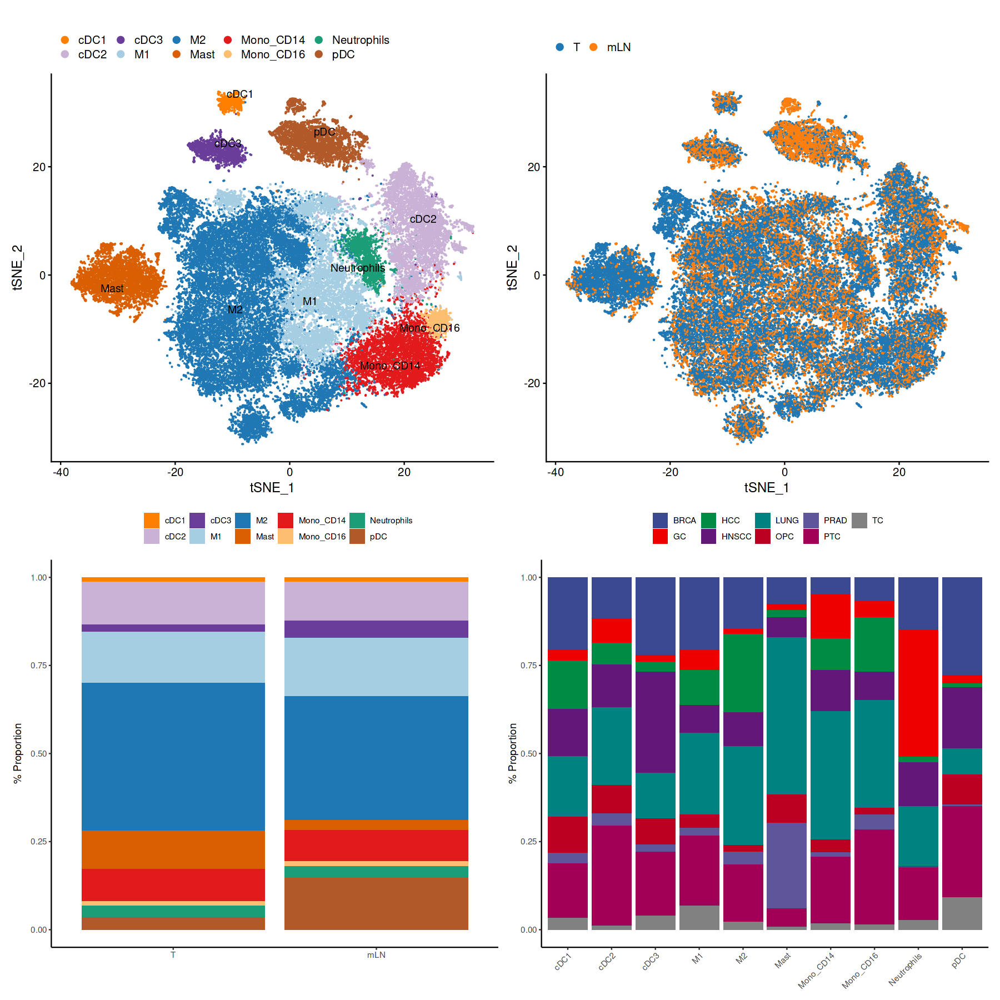

In [31]:
options(repr.plot.height = 15, repr.plot.width = 15)
(p[[1]]+p[[2]])/(p[[3]]+p[[4]])

In [334]:
#options(repr.plot.height = 10, repr.plot.width = 10)
pdf('/home/zhouyao/pancancer/figure/seurat_T.pdf',width = 9,height = 9)
(p[[1]]+p[[2]])/(p[[3]]+p[[4]])
dev.off()
dev.off()

png 
  2

null device 
          1

In [82]:
pdf('/home/zhouyao/pancancer/figure/Myeloid_marker.pdf',width = 18,height = 5)
dot_plot
dev.off()
dev.off()

png 
  2

null device 
          1

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Warning message:
“ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


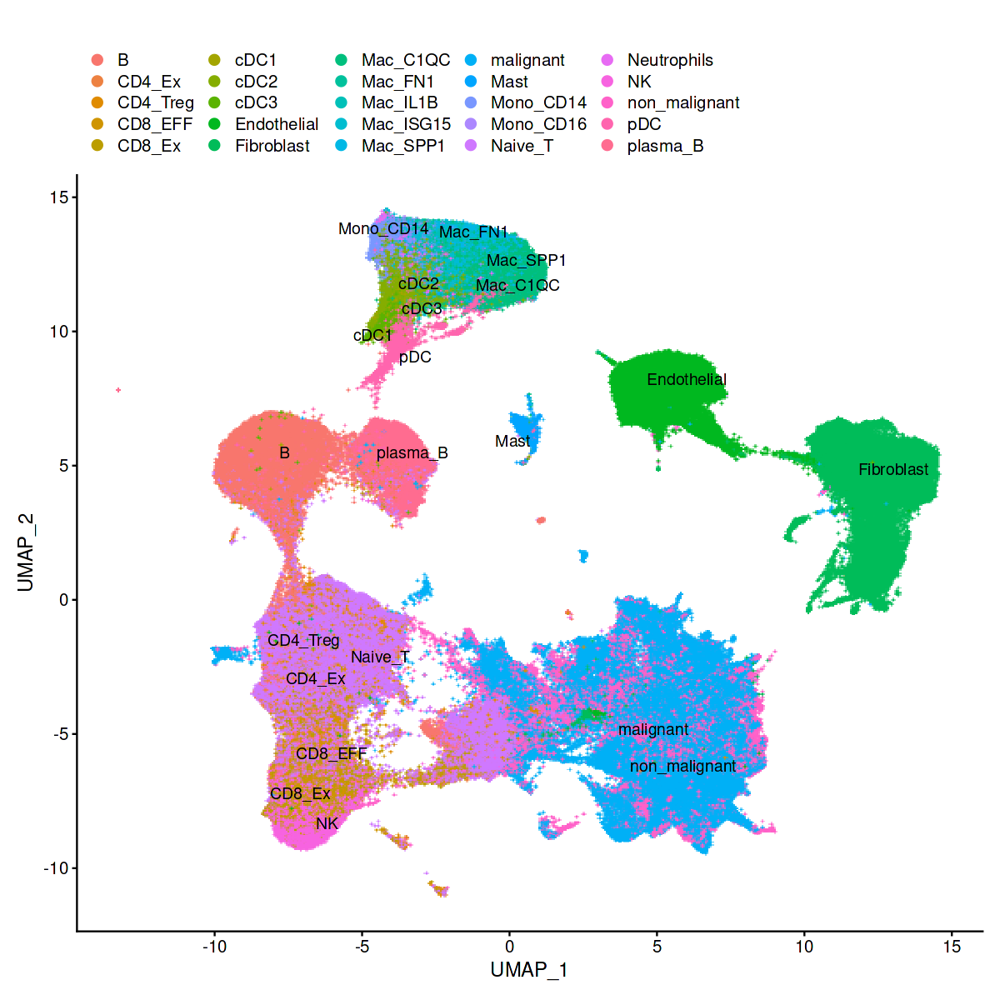

In [33]:
DimPlot(
  seurat_qc,reduction = "umap",pt.size = 0.5,group.by = 'celltype_new_last'#label.color = color_cluster[unique(allseu@meta.data$cluster)]
  ,label=TRUE,repel = TRUE)+theme(legend.position = 'top')+labs(title = "")

In [94]:
seurat_T@meta.data$cancer_primary <- seurat_T@meta.data$cancer        

In [98]:
seurat_T@meta.data$cancer[which(seurat_T@meta.data$cancer%in%c('BRCA_3'))] <- 'BRCA'

In [140]:
seurat_epi <- subset(seurat_test_test,subset=celltype_new%in%'Epithelium')

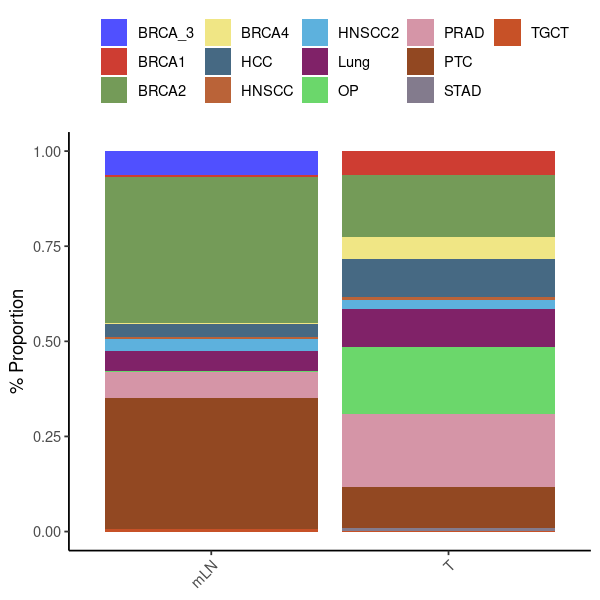

In [141]:
options(repr.plot.height = 5, repr.plot.width = 5)
bar_data_cancer=as.data.frame(table(seurat_epi@meta.data$tissue,
         seurat_epi@meta.data[,'cancer']))
bar_per_cancer <- bar_data_cancer %>% 
  group_by(Var1) %>%
  mutate(sum(Freq)) %>%
  mutate(percent = Freq / `sum(Freq)`)
ggplot(bar_per_cancer, aes(x = Var1, y = percent)) +
  geom_bar(aes(fill = Var2) , stat = "identity") + theme_classic()+
  theme(
        legend.position = "top",       
        axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +
  labs(y = "% Proportion", fill = NULL)+labs(x = NULL)+
  scale_fill_igv()

In [143]:
filter(seurat_epi@meta.data,cancer=='STAD'&tissue=='T')

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,S.Score,G2M.Score,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>
GSM5004180_AAAGGATCATGCCGAC-1,GSM5004180,1676,772,STAD,GSM5004180,STAD1,T,0.00000000,0,0,-0.055656651,-0.064045405,G1,4,5,5,6,6,Epithelium,Epithelium
GSM5004180_AACAACCAGTTCACTG-1,GSM5004180,4925,2119,STAD,GSM5004180,STAD1,T,0.93401015,0,0,0.076968896,0.094581607,G2M,4,10,22,26,26,Epithelium,Epithelium
GSM5004180_AACGAAAAGCGCTGCT-1,GSM5004180,3145,1567,STAD,GSM5004180,STAD1,T,0.79491256,0,0,-0.045780144,-0.057162242,G1,4,5,5,6,6,Epithelium,Epithelium
GSM5004180_AAGATAGAGGTTGGAC-1,GSM5004180,3875,1965,STAD,GSM5004180,STAD1,T,0.25806452,0,0,-0.129307442,-0.061762548,G1,6,5,5,6,6,Epithelium,Epithelium
GSM5004180_AAGCATCGTACGCGTC-1,GSM5004180,7694,2800,STAD,GSM5004180,STAD1,T,0.02599428,0,0,-0.024326157,-0.015437525,G1,6,5,5,6,6,Epithelium,Epithelium
GSM5004180_AATCGTGCAAGGGTCA-1,GSM5004180,872,637,STAD,GSM5004180,STAD1,T,0.11467890,0,0,-0.072641141,-0.045875833,G1,4,5,5,6,6,Epithelium,Epithelium
GSM5004180_AATCGTGCATGGCCCA-1,GSM5004180,612,423,STAD,GSM5004180,STAD1,T,0.65359477,0,0,0.010895956,0.229158566,G2M,4,1,2,3,3,Epithelium,Epithelium
GSM5004180_ACATCCCAGAGGTTAT-1,GSM5004180,2990,1548,STAD,GSM5004180,STAD1,T,0.60200669,0,0,-0.059080546,-0.023371037,G1,4,5,5,6,6,Epithelium,Epithelium
GSM5004180_ACCAAACGTTCCCACT-1,GSM5004180,1602,912,STAD,GSM5004180,STAD1,T,0.12484395,0,0,-0.058345396,-0.108579088,G1,4,10,10,12,12,Epithelium,Epithelium


#### 7.2 小提琴图

In [128]:
my_comparisons <- list( c("T", "mLN"))
seurat <- subset(seurat_Myeloid,subset=celltype_new_refined%in%'Mac_INHBA')
VlnPlot(seurat,"LGALS9", pt.size = 0,group.by = 'tissue') +
  NoLegend() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") 
 # ylim(-2, 15)

ERROR: Error in FetchData.Seurat(object = object, vars = unique(x = expr.char[vars.use]), : None of the requested variables were found: 


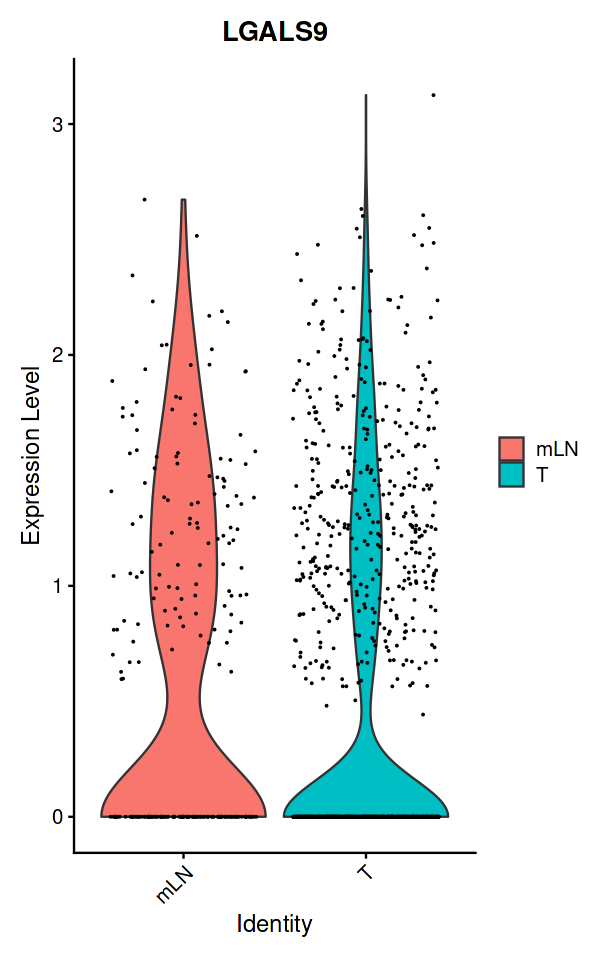

In [125]:
options(repr.plot.height = 5, repr.plot.width = 20)
VlnPlot(seurat,group.by = 'tissue','LGALS9')

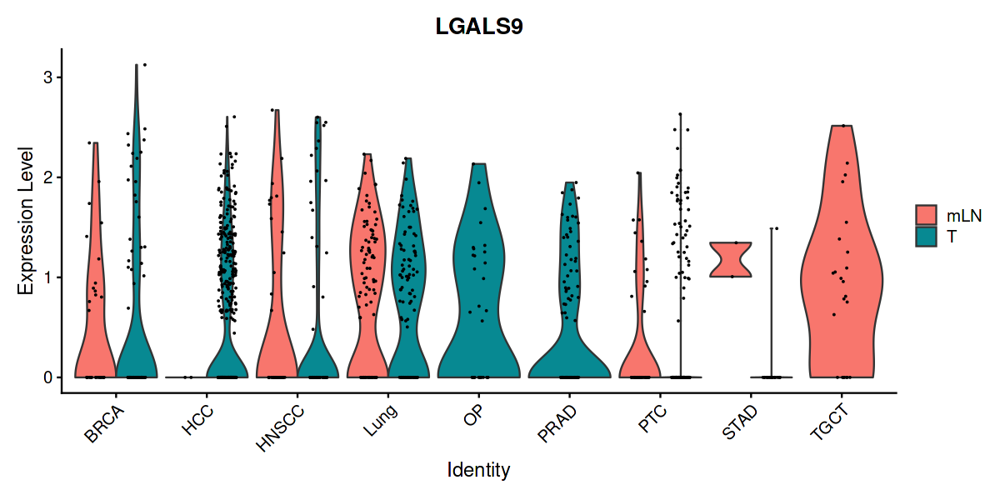

In [131]:
options(repr.plot.height = 5, repr.plot.width = 10)
VlnPlot(seurat,split.by = 'tissue',group.by = 'cancer','LGALS9')

### 8、髓系细胞-差异基因通路

In [171]:
table(seurat_qc$celltype_new_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         7277         19213         89989          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063         44669 
          pDC      plasma_B 
         3297         13891 

In [376]:
seurat <- subset(seurat_Myeloid,subset=celltype_new_refined%in%'Mac_ISG15')
Idents(seurat) <- seurat@meta.data$tissue
table(filter(seurat@meta.data,tissue=='T')$cancer)


 BRCA   HCC HNSCC  Lung    OP  PRAD   PTC  STAD  TGCT 
  106   371   284   987   159    46   518   536    29 

In [ ]:
seurat_Myeloid$celltype_new_last

In [174]:
df[order(df$avg_log2FC,decreasing = T),]

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,label,diff_percent
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
MT1X,2.582411e-142,2.7323454,0.432,0.298,1.220680e-137,MT1X,0.134
MT2A,3.798002e-164,2.1788347,0.705,0.643,1.795278e-159,MT2A,0.062
MT1E,1.336060e-50,1.2861136,0.267,0.191,6.315420e-46,MT1E,0.076
IFITM1,3.827356e-90,0.9799291,0.656,0.572,1.809153e-85,IFITM1,0.084
MT-ND4L,1.059764e-93,0.8749081,0.690,0.668,5.009399e-89,MT-ND4L,0.022
CCL14,4.228436e-02,0.7407064,0.341,0.354,1.000000e+00,NA,-0.013
C2CD4B,1.731524e-14,0.7256767,0.295,0.258,8.184740e-10,C2CD4B,0.037
CLEC3B,2.011568e-96,0.7241749,0.266,0.154,9.508480e-92,CLEC3B,0.112
CXCL12,1.374633e-29,0.7054259,0.324,0.267,6.497754e-25,CXCL12,0.057



  mLN     T 
10281 36631 

Warning message:
“Removed 2120 rows containing missing values (`geom_text_repel()`).”


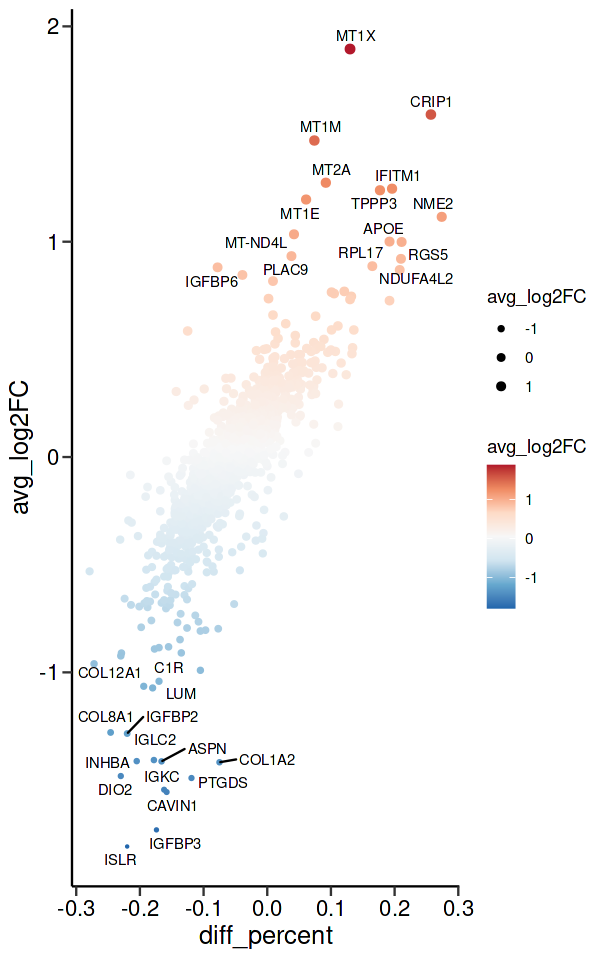

In [175]:
seurat <- subset(seurat_qc,subset=celltype_new_last%in%'Fibroblast')
Idents(seurat) <- seurat@meta.data$tissue
table(seurat@meta.data$tissue)
df <- FindMarkers(seurat, ident.1 = "mLN",ident.2 = c("T"), min.pct = 0.25,logfc.threshold = 0)
df_test <- filter(df,p_val_adj<0.05)
diff_genes <- row.names(rbind.data.frame(top_n(df_test,n=15,wt= avg_log2FC),top_n(df_test,n=-15,wt= avg_log2FC)))
df$label <- row.names(df)
df$label[!(df$label %in% diff_genes )] <- NA
df$diff_percent <- df$`pct.1` - df$`pct.2`   
###展示差异基因
p_dot <- ggplot(df, aes(x = diff_percent, y = avg_log2FC, color = avg_log2FC)) + 
    geom_point(aes(size = avg_log2FC)) + 
    scale_size_continuous(range = c(0.2, 2)) + 
    # scale_color_gradientn(colors = rev(rbPal(50))) + 
    scale_color_distiller(palette = "RdBu") + 
    ggrepel::geom_text_repel(aes(label = label), color = "black", size = 3) +
    theme_classic() + 
    theme(panel.grid = element_blank(), axis.title = element_text(size = 15, color = "black"), 
          axis.text = element_text(size = 13, color = "black"), axis.ticks.length = unit(0.4, "lines"))
options(repr.plot.height = 8, repr.plot.width = 5)
p_dot 

Warning message:
“Removed 1827 rows containing missing values (`geom_text_repel()`).”
Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


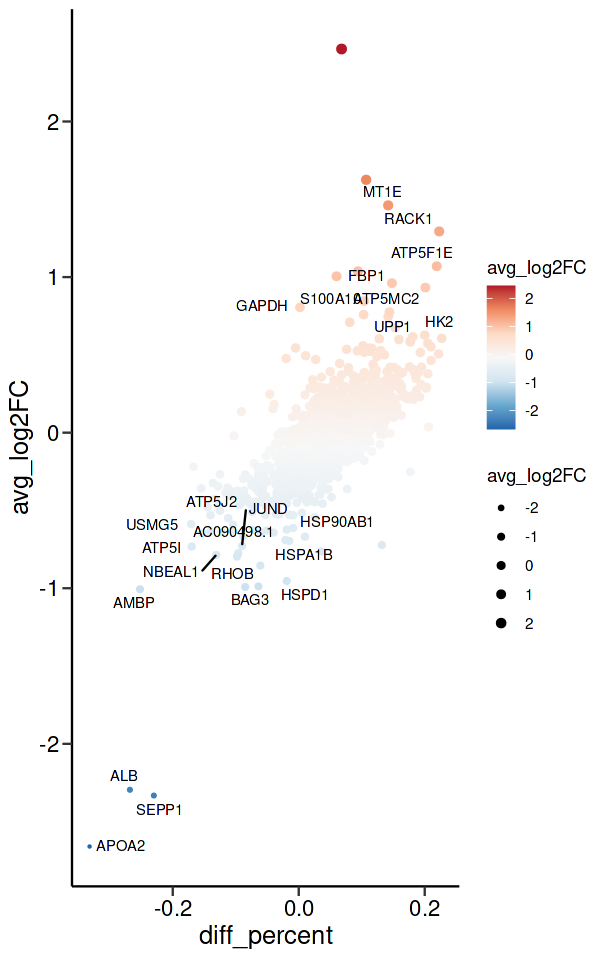

In [113]:
options(repr.plot.height = 8, repr.plot.width = 5)
p_dot

In [114]:
###对基因列表GSEA富集分析（GO 和Reactom通路分析 ）
gene.map.table <- bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db, drop = F)
df$gene.ID <- gene.map.table[match(rownames(df), gene.map.table$SYMBOL), "ENTREZID"]
gsea.gene.list <- df$avg_log2FC
names(gsea.gene.list) <- as.character(df$gene.ID)
gsea.gene.list <- gsea.gene.list[!is.na(names(gsea.gene.list))]
length(gsea.gene.list)


'select()' returned 1:1 mapping between keys and columns

Warning message in bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", :
“4.68% of input gene IDs are fail to map...”


[1] 1770

In [ ]:
gsea.gene.list

In [ ]:
Go_Reactomeresult <- gsePathway(geneList = sort(gsea.gene.list, decreasing = TRUE))
gseGO.res <- gseGO(geneList = sort(gsea.gene.list, decreasing = TRUE), ont = "BP", OrgDb = org.Hs.eg.db)


In [83]:
spp1 <- list()
spp1$Go_Reactomeresult <- Go_Reactomeresult
spp1$gseGO.res <- gseGO.res
save(spp1,file='/home/zhouyao/pancancer/figure/IL1B.RData')

In [65]:
gene.function.plot.data <- as.data.frame(gseGO.res) 
gene.function.plot.data <- filter(gene.function.plot.data,p.adjust<0.05)
gene.function.plot.data

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0045744,GO:0045744,negative regulation of G protein-coupled receptor signaling pathway,11,-0.9153941,-2.104624,1.973743e-06,0.001494123,0.001279297,35,"tags=45%, list=1%, signal=45%",5341/6352/5997/3576/5142
GO:0009968,GO:0009968,negative regulation of signal transduction,267,-0.4347378,-1.823029,8.377168e-07,0.001494123,0.001279297,308,"tags=21%, list=10%, signal=21%",7090/348/5579/3638/5606/7323/7430/10010/3688/4170/2773/3148/23645/3301/1843/9021/1540/4929/5514/6789/29035/3091/8837/7320/84919/3304/5728/399/602/57674/4179/6397/4000/3383/5329/9775/3315/4780/5788/6498/5341/1654/284996/7128/6352/10221/6648/9516/604/5997/10105/3553/3576/10625/5142/5743
GO:0010648,GO:0010648,negative regulation of cell communication,280,-0.4244157,-1.793963,1.811533e-06,0.001494123,0.001279297,311,"tags=21%, list=10%, signal=20%",90007/7090/348/5579/3638/5606/7323/7430/10010/3688/4170/2773/3148/23645/3301/1843/9021/1540/4929/5514/6789/29035/3091/8837/7320/84919/3304/5728/399/602/57674/4179/6397/4000/3383/5329/9775/3315/4780/5788/6498/5341/5008/1654/284996/7128/6352/10221/6648/9516/604/5997/10105/3553/3576/10625/5142/5743
GO:0023057,GO:0023057,negative regulation of signaling,280,-0.4244157,-1.793963,1.811533e-06,0.001494123,0.001279297,311,"tags=21%, list=10%, signal=20%",90007/7090/348/5579/3638/5606/7323/7430/10010/3688/4170/2773/3148/23645/3301/1843/9021/1540/4929/5514/6789/29035/3091/8837/7320/84919/3304/5728/399/602/57674/4179/6397/4000/3383/5329/9775/3315/4780/5788/6498/5341/5008/1654/284996/7128/6352/10221/6648/9516/604/5997/10105/3553/3576/10625/5142/5743
GO:0009132,GO:0009132,nucleoside diphosphate metabolic process,36,0.6787287,2.132641,3.783780e-06,0.002291457,0.001961990,323,"tags=39%, list=11%, signal=35%",2203/3939/2597/5027/5223/2821/2023/5315/7167/129607/226/3099/4354/83440
GO:0048585,GO:0048585,negative regulation of response to stimulus,353,-0.3952602,-1.690968,5.031890e-06,0.002539427,0.002174306,300,"tags=19%, list=10%, signal=19%",7090/348/5579/10507/3638/5606/7323/7430/10010/3688/4170/2773/4790/3148/23645/3301/928/1843/10475/9021/1540/4929/7538/5514/6789/29035/3091/8837/7320/84919/3304/8013/5728/399/602/9958/57674/4179/6397/4000/3383/64092/5329/9775/3315/4780/5788/6498/5341/1654/2358/284996/7128/6352/10221/6648/9516/604/5997/10105/3553/23347/3576/10625/5142/5743/1604
GO:0009185,GO:0009185,ribonucleoside diphosphate metabolic process,32,0.6889804,2.124020,6.540094e-06,0.002829058,0.002422293,323,"tags=41%, list=11%, signal=37%",2203/3939/2597/5027/5223/2821/2023/5315/7167/226/3099/4354/83440
GO:0009199,GO:0009199,ribonucleoside triphosphate metabolic process,32,0.6830246,2.105659,1.082914e-05,0.003136217,0.002685289,310,"tags=47%, list=10%, signal=43%",506/517/2023/513/10476/509/539/168537/515/10632/54209/226/518/387/498
GO:0009205,GO:0009205,purine ribonucleoside triphosphate metabolic process,32,0.6830246,2.105659,1.082914e-05,0.003136217,0.002685289,310,"tags=47%, list=10%, signal=43%",506/517/2023/513/10476/509/539/168537/515/10632/54209/226/518/387/498


,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GO:0006457,GO:0006457,protein folding,78,-0.6302689,-2.239957,9.065263e-09,2.543713e-05,2.243414e-05,110,"tags=21%, list=4%, signal=20%",3309/972/3326/2289/10049/3301/3336/3320/3303/3337/10808/3329/3304/3315/3310/10105
GO:0006165,GO:0006165,nucleoside diphosphate phosphorylation,26,0.7922982,2.347389,4.965246e-08,4.644160e-05,4.095892e-05,126,"tags=46%, list=5%, signal=44%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223/4830
GO:0046939,GO:0046939,nucleotide phosphorylation,26,0.7922982,2.347389,4.965246e-08,4.644160e-05,4.095892e-05,126,"tags=46%, list=5%, signal=44%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223/4830
GO:0006096,GO:0006096,glycolytic process,23,0.8044221,2.317771,1.478327e-07,8.296369e-05,7.316938e-05,111,"tags=48%, list=4%, signal=46%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223
GO:0006757,GO:0006757,ATP generation from ADP,23,0.8044221,2.317771,1.478327e-07,8.296369e-05,7.316938e-05,111,"tags=48%, list=4%, signal=46%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223
GO:0009132,GO:0009132,nucleoside diphosphate metabolic process,31,0.7493383,2.324802,1.797803e-07,8.407725e-05,7.415148e-05,127,"tags=42%, list=5%, signal=40%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223/4830/4354
GO:0046031,GO:0046031,ADP metabolic process,24,0.7999436,2.313491,2.577075e-07,9.708494e-05,8.562355e-05,111,"tags=46%, list=4%, signal=44%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223
GO:0009135,GO:0009135,purine nucleoside diphosphate metabolic process,27,0.7685886,2.303691,3.459905e-07,9.708494e-05,8.562355e-05,127,"tags=44%, list=5%, signal=43%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223/4354
GO:0009179,GO:0009179,purine ribonucleoside diphosphate metabolic process,27,0.7685886,2.303691,3.459905e-07,9.708494e-05,8.562355e-05,127,"tags=44%, list=5%, signal=43%",2203/2597/3939/2023/226/5315/7167/3099/2821/5230/5223/4354


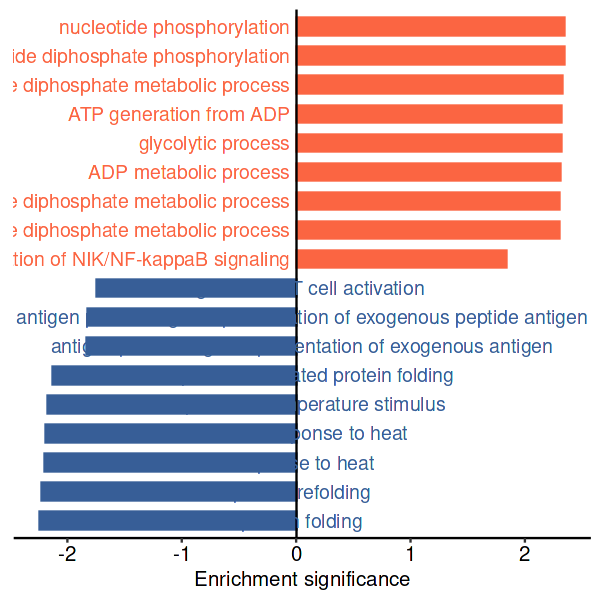

In [79]:
####筛选前8个go展示
gene.function.plot.data <- as.data.frame(gseGO.res) 
gene.function.plot.data <- filter(gene.function.plot.data,p.adjust<0.05)
gene.function.plot.data
#gene.function.plot.data <-  rbind.data.frame(top_n(gene.function.plot.data,n=8,wt= NES),top_n(gene.function.plot.data,n=-8,wt= NES))
gene.function.plot.data <-  rbind.data.frame(top_n(gene.function.plot.data,n=8,wt= NES),rbind.data.frame(top_n(gene.function.plot.data,n=-6,wt= NES),
                                                                                                        gene.function.plot.data[c('GO:0019884','GO:1901224','GO:0002478','GO:0050863'),]))
#options(repr.plot.height = 8, repr.plot.width = 14)
gene.function.plot.data$Description <- factor(gene.function.plot.data$Description, levels = gene.function.plot.data$Description[order(gene.function.plot.data$NES, decreasing = F)])
p_go <- ggplot(gene.function.plot.data, aes(x = Description, y = NES, fill = NES > 0, color = NES > 0)) + 
  coord_flip() + 
  geom_bar(stat = "identity", width = 0.6) + 
  geom_hline(yintercept = 0, size = 0.5) + 
  geom_text(data = subset(gene.function.plot.data, NES < 0),
            aes(x = Description, y = 0.05, label = Description, color = NES > 0), size = 4, hjust = "outward") +  
  geom_text(data = subset(gene.function.plot.data, NES > 0),
            aes(x = Description, y = -0.05, label = Description, color = NES > 0), size = 4, hjust = "outward") +  
  scale_fill_manual(values = c("#375E97", "#FB6542")) + 
  scale_color_manual(values = c("#375E97", "#FB6542")) + 
  labs(y = "Enrichment significance") + guides(color = "none", fill = "none") + 
  theme_classic() + 
  theme(axis.title.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank(), 
        axis.text.y = element_blank(), axis.text.x = element_text(size = 12, color = "black"), axis.title.x = element_text(size = 12))
p_go

In [89]:
gene.function.plot.data1 <- as.data.frame(Go_Reactomeresult) 
gene.function.plot.data1 <- filter(gene.function.plot.data1,p.adjust<0.05)
gene.function.plot.data1
#gene.function.plot.data1 <-  rbind.data.frame(top_n(gene.function.plot.data1,n=8,wt= NES),top_n(gene.function.plot.data1,n=-8,wt= NES))
gene.function.plot.data1 <-  rbind.data.frame(top_n(gene.function.plot.data1,n=8,wt= NES),rbind.data.frame(top_n(gene.function.plot.data1,n=-6,wt= NES),
                                                                                                        gene.function.plot.data1[c('R-HSA-156827','R-HSA-389948'),]))
gene.function.plot.data1$Description <- factor(gene.function.plot.data1$Description, levels = gene.function.plot.data1$Description[order(gene.function.plot.data1$NES, decreasing = F)])
p_Reactome <- ggplot(gene.function.plot.data1, aes(x = Description, y = NES, fill = NES > 0, color = NES > 0)) + 
  coord_flip() + 
  geom_bar(stat = "identity", width = 0.6) + 
  geom_hline(yintercept = 0, size = 0.5) + 
  geom_text(data = subset(gene.function.plot.data1, NES < 0),
            aes(x = Description, y = 0.05, label = Description, color = NES > 0), size = 4, hjust = "outward") +  
  geom_text(data = subset(gene.function.plot.data1, NES > 0),
            aes(x = Description, y = -0.05, label = Description, color = NES > 0), size = 4, hjust = "outward") +  
  scale_fill_manual(values = c("#375E97", "#FB6542")) + 
  scale_color_manual(values = c("#375E97", "#FB6542")) + 
  labs(y = "Enrichment significance") + guides(color = "none", fill = "none") + 
  theme_classic() + 
  theme(axis.title.y = element_blank(), axis.ticks.y = element_blank(), axis.line.y = element_blank(), 
        axis.text.y = element_blank(), axis.text.x = element_text(size = 12, color = "black"), axis.title.x = element_text(size = 12))
p_Reactome

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
R-HSA-202427,R-HSA-202427,Phosphorylation of CD3 and TCR zeta chains,12,-0.9606174,-2.302321,4.065664e-10,2.870359e-07,2.700457e-07,39,"tags=67%, list=1%, signal=66%",3123/3115/3117/3113/3118/3127/3119/3122
R-HSA-389948,R-HSA-389948,PD-1 signaling,11,-0.9557738,-2.236712,1.924135e-08,6.792196e-06,6.390153e-06,39,"tags=73%, list=1%, signal=72%",3123/3115/3117/3113/3118/3127/3119/3122
R-HSA-388841,R-HSA-388841,Costimulation by the CD28 family,23,-0.8629227,-2.371175,9.055234e-08,1.598249e-05,1.503645e-05,39,"tags=35%, list=1%, signal=35%",3123/3115/3117/3113/3118/3127/3119/3122
R-HSA-202433,R-HSA-202433,Generation of second messenger molecules,15,-0.9142688,-2.329790,7.421926e-08,1.598249e-05,1.503645e-05,99,"tags=60%, list=4%, signal=58%",51466/3123/3115/3117/3113/3118/3127/3119/3122
R-HSA-909733,R-HSA-909733,Interferon alpha/beta signaling,42,0.7138711,2.211675,1.599844e-07,2.258979e-05,2.125266e-05,387,"tags=60%, list=15%, signal=52%",9636/10410/91543/2537/3437/3665/6772/1958/3434/3430/3659/4939/684/4600/4599/3433/4940/3105/5696/9021/103/6773/54739/3134/10581
R-HSA-1280215,R-HSA-1280215,Cytokine Signaling in Immune system,268,0.4030539,1.670320,7.438760e-06,8.752941e-04,8.234838e-04,341,"tags=26%, list=13%, signal=25%",6347/9636/7124/10410/2920/91543/6351/6348/4792/4282/2633/2537/2335/3437/3665/4502/6772/1230/1958/3434/1848/3460/3430/2353/3689/3684/3659/5610/1436/4939/684/10346/5292/4600/4599/5698/3433/4940/10673/3105/4170/5691/5721/414062/5696/23765/5898/6503/7076/6672/9021/3965/3726/27/103/3654/3576/6850/3587/7311/1052/3725/7040/2885/6773/5686/59307/9246/54739
R-HSA-2132295,R-HSA-2132295,MHC class II antigen presentation,47,-0.6850275,-2.217298,1.018529e-05,8.988515e-04,8.456468e-04,116,"tags=26%, list=4%, signal=25%",1520/1075/3123/3109/3115/3117/972/3113/3118/3127/3119/3122
R-HSA-70171,R-HSA-70171,Glycolysis,21,0.7750697,2.094529,9.736644e-06,8.988515e-04,8.456468e-04,271,"tags=48%, list=10%, signal=43%",2597/5315/5223/7167/2023/3099/5230/2821/226/83440
R-HSA-202424,R-HSA-202424,Downstream TCR signaling,58,-0.6175248,-2.043100,2.301655e-05,1.805520e-03,1.698648e-03,68,"tags=17%, list=3%, signal=17%",4790/3123/3115/3117/7314/3113/3118/3127/3119/3122


ERROR: Error in `levels<-`(`*tmp*`, value = as.character(levels)): factor level [5] is duplicated


In [62]:
gene.function.plot.data1 <- as.data.frame(Go_Reactomeresult) 
#gene.function.plot.data1 <- filter(gene.function.plot.data1,p.adjust<0.05)
gene.function.plot.data1

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
R-HSA-8949613,R-HSA-8949613,Cristae formation,16,0.8036857,2.076671,2.437866e-05,0.009645963,0.009504977,310,"tags=62%, list=10%, signal=56%",506/517/513/10476/509/539/515/10632/518/498
R-HSA-163210,R-HSA-163210,Formation of ATP by chemiosmotic coupling,14,0.8177379,2.050442,2.515245e-05,0.009645963,0.009504977,310,"tags=71%, list=10%, signal=64%",506/517/513/10476/509/539/515/10632/518/498


In [104]:
options(repr.plot.height = 5, repr.plot.width = 20)
pdf('/home/zhouyao/pancancer/figure/Mac_IL1B_reatom.pdf',width = 20,height = 6)
#p_Reactome
ggarrange(p_dot,p_go,p_Reactome,ncol = 3)

In [106]:
dev.off()

pdf 
  3

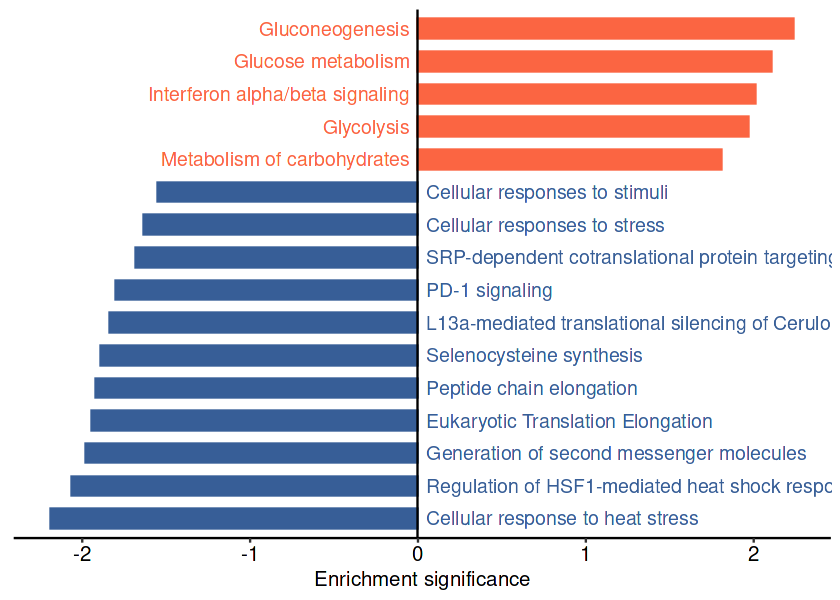

In [109]:
options(repr.plot.height = 5, repr.plot.width = 7)
p_Reactome

In [17]:
seurat_Myeloid

ERROR: Error in eval(expr, envir, enclos): object 'seurat_Myeloid' not found


##### 8.1.1 LGALS9 表达情况

In [127]:
unique(seurat_Myeloid$celltype_new_refined)

[1] "Mac_C1QC"    "Mac_SPP1"    "Mac_ISG15"   "Mast"        "Neutrophils"
 [6] "Mac_IL1B"    "cDC2"        "Mono_CD16"   "Mac_FN1"     "pDC"        
[11] "cDC1"        "Mono_CD14"   "cDC3"

In [209]:
seurat_Mac <- subset(seurat_Myeloid,subset=celltype_new_refined%in%c('Mac_C1QC','Mac_SPP1','Mac_ISG15','Mac_IL1B','Mac_FN1'))
seurat_Mac@meta.data$tissue <- factor(seurat_Mac@meta.data$tissue,levels=c('T','mLN'))

In [19]:
seurat_qc@meta.data$celltype_new_last <- factor(seurat_qc@meta.data$celltype_new_last,c('Endothelial','Fibroblast','non_malignant','malignant','Naive_T','NK',
                                                                                       'CD4_Ex','CD4_Treg','CD8_EFF','CD8_Ex','B',
                                                                                       'plasma_B','Macrophages','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Neutrophils','Mast'))

In [15]:
length(c('Endothelial','Fibroblast','non_malignant','malignant','Naive_T','NK',
                                                                                       'CD4_Ex','CD4_Treg','CD8_EFF','CD8_Ex','B',
                                                                                       'plasma_B','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Neutrophils','Mast'))

[1] 20

In [27]:
table(filter(seurat_qc@meta.data,cancer=='PTC'&tissue=='mLN')$sampleid)


GSM5585106 GSM5585109 GSM5585110 GSM5585114 GSM5585115 GSM5585116 GSM5585122 
      8820       9518      10346       5436       5909       7337       5681 
GSM5585123 
      5779 

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



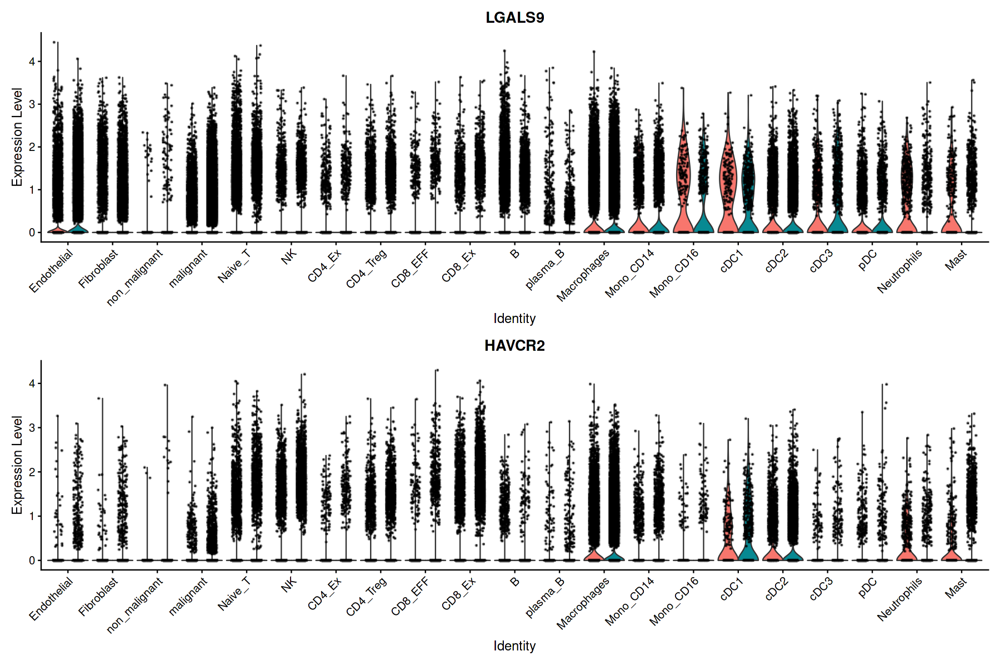

In [24]:
options(repr.plot.height = 10, repr.plot.width = 15)
VlnPlot(split.by = 'tissue',seurat_qc,c('LGALS9','HAVCR2'),group.by = 'celltype_new_last',ncol = 1)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



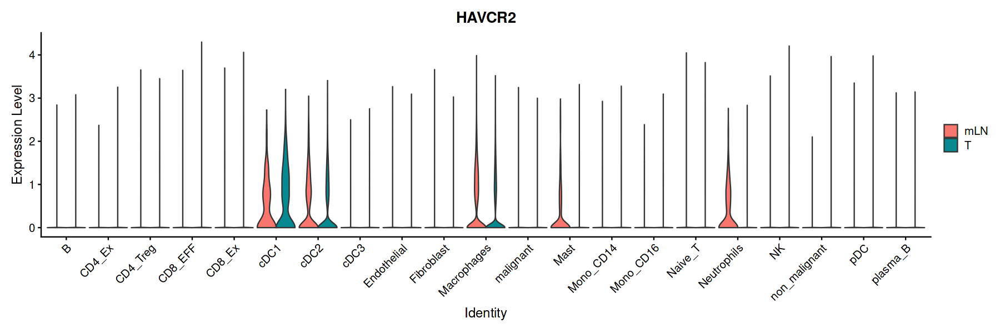

In [8]:
options(repr.plot.height = 5, repr.plot.width = 15)
VlnPlot(split.by = 'tissue',seurat_qc,'HAVCR2',group.by = 'celltype_new_last',pt.size = 0)

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



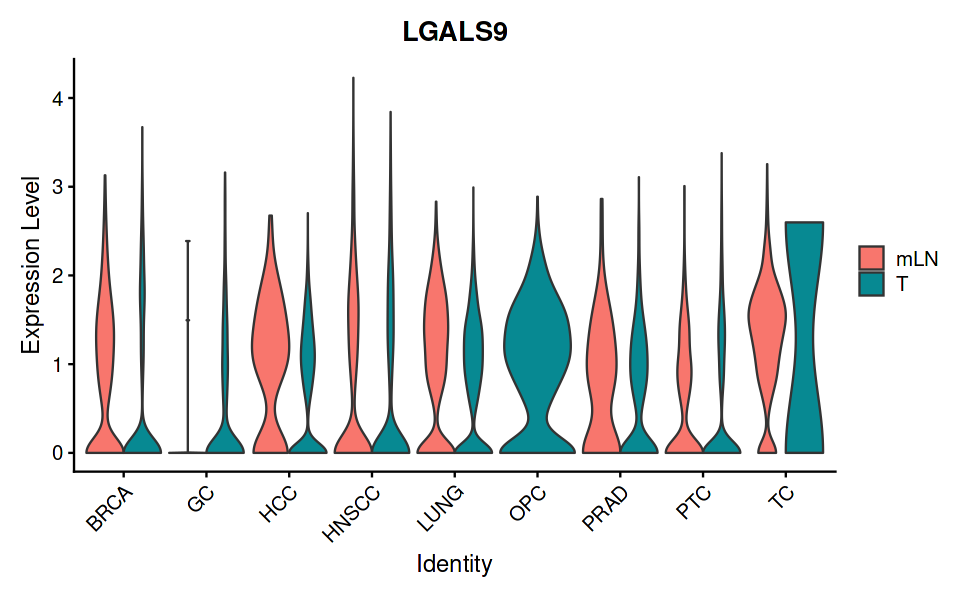

In [37]:
options(repr.plot.height = 5, repr.plot.width = 8)
VlnPlot(split.by = 'tissue',seurat_Mac,'LGALS9',group.by = 'cancer',pt.size = 0)

In [154]:
Idents(seurat_Mac) <- seurat_Mac@meta.data$tissue

In [156]:
seurat_Mac

An object of class Seurat 
49269 features across 26490 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [157]:
table(seurat_Mac@meta.data$tissue)


  mLN     T 
 7574 18916 

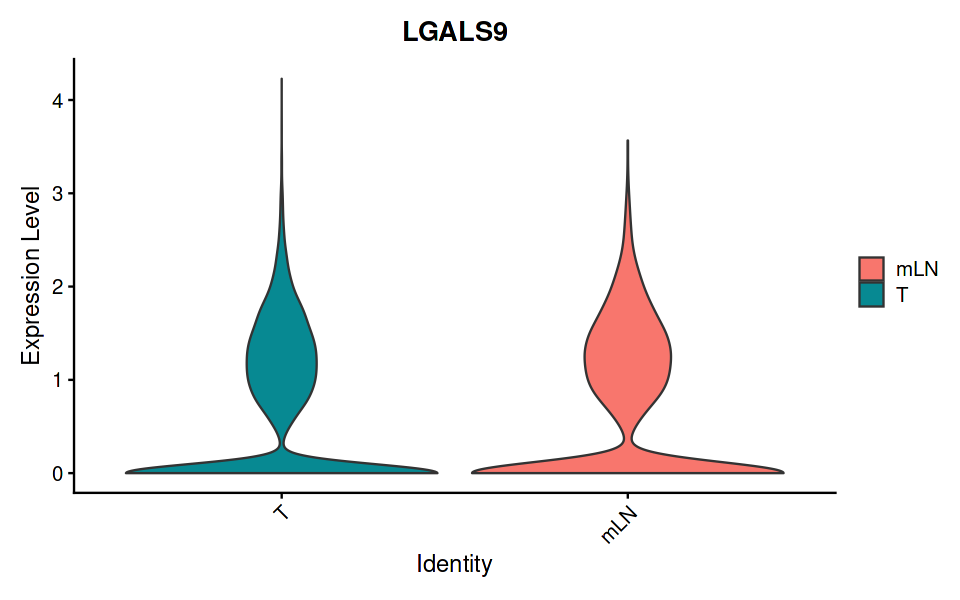

In [155]:
options(repr.plot.height = 5, repr.plot.width = 8)
VlnPlot(seurat_Mac,'LGALS9',pt.size = 0,split.by = 'tissue')

In [ ]:
df_test <- filter(df,p_val_adj<0.05)
diff_genes <- row.names(rbind.data.frame(top_n(df_test,n=15,wt= avg_log2FC),top_n(df_test,n=-15,wt= avg_log2FC)))
df$label <- row.names(df)
df$label[!(df$label %in% diff_genes )] <- NA
df$diff_percent <- df$`pct.1` - df$`pct.2`   
###展示差异基因
p_dot <- ggplot(df, aes(x = diff_percent, y = avg_log2FC, color = avg_log2FC)) + 
    geom_point(aes(size = avg_log2FC)) + 
    scale_size_continuous(range = c(0.2, 2)) + 
    # scale_color_gradientn(colors = rev(rbPal(50))) + 
    scale_color_distiller(palette = "RdBu") + 
    ggrepel::geom_text_repel(aes(label = label), color = "black", size = 3) +
    theme_classic() + 
    theme(panel.grid = element_blank(), axis.title = element_text(size = 15, color = "black"), 
          axis.text = element_text(size = 13, color = "black"), axis.ticks.length = unit(0.4, "lines"))
options(repr.plot.height = 8, repr.plot.width = 5)
p_dot 

#### 8.2 M1,M2打分

In [415]:
markers <- list()
markers$M1 <- c('IL23', 'TNF', 'CXCL9', 'CXCL10', 'CXCL11', 'CD86', 'IL1A', 'IL1B', 'IL6', 'CCL5', 'IRF5', 'IRF1', 'CD40', 'IDO1', 'KYNU', 'CCR7')
markers$M2 <- c('IL4R', 'CCL4', 'CCL13', 'CCL20', 'CCL17', 'CCL18', 'CCL22', 'CCL24', 
        'LYVE1', 'VEGFA', 'VEGFB', 'VEGFC', 'VEGFD', 'EGF', 'CTSA', 'CTSB', 'CTSC','CTSD', 'TGFB1', 'TGFB2', 'TGFB3', 
        'MMP14', 'MMP19', 'MMP9', 'CLEC7A', 'WNT7B', 'FASL', 'TNFSF12', 'TNFSF8', 'CD276', 'VTCN1', 'MSR1', 'FN1','IRF4')
markers$Phagocytosis <- c("MRC1", "CD163", "MERTK", "C1QB")
markers$Angiogenesis <- c('CCND2','CCNE1','CD44','CXCR4','E2F3','EDN1','EZH2','FGF18','FGFR1','FYN',
                 'HEY1','ITGAV','JAG1','JAG2','MMP9','NOTCH1','PDGFA','PTK2','SPP1','STC1','TNFAIP6','TYMP','VAV2','VCAN','VEGFA')

In [249]:
names(go_term)[grep(c('phagocytosis'),names(go_term))]

[1] "negative_regulation_of_phagocytosis"                                       
[2] "phagocytosis"                                                              
[3] "phagocytosis_recognition"                                                  
[4] "positive_regulation_of_phagocytosis"                                       
[5] "regulation_of_fc_gamma_receptor_signaling_pathway_involved_in_phagocytosis"
[6] "regulation_of_phagocytosis"

In [231]:
table(seurat_Myeloid$celltype_new_refined)


       Mast Neutrophils         pDC        cDC3        cDC2        cDC1 
       4071        1590        3297        1395        5682         622 
  Mono_CD16   Mono_CD14   Mac_HSPA6   Mac_INHBA    Mac_IL1B   Mac_ISG15 
        665        4339        1327        1725        1847        3498 
   Mac_SPP1    Mac_C1QC 
       2561       14434 

In [232]:
seurat_Mac <- subset(seurat_Myeloid,subset=celltype_new_refined%in%c('Mac_HSPA6','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_C1QC'))

In [ ]:
macro.cells.rankings <- AUCell_buildRankings(as.matrix(seurat_Mac@assays$RNA@data), nCores = 1) 
macro.cells.AUC <- AUCell_calcAUC(markers, macro.cells.rankings, aucMaxRank = nrow(macro.cells.rankings) * 0.1)
seurat_Mac$M1 <- as.numeric(getAUC(macro.cells.AUC)["M1", ])
seurat_Mac$M2 <- as.numeric(getAUC(macro.cells.AUC)["M2", ])
seurat_Mac$Phagocytosis <- as.numeric(getAUC(macro.cells.AUC)["Phagocytosis", ])
seurat_Mac$Angiogenesis <- as.numeric(getAUC(macro.cells.AUC)["Angiogenesis", ])

#serine.myeloid.data$Glycolysis <- as.numeric(getAUC(macro.cells.AUC)["Glycolysis", ])

In [651]:
seurat_Mac <- subset(seurat_Myeloid,subset=celltype_new_refined%in%c('Mac_HSPA6','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_C1QC'))

In [399]:
table(seurat_Mac@meta.data$celltype_new_refined)


   Mac_C1QC    Mac_SPP1   Mac_ISG15    Mac_IL1B   Mac_INHBA   Mac_HSPA6 
      14434        2561        3498        1847        1725        1327 
  Mono_CD14   Mono_CD16        cDC1        cDC2        cDC3         pDC 
          0           0           0           0           0           0 
Neutrophils        Mast 
          0           0 

In [653]:
seurat_Mac <- AddModuleScore(seurat_Mac,
                          features = markers,
                          #ctrl = 100,
                          name = names(markers)
                                )

Warning message:
“The following features are not present in the object: IL23, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: FASL, not searching for symbol synonyms”


In [656]:
colnames(seurat_Mac@meta.data)[30:33] <- names(markers)

In [655]:
dim(seurat_Mac@meta.data)

[1] 25392    33

In [449]:
metadata <- seurat_Mac@meta.data
tt.list <- split(metadata,metadata[,'celltype_new_refined'])[c('Mac_HSPA6','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_C1QC')]
names(tt.list)

[1] "Mac_HSPA6" "Mac_INHBA" "Mac_IL1B"  "Mac_ISG15" "Mac_SPP1"  "Mac_C1QC"

In [673]:
metadata <- seurat_Mac@meta.data
metadata$tissue <- factor(metadata$tissue,levels=c('T','mLN'))
tt.list <- split(metadata,metadata[,'celltype_new_refined'])[c('Mac_HSPA6','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_C1QC')]
tt <- lapply(tt.list,function(x){
tissue <- split(x,x[,'tissue'])
mean <- lapply(tissue,function(x1){
data_mean <- colMeans(x1[,names(markers)])
})
data_tissue <- do.call(cbind,mean)
})
heatmap.plot <- do.call(cbind,tt)

In [469]:
names(markers)

[1] "M1"           "M2"           "Phagocytosis" "Angiogenesis"

In [665]:
#seurat_Mac_test <- subset(seurat_Mac,downsample = 2000)####下取样画热图
metadata <- seurat_Mac@meta.data
metadata$tissue <- factor(metadata$tissue,levels=c('T','mLN'))
tt.list <- split(metadata,metadata[,'celltype_new_refined'])[c('Mac_C1QC','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_HSPA6')]
names(tt.list)
tt <- lapply(tt.list,function(x){
tissue <- split(x,x[,'tissue'])
mean <- lapply(tissue,function(x1){
data_mean <- colMeans(x1[,names(markers)])
})
last <- do.call(cbind,mean)
})
heatmap.plot <- do.call(cbind,tt)

[1] "Mac_C1QC"  "Mac_INHBA" "Mac_IL1B"  "Mac_ISG15" "Mac_SPP1"  "Mac_HSPA6"

In [666]:
dim(heatmap.plot)

[1]  4 12

In [668]:
names(tt)

[1] "Mac_C1QC"  "Mac_INHBA" "Mac_IL1B"  "Mac_ISG15" "Mac_SPP1"  "Mac_HSPA6"

In [ ]:
data_tissue <- do.call(cbind,mean)
})

In [541]:
names(markers)

[1] "M1"           "M2"           "Phagocytosis" "Angiogenesis"

In [ ]:
options(repr.plot.height = 5, repr.plot.width = 20)
my_comparisons <- list( c("T", "mLN"))
seurat_Mac@meta.data$tissue <- factor(seurat_Mac@meta.data$tissue,levels=c('T','mLN'))
seurat <- subset(seurat_Mac,subset=celltype_new_refined%in%'Mac_IL1B')
ggarrange(
VlnPlot(seurat, features = 'M1', pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 1),
    VlnPlot(seurat, features = 'M2', pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 1),
    VlnPlot(seurat, features ='Phagocytosis', pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 4),
    VlnPlot(seurat, features = 'Angiogenesis', pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 1)
,ncol=4
)

In [ ]:
VlnPlot(seurat, features = names(markers), pt.size = 0,group.by='tissue') +
  NoLegend() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 0.75)

In [669]:
colnames(heatmap.plot)

[1] "T"   "mLN" "T"   "mLN" "T"   "mLN" "T"   "mLN" "T"   "mLN" "T"   "mLN"

In [670]:
column_ha <- HeatmapAnnotation(
  celltype = rep(names(tt),each = 2), 
  tissue = colnames(heatmap.plot),
  col = list(
  celltype=c('Mac_C1QC'='#5050FFFF',
             'Mac_SPP1'='#CE3D32FF',
             'Mac_ISG15'='#749B58FF',
             'Mac_IL1B'='#F0E685FF',
             'Mac_INHBA'='#466983FF',
             'Mac_HSPA6'='#BA6338FF'
             ),
      tissue=c('T'='#1F77B4FF','mLN'='#FF7F0EFF')
  )
        
  )

In [675]:
col_fun <- colorRamp2(
  c(0,0.5,1), 
  c("#5077ad",'#f7f4c3', "#c93128")
  )

null device 
          1

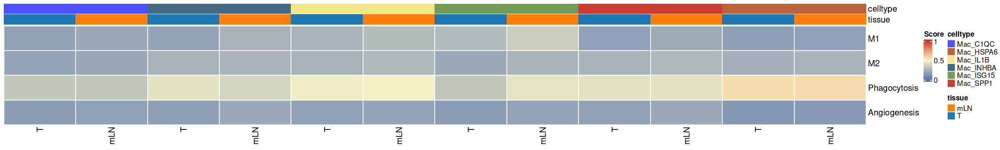

In [676]:
options(repr.plot.height = 3, repr.plot.width = 20)
#pdf('/home/zhouyao/pancancer/figure/heatmap_antigen.pdf',width = 20,height = 3)
Heatmap(as.matrix(heatmap.plot),cluster_rows = F,cluster_columns = F,col = col_fun,name = 'Score',
        rect_gp = gpar(col = "white", lwd = 1),###添加白线分割
       show_column_names=T,
        #column_names_side  = "top",
       top_annotation = column_ha,
       #column_names_rot=0
       )
dev.off()

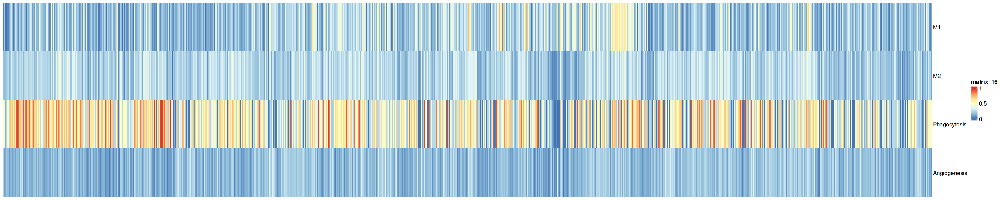

In [534]:
options(repr.plot.height = 5, repr.plot.width = 25)
pheatmap(as.matrix(heatmap.plot), cluster_rows = F,cluster_cols = F,show_colnames = F
        #rect_gp = gpar(col = "white", lwd = 1),###添加白线分割
       #show_column_names=F,
        #column_names_side  = "top",
        #row_title_side = 'right',
       #column_names_rot=0
       )

#### 8.3 Roe分析

In [83]:
Roe <- function(metadata,goal){ 
tt.list <- split(metadata,metadata[,goal])
tt <- lapply(tt.list,function(x){
     a <- table(factor(x[,'tissue'],levels = c('T','mLN')))
     b <- table(factor(metadata[setdiff(row.names(metadata),row.names(x)),][,'tissue'],levels = c('T','mLN')))
       c <- as.matrix(rbind.data.frame(a,b))
       colnames(c) <- c('T','mLN')
      i <- as.character(unique(x$celltype_new_refined))
       rownames(c) <- c(i,'non_celltype')
       chisq.temp <- chisq.test(c)
#chisq.temp <- chisq.test(table(factor(x[,'tissue'],levels = c('T','mLN')),factor(metadata[setdiff(row.names(metadata),row.names(x)),],levels = c('T','mLN'))))
    roe <- as.matrix(chisq.temp$observed/chisq.temp$expected)[i,]
    if(any(is.nan(roe))){
      roe[is.nan(roe)] <- 0 
    }
    roe
  })
  heatmap.plot <- t(do.call(cbind,tt))
  return(heatmap.plot)
}
  #p3 <- pheatmap(t(heatmap.plot),cluster_rows = F,cluster_cols = F,display_numbers = T,filename = paste0(file.path(outdir,name),"_roe_heatmap.pdf"))

In [84]:
heatmap.plot <- Roe(metadata <- seurat_Myeloid@meta.data ,goal='celltype_new_refined')

In [85]:
heatmap.plot

,T,mLN
cDC1,0.9915434,1.0196232
cDC2,1.0212086,0.9507866
cDC3,0.6944473,1.7090193
Mac_C1QC,1.0672156,0.8440297
Mac_FN1,1.0418984,0.9027770
Mac_IL1B,1.0396178,0.9080689
Mac_ISG15,0.8860607,1.2643903
Mac_SPP1,1.0139929,0.9675302
Mast,1.2882427,0.3311476
Mono_CD14,1.0012371,0.9971293


In [86]:
col_fun <- colorRamp2(
  c(0, 2), 
  c("#f8f3b3", "#d21e1a")
  )

In [89]:
pdf('/home/zhouyao/pancancer/figure/roe_Myeloid.pdf',width = 3,height = 4)
options(repr.plot.height = 5, repr.plot.width = 3)
Heatmap(heatmap.plot,cluster_rows = F,cluster_columns = F,col = col_fun,name = 'Ro/e',
        rect_gp = gpar(col = "white", lwd = 1),###添加白线分割
        column_names_side  = "top",
        row_title_side = 'right',
       column_names_rot=0
       )
dev.off()
dev.off()

png 
  2

null device 
          1

#### 8.3 探究组织来源差异signature

##### 8.3.1 随即取样

In [77]:
cells <- c()
last <- floor(10000*(table(seurat_Myeloid@meta.data$celltype_new_refined_last)/sum(table(seurat_Myeloid@meta.data$celltype_new_refined_last))))
for(i in unique(seurat_Myeloid$celltype_new_refined_last)){
    a <- filter(seurat_Myeloid@meta.data,celltype_new_refined_last==i)
    b <- as.data.frame(table(a$tissue)/sum(table(a$tissue)))
    row.names(b) <- b$Var1
    num <- last[i]
    mLN <- floor(num*b['mLN',2])
    T <- num-mLN
    c <- filter(seurat_Myeloid@meta.data,celltype_new_refined_last==i&tissue=='mLN')
    c1 <- ceiling(mLN*(table(c$cancer)/sum(table(c$cancer))))
    for(j in names(c1)){
    cells <- c(cells,sample(row.names(filter(seurat_Myeloid@meta.data,celltype_new_refined_last==i&tissue=='mLN'&cancer==j)),c1[j],replace = F))
    }
    d <- filter(seurat_Myeloid@meta.data,celltype_new_refined_last==i&tissue=='T')
    d1 <- ceiling(T*(table(d$cancer)/sum(table(d$cancer))))
    for(j in names(d1)){
    cells <- c(cells,sample(row.names(filter(seurat_Myeloid@meta.data,celltype_new_refined_last==i&tissue=='T'&cancer==j)),d1[j],replace = F))
    }
}

In [80]:
seurat_Myeloid_test <- subset(seurat_Myeloid,cells=cells)

In [94]:
seurat_Myeloid_test

An object of class Seurat 
49269 features across 10081 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

##### 8.3.2 细胞重新排序

In [145]:
cells_reorder <- c()
for(i in c('M1','M2','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Neutrophils','Mast')){
 cell_1 <- row.names(filter(seurat_Myeloid_test@meta.data,celltype_new_refined_last==i&tissue=='T'))
 cell_2 <- row.names(filter(seurat_Myeloid_test@meta.data,celltype_new_refined_last==i&tissue=='mLN'))
 cell <- c(cell_1,cell_2)
 cells_reorder <- c(cells_reorder,cell)
}

In [146]:
length(cells_reorder)

[1] 10081

In [95]:
table(seurat_Myeloid_test$celltype_new_refined_last)


       cDC1        cDC2        cDC3          M1          M2        Mast 
        138        1189         296        1520        3999         854 
  Mono_CD14   Mono_CD16 Neutrophils         pDC 
        912         144         338         691 

In [97]:
length(cells_reorder)

[1] 10081

In [81]:
seurat_Myeloid_test

An object of class Seurat 
49269 features across 10081 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [29]:
i <- 'M2'

In [28]:
 unique(seurat_Myeloid$celltype_new_refined_last)

[1] "M2"          "M1"          "Mast"        "Neutrophils" "cDC2"       
 [6] "Mono_CD16"   "pDC"         "cDC1"        "Mono_CD14"   "cDC3"

In [566]:
markers_antigen <- list()

markers_antigen$Antigen_processing_and_presentation <- unique(go_term$antigen_processing_and_presentation)

markers_antigen$Antigen_processing_and_presentation_of_endogenous_antigen<- 
unique(go_term$antigen_processing_and_presentation_of_endogenous_antigen)

markers_antigen$Antigen_processing_and_presentation_of_exogenous_peptide_antigen_via_MHC_class_II<- 
unique(go_term$antigen_processing_and_presentation_of_exogenous_peptide_antigen_via_mhc_class_ii)

markers_antigen$Peptide_antigen_assembly_with_MHC_class_II_protein_complex<- 
unique(go_term$peptide_antigen_assembly_with_mhc_class_ii_protein_complex)

markers_antigen$Antigen_processing_and_presentation_of_peptide_or_polysaccharide_antigen_via_MHC_class_II<-
unique(go_term$antigen_processing_and_presentation_of_peptide_or_polysaccharide_antigen_via_mhc_class_ii)

In [567]:
names(markers_antigen)

[1] "Antigen_processing_and_presentation"                                                      
[2] "Antigen_processing_and_presentation_of_endogenous_antigen"                                
[3] "Antigen_processing_and_presentation_of_exogenous_peptide_antigen_via_MHC_class_II"        
[4] "Peptide_antigen_assembly_with_MHC_class_II_protein_complex"                               
[5] "Antigen_processing_and_presentation_of_peptide_or_polysaccharide_antigen_via_MHC_class_II"

##### 8.3.3 AddModuleScore 打分

In [7]:
load('/home/zhouyao/pancancer/data/immune_signature.RData')
load('/home/zhouyao/pancancer/data/immport.RData')

In [128]:
seurat_Myeloid_test <- AddModuleScore(
                          seurat_Myeloid_test,
                          features = immport,
                          name = names(immport)
                                )

In [130]:
dim(seurat_Myeloid_test@meta.data)

[1] 10081  4917

##### 8.3.4 aucell score打分

In [ ]:
macro.cells.rankings <- AUCell_buildRankings(as.matrix(seurat_Myeloid@assays$RNA@data), nCores = 1) 
macro.cells.AUC <- AUCell_calcAUC(markers_antigen, macro.cells.rankings, aucMaxRank = nrow(macro.cells.rankings) * 0.1)
seurat_Myeloid$Antigen_processing_and_presentation <- as.numeric(getAUC(macro.cells.AUC)["Antigen_processing_and_presentation", ])
seurat_Myeloid$Antigen_processing_and_presentation_of_endogenous_antigen <- as.numeric(getAUC(macro.cells.AUC)["Antigen_processing_and_presentation_of_endogenous_antigen", ])
seurat_Myeloid$Antigen_processing_and_presentation_of_exogenous_peptide_antigen_via_MHC_class_II <- as.numeric(getAUC(macro.cells.AUC)["Antigen_processing_and_presentation_of_exogenous_peptide_antigen_via_MHC_class_II", ])
seurat_Myeloid$Peptide_antigen_assembly_with_MHC_class_II_protein_complex <- as.numeric(getAUC(macro.cells.AUC)["Peptide_antigen_assembly_with_MHC_class_II_protein_complex", ])
seurat_Myeloid$Antigen_processing_and_presentation_of_peptide_or_polysaccharide_antigen_via_MHC_class_II <- as.numeric(getAUC(macro.cells.AUC)["Antigen_processing_and_presentation_of_peptide_or_polysaccharide_antigen_via_MHC_class_II", ])

#serine.myeloid.data$Glycolysis <- as.numeric(getAUC(macro.cells.AUC)["Glycolysis", ])

In [571]:
unique(seurat_Myeloid$celltype_new_refined)

[1] Mac_C1QC    Mac_ISG15   Mast        Mac_SPP1    Mac_HSPA6   Neutrophils
 [7] Mac_IL1B    cDC2        Mono_CD16   Mac_INHBA   pDC         cDC1       
[13] Mono_CD14   cDC3       
14 Levels: Mac_C1QC Mac_SPP1 Mac_ISG15 Mac_IL1B Mac_INHBA ... Mast

#### 8.4 热图展示免疫signature

In [134]:
class(seurat_Myeloid_test@meta.data)

[1] "data.frame"

In [167]:
dim(seurat_Myeloid@meta.data)

[1] 48151    28

In [168]:
heatmap_data <- t(seurat_Myeloid_test@meta.data[cells_reorder,29:4900])
row.names(heatmap_data) <- gsub('.{1}$', '', row.names(heatmap_data))####去掉最后一个字符

In [169]:
heatmap_data <- scale(heatmap_data)
heatmap_data

,GSM1909309_GGGTTGCAGATGCCTT-1,GSM1909309_GTTACAGGTTCCAACA-1,GSM5457202_CCAGCTTACTTT,GSM5457202_AACGTTGCATGT,GSM5457202_ATTGGGACAATT,GSM1909313_GCACATAAGACAGACC-1,GSM1909313_TTGACTTCACCCATGG-1,CCCAACTCATGGCGCT-T7,AATGCCAGTGGAAATT-T7,TCGAACATCGGAGTGA-T7,⋯,GSM5585110_CACACTCGTGAGTATA-1,GSM5585123_AAAGTGATCCCGAGTG-1,GSM5585106_GAGTCCGCACGCGAAA-1,GSM5585123_CGTGATATCGCACTCT-1,GSM5930043_CTACTATGTATGGAAT-1,GSM5930043_ATTCCTAGTGACCGAA-1,GSM5930044_ATGCGATAGTGGGAAA-1,GSM5930043_CATTGAGAGGGAGGCA-1,GSM5930044_ATACCGACACCGTCGA-1,GSM5930043_TACCCACCAAGACTGG-1
KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_UP,0.53079410,0.87677848,-0.21990128,0.37313278,0.58452069,1.04823440,2.19598802,1.35206883,0.34320225,1.16486381,⋯,1.80055419,0.26691555,2.03258860,0.49534748,-0.096701963,0.26790087,0.027777768,0.17657432,0.85203304,-0.02018766
KAECH_NAIVE_VS_DAY8_EFF_CD8_TCELL_DN,2.71984633,2.53092367,2.16133759,1.74018368,1.14375173,-0.13477155,0.28990052,2.77091072,2.94562600,3.27761620,⋯,1.62557033,3.62586226,0.86597862,4.16302309,2.114177316,1.86862068,2.699887364,2.58177520,1.24296683,2.30315207
KAECH_NAIVE_VS_DAY15_EFF_CD8_TCELL_UP,1.16278905,1.06838081,0.63758559,-0.05430181,-0.09241035,1.66121843,0.58964497,1.00288666,0.04250711,1.61655701,⋯,0.99701204,0.38924785,0.95126800,0.70403468,0.048420657,0.06745195,0.490758149,0.63828201,0.54826222,0.20768282
KAECH_NAIVE_VS_DAY15_EFF_CD8_TCELL_DN,3.22874856,2.80049287,1.96069096,2.82156982,1.47497035,0.57780157,-0.18659355,2.38998787,2.70699566,2.63373432,⋯,1.37945548,2.59164987,0.52958185,2.30222435,2.540171682,1.96764307,2.736730132,2.56109235,2.14295144,2.80646235
KAECH_NAIVE_VS_MEMORY_CD8_TCELL_UP,-0.46963566,0.60907778,-0.73721431,-0.01295246,-0.27897458,0.37979548,-0.67233858,0.16832966,-0.40663334,0.29495400,⋯,-0.06878095,0.11630580,0.19168351,0.09517021,-0.364273996,-0.34463177,-0.481064287,0.08978895,0.14278842,0.20846513
KAECH_NAIVE_VS_MEMORY_CD8_TCELL_DN,2.37131095,1.98910985,2.30998003,2.19266002,1.41943981,0.43825681,0.54350276,2.24189929,3.06608787,2.38283072,⋯,1.09251286,2.73570995,0.80253115,1.99736965,2.106701160,1.37449346,2.123299476,1.44622860,2.02151060,1.89383461
KAECH_DAY8_EFF_VS_DAY15_EFF_CD8_TCELL_UP,0.45827856,1.47225325,1.71599658,1.58769603,-0.05342047,0.55969769,-0.26913358,0.84221242,1.77358050,1.71662490,⋯,1.93920709,2.83870954,0.75256564,3.58724888,1.442746170,1.71180578,2.301786753,2.73187512,1.12637825,2.17927915
KAECH_DAY8_EFF_VS_DAY15_EFF_CD8_TCELL_DN,0.05081480,0.42108565,-0.51564785,-0.35424814,-0.11184097,0.53222659,1.25493370,0.46921298,0.36652947,0.31824939,⋯,0.67685592,0.12146540,1.31701501,0.41158982,-0.078259561,-0.18340826,0.144923210,0.15018136,0.12423976,-0.18676372
KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_UP,1.62837693,0.97735911,1.50890655,0.84464509,0.31731073,0.08272146,-0.33479110,1.28855380,1.64596504,1.83219894,⋯,1.29091572,2.80519004,0.76297760,3.58252716,1.252464173,1.45595203,2.043317365,2.03347279,0.63248765,1.54823014
KAECH_DAY8_EFF_VS_MEMORY_CD8_TCELL_DN1,2.19154086,2.37754518,1.99385884,0.87599437,0.92895213,3.95633485,4.67158568,2.21576248,2.56934942,2.42529602,⋯,3.13983937,3.80118531,3.68218590,3.08732995,1.563397724,0.79101451,1.484466747,1.87195268,1.77447537,1.46321847


In [132]:
names(immport)

[1] "Antigen_Processing_and_Presentation" "Antimicrobials"                     
 [3] "BCRSignalingPathway"                 "Chemokines"                         
 [5] "Chemokine_Receptors"                 "Cytokines"                          
 [7] "Cytokine_Receptors"                  "Interferons"                        
 [9] "Interferon_Receptor"                 "Interleukins"                       
[11] "Interleukins_Receptor"               "NaturalKiller_Cell_Cytotoxicity"    
[13] "TCRsignalingPathway"                 "TGFb_Family_Member"                 
[15] "TGFb_Family_Member_Receptor"         "TNF_Family_Members"                 
[17] "TNF_Family_Members_Receptors"

In [ ]:
dim(heatmap_data)

In [615]:
#seurat_Mac_test <- subset(seurat_Mac,downsample = 2000)####下取样画热图
####计算均值
metadata <- seurat_Myeloid_test@meta.data[cells_reorder,]
metadata$tissue <- factor(metadata$tissue,levels=c('T','mLN'))
tt.list <- split(metadata,metadata[,'celltype_new_refined'])#[c('Mac_C1QC','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_HSPA6')]
names(tt.list)
tt <- lapply(tt.list,function(x){
tissue <- split(x,x[,'tissue'])
mean <- lapply(tissue,function(x1){
data_mean <- colMeans(x1[,names(markers_antigen)])
})
last <- do.call(cbind,mean)
})
heatmap.plot <- do.call(cbind,tt)

[1] "Mac_C1QC"    "Mac_SPP1"    "Mac_ISG15"   "Mac_IL1B"    "Mac_INHBA"  
 [6] "Mac_HSPA6"   "Mono_CD14"   "Mono_CD16"   "cDC1"        "cDC2"       
[11] "cDC3"        "pDC"         "Neutrophils" "Mast"

In [ ]:
#seurat_Mac_test <- subset(seurat_Mac,downsample = 2000)####下取样画热图
metadata <- seurat_Myeloid_test@meta.data[cells_reorder,]
metadata$tissue <- factor(metadata$tissue,levels=c('T','mLN'))
tt.list <- split(metadata,metadata[,'celltype_new_refined_last'])#[c('Mac_C1QC','Mac_INHBA','Mac_IL1B','Mac_ISG15','Mac_SPP1','Mac_HSPA6')]
names(tt.list)
tt <- lapply(tt.list,function(x){
tissue <- split(x,x[,'tissue'])
mean <- lapply(tissue,function(x1){
data_mean <- colMeans(x1[,names(markers_antigen)])
})
last <- do.call(cbind,mean)
})
heatmap.plot <- do.call(cbind,tt)

In [589]:
dim(heatmap.plot)

[1]  5 28

In [631]:
rep(names(tt),each = 2)

[1] "Mac_C1QC"    "Mac_C1QC"    "Mac_SPP1"    "Mac_SPP1"    "Mac_ISG15"  
 [6] "Mac_ISG15"   "Mac_IL1B"    "Mac_IL1B"    "Mac_INHBA"   "Mac_INHBA"  
[11] "Mac_HSPA6"   "Mac_HSPA6"   "Mono_CD14"   "Mono_CD14"   "Mono_CD16"  
[16] "Mono_CD16"   "cDC1"        "cDC1"        "cDC2"        "cDC2"       
[21] "cDC3"        "cDC3"        "pDC"         "pDC"         "Neutrophils"
[26] "Neutrophils" "Mast"        "Mast"

In [638]:
mye_color

Mac_C1QC    Mac_SPP1   Mac_ISG15    Mac_IL1B   Mac_INHBA   Mac_HSPA6 
"#5050FFFF" "#CE3D32FF" "#749B58FF" "#F0E685FF" "#466983FF" "#BA6338FF" 
  Mono_CD14   Mono_CD16        cDC1        cDC2        cDC3         pDC 
"#5DB1DDFF" "#802268FF" "#6BD76BFF" "#D595A7FF" "#924822FF" "#837B8DFF" 
Neutrophils        Mast 
"#C75127FF" "#D58F5CFF"

In [152]:
table(seurat_Myeloid_test@meta.data$celltype_new_refined_last)


       cDC1        cDC2        cDC3          M1          M2        Mast 
        138        1189         296        1520        3999         854 
  Mono_CD14   Mono_CD16 Neutrophils         pDC 
        912         144         338         691 

In [154]:
head(seurat_Myeloid_test@meta.data[cells_reorder,'tissue'])

[1] "T" "T" "T" "T" "T" "T"

In [156]:

column_ha <- HeatmapAnnotation(
  #celltype = rep(names(tt),each = 2), 
  #tissue = colnames(heatmap.plot),
    celltype = seurat_Myeloid_test@meta.data[cells_reorder,'celltype_new_refined_last'],
    tissue=seurat_Myeloid_test@meta.data[cells_reorder,'tissue'],
  col = list(
  celltype=c(
              'M1'= '#5050FFFF',
              'M2'= '#CE3D32FF',
             #'Mac_C1QC'='#5050FFFF',
             #'Mac_SPP1'='#CE3D32FF',
             #'Mac_ISG15'='#749B58FF',
             #'Mac_IL1B'='#F0E685FF',
             #'Mac_INHBA'='#466983FF',
             #'Mac_HSPA6'='#BA6338FF',
             'Mono_CD14'='#5DB1DDFF',
             'Mono_CD16'='#802268FF',
             'cDC1'='#6BD76BFF',
             'cDC2'='#D595A7FF',
             'cDC3'='#924822FF',
             'pDC'='#837B8DFF',
             'Neutrophils'='#C75127FF',
             'Mast'='#D58F5CFF'),
      tissue=c('T'='#1F77B4FF','mLN'='#FF7F0EFF')
  )
        
  )
col_fun <- colorRamp2(
  c(-2,0, 2), 
  c("#5077ad",'white', "#c93128")
  )

In [160]:
col_fun <- colorRamp2(
  c(-2,0, 2), 
  c("#5077ad",'white', "#c93128")
  )

In [ ]:
options(repr.plot.height = 20, repr.plot.width = 20)
#pdf('/home/zhouyao/pancancer/figure/heatmap_antigen.pdf',width = 20,height = 3)
Heatmap(as.matrix(heatmap_data),cluster_rows = F,cluster_columns = F,col = col_fun,name = 'Score',
       # rect_gp = gpar(col = "white", lwd = 1),###添加白线分割
       show_column_names=F,
        
        #column_names_side  = "top",
       top_annotation = column_ha,
       #column_names_rot=0
       )
#dev.off()

In [649]:
dev.off()

null device 
          1

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
“Removed 300 rows containing non-finite values (`stat_ydensity()`).”
Warning message:
“Removed 300 rows containing non-finite values (`stat_signif()`).”
Warning message:
“Removed 3 rows containing missing values (`geom_signif()`).”


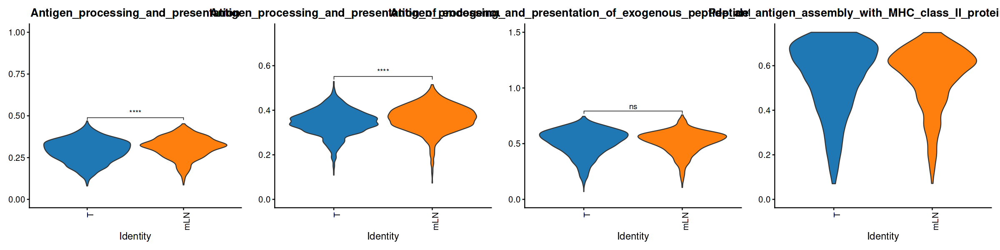

In [594]:
options(repr.plot.height = 5, repr.plot.width = 20)
my_comparisons <- list( c("T", "mLN"))
seurat_Myeloid@meta.data$tissue <- factor(seurat_Myeloid@meta.data$tissue,levels=c('T','mLN'))
seurat <- subset(seurat_Myeloid,subset=celltype_new_refined%in%'Mac_SPP1')
ggarrange(
VlnPlot(seurat, features = names(markers_antigen)[1], pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 1),
    VlnPlot(seurat, features = names(markers_antigen)[2], pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 0.75),
    VlnPlot(seurat, features =names(markers_antigen)[3], pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 1.5),
    VlnPlot(seurat, features = names(markers_antigen)[4], pt.size = 0,group.by='tissue') +
  NoLegend() + scale_fill_d3()+
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
  ylim(0, 0.75)
,ncol=4
)

#### 8.5 探究癌基因差异表达情况

In [75]:
seurat_malignant <- readRDS('/home/zhouyao/pancancer/data/seurat_malignant.Rds')

In [83]:
seurat_Mac <- readRDS('/home/zhouyao/pancancer/data/seurat_Mac_new.Rds')
seurat_M2 <- subset(seurat_Mac,celltype_new_refined_last_test=='M2')
seurat_M2

An object of class Seurat 
49269 features across 25417 samples within 2 assays 
Active assay: RNA (47269 features, 2000 variable features)
 1 other assay present: integrated
 4 dimensional reductions calculated: pca, harmony, umap, tsne

In [75]:
#malignant <- apply(seurat_malignant@assays$RNA@counts, 2, function(x) (x/sum(x))*10000)
#malignant <- seurat_M2_new@assays$RNA@data

#seurat <- subset(seurat_M2_new,cancer=='PRAD')
malignant <-GetAssayData(seurat_M2_new, slot = "data")
dim(malignant)
malignant[1:6,1:6]

[1] 47269 21977

6 x 6 sparse Matrix of class "dgCMatrix"
         GSM1909307_AAACGGGCATGGTCAT-1 GSM1909307_AAAGCAACAGGTTTCA-1
UQCR10                        2.879312                      .       
SPP1                          6.676447                      3.397916
HLA-DPB1                      1.335089                      .       
MT-RNR2                       .                             .       
RPS29                         2.501546                      2.737665
B2M                           4.566548                      4.473981
         GSM1909307_AAAGTAGAGCTACCGC-1 GSM1909307_AACACGTGTAAGTAGT-1
UQCR10                        2.152293                      .       
SPP1                          6.056446                      .       
HLA-DPB1                      2.152293                      3.654318
MT-RNR2                       .                             .       
RPS29                         3.170261                      3.654318
B2M                           4.438527                      4.

In [ ]:
seurat_qc@meta.data$celltype_new_last <- factor(seurat_qc@meta.data$celltype_new_last,c('Endothelial','Fibroblast','non_malignant','malignant','Naive_T','NK',
                                                                                       'CD4_Ex','CD4_Treg','CD8_EFF','CD8_Ex','B',
                                                                                       'plasma_B','Macrophages','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Neutrophils','Mast'))

In [80]:
data <- as.data.frame(t(as.matrix(malignant[c('LGALS9','HAVCR2','CLEC7A','CD44','CTLA4','LAG3','PDCD1','BTLA','CD274','TIGIT'),])))
#head(as.data.frame(malignant['MRC2',]))
#colnames(data) <- 'exp'

data$tissue <- factor(seurat_M2_new@meta.data[rownames(data),'tissue'],levels=c('T','mLN'))
#data$celltype_new_last <- factor(seurat_qc@meta.data[rownames(data),'celltype_new_last'],levels=c('Endothelial','Fibroblast','non_malignant','malignant','Naive_T','NK',
 #                                                                                      'CD4_Ex','CD4_Treg','CD8_EFF','CD8_Ex','B',
  #                                                                                     'plasma_B','Macrophages','Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3','pDC','Neutrophils','Mast'))
tail(data)

,LGALS9,HAVCR2,CLEC7A,CD44,CTLA4,LAG3,PDCD1,BTLA,CD274,TIGIT,tissue
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
GSM5457213_TCTGGCCCGACA,1.915344,1.074919,1.915344,0.000000,0,0,0,0,0,0.000000,mLN
GSM5457213_CGAAACTATTCT,1.349081,0.000000,2.257760,1.349081,0,0,0,0,0,0.000000,mLN
GSM5457213_CCCCCCCCTTGG,2.111048,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,mLN
GSM5457213_CGCCGGGATTGT,1.484284,0.000000,0.000000,0.000000,0,0,0,0,0,1.484284,mLN
GSM5457213_CCCCCCCCCTTG,2.203650,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,mLN
GSM5457213_CGCGACCGTCGC,2.320694,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,mLN


In [81]:
data_test <- c()
for(i in c('LGALS9','HAVCR2','CLEC7A','CD44','CTLA4','LAG3','PDCD1','BTLA','CD274','TIGIT')){

d <- data.frame(gene=i,tissue=data$tissue,value=data[,i])
data_test <- rbind.data.frame(data_test,d)
}

In [47]:
data_test

gene,tissue,value
<chr>,<fct>,<dbl>
LGALS9,T,0.000000
LGALS9,T,0.000000
LGALS9,T,2.152293
LGALS9,T,0.000000
LGALS9,T,2.240317
LGALS9,T,0.000000
LGALS9,T,0.000000
LGALS9,T,2.998110
LGALS9,T,0.000000


# 条形图

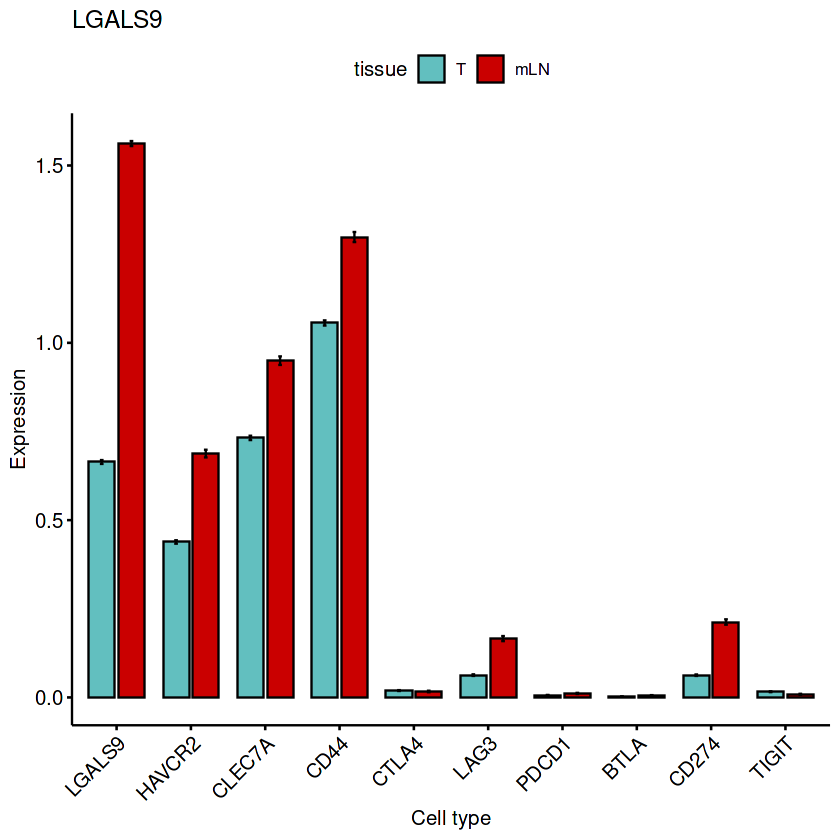

In [82]:
ggbarplot(data_test, x = "gene", y='value', add="mean_se",fill="tissue",  position=position_dodge(0.8),
          palette = c("#62BFBF", "#ca0000")) +
  xlab("Cell type") +
  ylab("Expression") +
  ggtitle('LGALS9') +
#ylim(0, 0.2)+
  theme(axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1))# +
  #guides(fill = F)

In [39]:
data$HAVCR2 <- log2(data$HAVCR2+1)
data$LGALS9 <- log2(data$LGALS9+1)

In [59]:
data$HAVCR2 <- (data$HAVCR2/sum(data$HAVCR2))*10000
data$LGALS9 <- (data$LGALS9/sum(data$LGALS9))*10000

In [60]:
head(data)

,LGALS9,HAVCR2,tissue,celltype_new_last
,<dbl>,<dbl>,<fct>,<fct>
GSM1909307_AAACCTGAGATGGGTC-1,0.00000000,0,T,malignant
GSM1909307_AAACCTGAGTCTTGCA-1,0.07532389,0,T,malignant
GSM1909307_AAACCTGCATCACGAT-1,0.00000000,0,T,malignant
GSM1909307_AAACCTGGTCATCCCT-1,0.07532389,0,T,malignant
GSM1909307_AAACCTGGTGCAGACA-1,0.07532389,0,T,malignant
GSM1909307_AAACCTGTCGCAGGCT-1,0.00000000,0,T,malignant


Warning message:
“Removed 1 rows containing non-finite values (`stat_boxplot()`).”


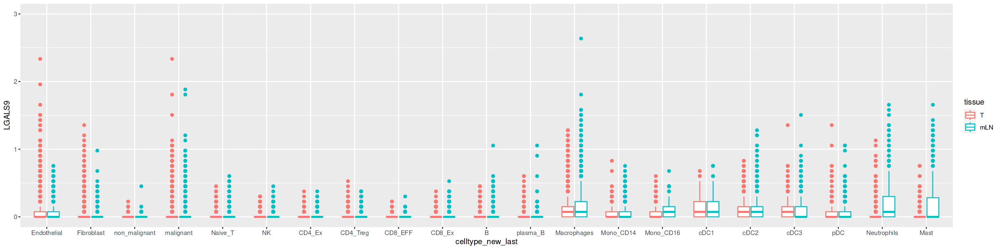

In [63]:
options(repr.plot.height = 5, repr.plot.width = 20)
ggplot(data, aes(x=celltype_new_last, y=LGALS9,color=tissue)) +
  geom_boxplot(width=0.6,aes(color=tissue))+
 ylim(0,3)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message:
“Computation failed in `stat_signif()`
Caused by error in `if (scales$x$map(comp[1]) == data$group[1] | manual) ...`:
! missing value where TRUE/FALSE needed”
Warning message:
“Removed 1614 rows containing missing values (`geom_violin()`).”


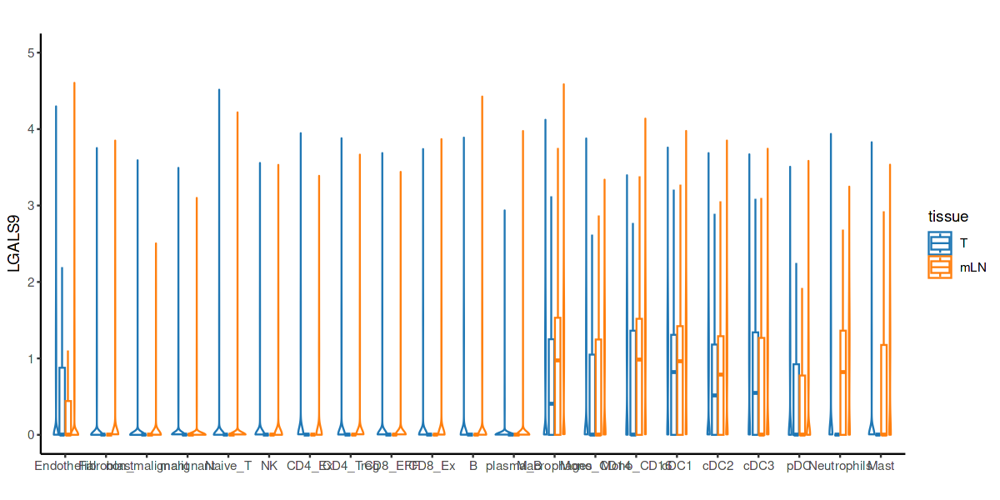

In [37]:
options(repr.plot.height = 5, repr.plot.width = 10)
ggplot(data, aes(x=celltype_new_last, y=LGALS9,color = tissue)) +
geom_violin(aes(), trim = FALSE)+
geom_boxplot(outlier.color = NA,aes(color=tissue),notch = F,width=0.3)+
theme_classic()+
scale_color_manual(values=c(T="#1f77b4",mLN="#ff7f0e"))+ 
scale_color_manual(values=c(T="#1f77b4",mLN="#ff7f0e"))+
stat_compare_means(comparisons = my_comparisons,label = "p.signif") +
#scale_y_continuous(expand = c(0, 0), limit = c(0, 0.5))
  ylim(0, 5)+
#theme(legend.position = 'none')+
labs(x='',y='LGALS9',title = '')

In [114]:
data$cancer <- seurat_malignant@meta.data[rownames(data),'cancer']

In [120]:
head(data)

,MRC2,MET,CD44,DAG1,PTPRK,SLC1A5,SORL1,tissue,cancer
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
GSM1909307_AAACCTGAGATGGGTC-1,0,0,5.268704,0.000000,0,0,0,T,BRCA
GSM1909307_AAACCTGAGTCTTGCA-1,0,0,6.123699,0.000000,0,0,0,T,BRCA
GSM1909307_AAACCTGCATCACGAT-1,0,0,2.734482,0.000000,0,0,0,T,BRCA
GSM1909307_AAACCTGGTCATCCCT-1,0,0,0.000000,3.062787,0,0,0,T,BRCA
GSM1909307_AAACCTGGTGCAGACA-1,0,0,0.000000,0.000000,0,0,0,T,BRCA
GSM1909307_AAACCTGTCGCAGGCT-1,0,0,4.559964,0.000000,0,0,0,T,BRCA


In [30]:
my_comparisons <- list( c("T", "mLN"))

In [113]:
i <- 'PTPRK'

In [116]:
data1 <- data[,c(i,'tissue')]
#data1 <- rbind.data.frame(filter(data1,tissue=='T'),filter(data1,tissue=='mLN')[which(filter(data1,tissue=='mLN')[,1]>0),])
data1 <- data1[which(data1[,1]>0),]
head(data1)

,PTPRK,tissue
,<dbl>,<fct>
GSM1909307_ACTATCTAGGGATGGG-1,0.8465967,T
GSM1909307_ATCATGGCAAGGACAC-1,1.4936520,T
GSM1909307_ATCATGGCACTTCGAA-1,2.0173492,T
GSM1909307_CACACAATCGGCATCG-1,1.1756407,T
GSM1909307_CAGCGACTCATGTCTT-1,1.6756032,T
GSM1909307_CATGCCTTCTCAAACG-1,1.2565971,T


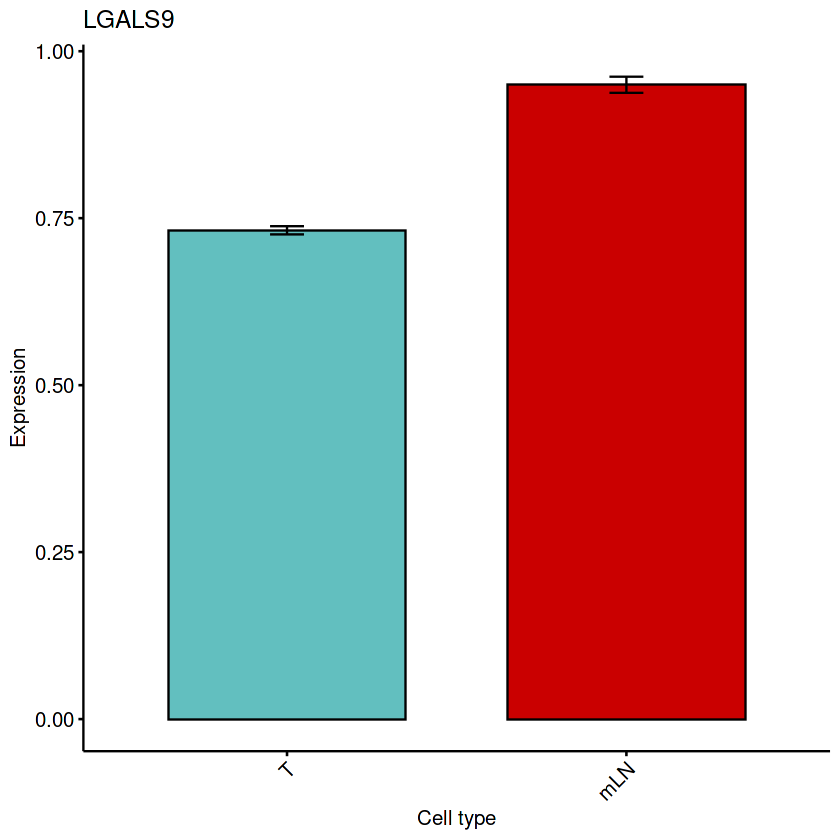

In [45]:
my_comparisons <- list( c("T", "mLN"))
ggbarplot(data, x = "tissue", y='', add="mean_se",fill="tissue",  position=position_dodge(0.8),
          palette = c("#62BFBF", "#ca0000")) +
  xlab("Cell type") +
  ylab("Expression") +
  ggtitle('LGALS9') +
#ylim(0, 0.2)+
  theme(axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1)) +
  guides(fill = F) #+
  #stat_compare_means(comparisons = my_comparisons)

In [118]:
table(seurat_qc$celltype_new_last_refined)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
     Mac_C1QC       Mac_FN1      Mac_IL1B     Mac_ISG15      Mac_SPP1 
        14434          1725          1938          3498          4895 
    malignant          Mast     Mono_CD14     Mono_CD16       Naive_T 
        91816          4071          4339           665         94068 
  Neutrophils            NK non_malignant           pDC      plasma_B 
         1590         16063         42842          3297         13891 

In [123]:
ggbarplot(data, x = 'tissue', y=i, add="mean_se",fill='cancer', position=position_dodge(0.5),
          palette = c("#62BFBF", "#ca0000"),position = position_dodge())

ERROR: Error in ggbarplot(data, x = "tissue", y = i, add = "mean_se", fill = "cancer", : formal argument "position" matched by multiple actual arguments


In [105]:
p_plot <- list()
for(i in c('MRC2','MET','CD44','DAG1','PTPRK','SLC1A5','SORL1')){
p <- ggbarplot(data, x = 'tissue', y=i, add="mean_se",fill='tissue',  position=position_dodge(0.5),
          palette = c("#62BFBF", "#ca0000")) +
ggtitle(i)+
guides(fill = F)
 p_plot[[i]] <- p   
    }

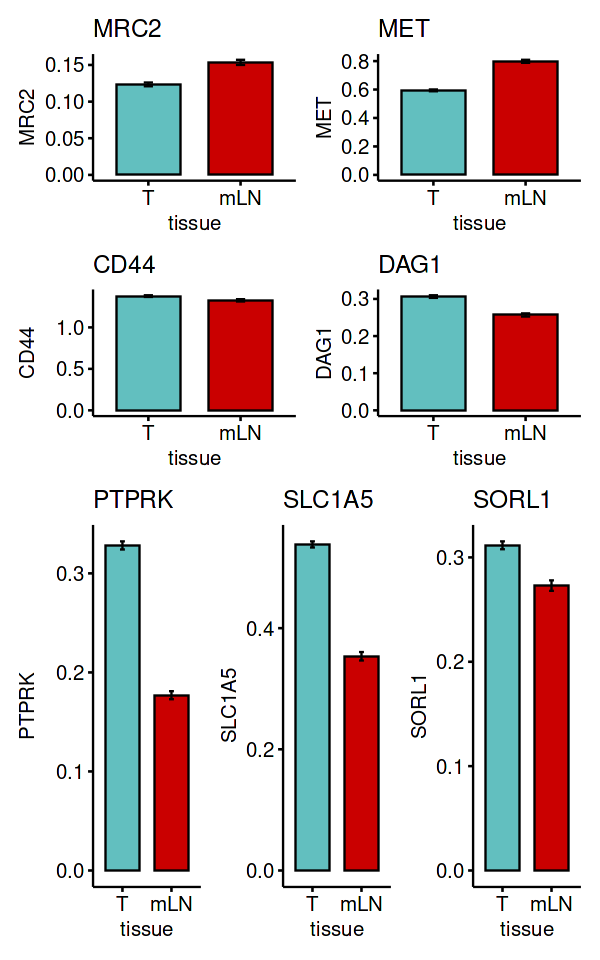

In [106]:
options(repr.plot.height = 8, repr.plot.width = 5)
(p_plot[[1]]+p_plot[[2]]+p_plot[[3]]+p_plot[[4]])/(p_plot[[5]]+p_plot[[6]]+p_plot[[7]])

In [109]:
a <- filter(seurat_malignant@meta.data,cancer=='PTC')
head(a)

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,Phase,old.ident,RNA_snn_res.0.4,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,celltype_new,celltype_new_last,cancer1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>
GSM5585102_ACGATACCAATGTAAG-1,GSM5585102,2069,1083,PTC,GSM5585102,PTC1,T,3.189947,0,0,⋯,G1,16,5,5,6,6,Epithelium,Epithelium,malignant,PTC
GSM5585102_GAAATGACAGTGACAG-1,GSM5585102,4178,1706,PTC,GSM5585102,PTC1,T,2.489229,0,0,⋯,G1,16,5,5,6,6,Epithelium,Epithelium,malignant,PTC
GSM5585102_GACGTTATCGGAGCAA-1,GSM5585102,11988,3025,PTC,GSM5585102,PTC1,T,4.479479,0,0,⋯,G1,16,5,5,6,6,Epithelium,Epithelium,malignant,PTC
GSM5585102_TTCTCCTGTCAGAATA-1,GSM5585102,5088,1586,PTC,GSM5585102,PTC1,T,4.756289,0,0,⋯,G1,16,5,5,6,6,Epithelium,Epithelium,malignant,PTC
GSM5585107_AACCGCGCATAAGACA-1,GSM5585107,4640,1772,PTC,GSM5585107,PTC3,T,1.810345,0,0,⋯,G1,11,5,5,6,6,Epithelium,Epithelium,malignant,PTC
GSM5585107_AACGTTGCATGTTGAC-1,GSM5585107,3157,1439,PTC,GSM5585107,PTC3,T,1.900538,0,0,⋯,S,11,5,5,6,6,Epithelium,Epithelium,malignant,PTC


In [111]:
data_ptc <- data[row.names(a),]
dim(data_ptc)

[1] 22435     8

In [112]:
p_ptc <- list()
for(i in c('MRC2','MET','CD44','DAG1','PTPRK','SLC1A5','SORL1')){
p <- ggbarplot(data_ptc, x = 'tissue', y=i, add="mean_se",fill='tissue',  position=position_dodge(0.5),
          palette = c("#62BFBF", "#ca0000")) +
ggtitle(i)+
guides(fill = F)
 p_ptc[[i]] <- p   
    }

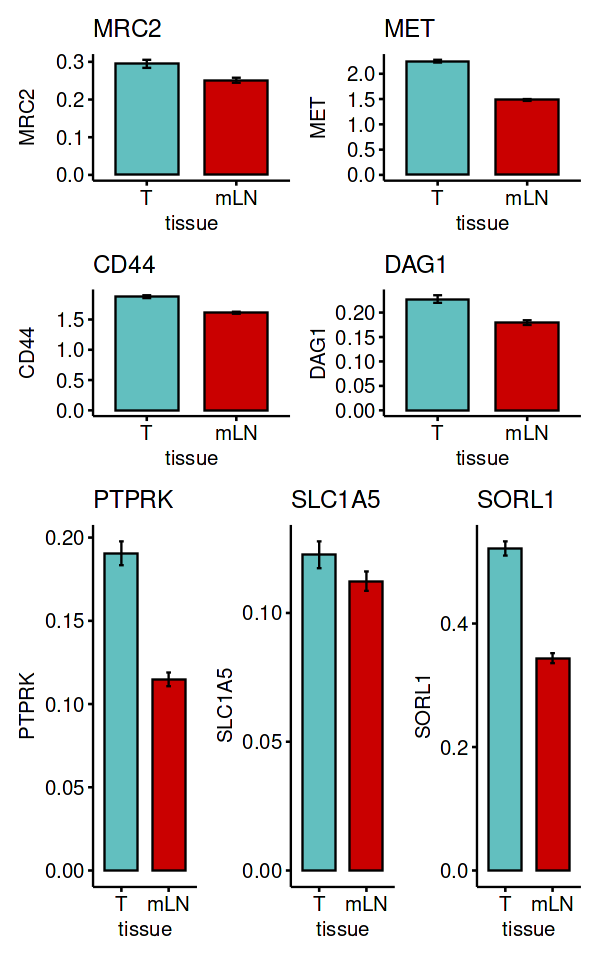

In [113]:
options(repr.plot.height = 8, repr.plot.width = 5)
(p_ptc[[1]]+p_ptc[[2]]+p_ptc[[3]]+p_ptc[[4]])/(p_ptc[[5]]+p_ptc[[6]]+p_ptc[[7]])

In [23]:
filter(seurat@meta.data,celltype_new_refined==i,tissue==j)

,orig.ident,nCount_RNA,nFeature_RNA,cancer,sampleid,patient,tissue,percent.mt,nCount_integrated,nFeature_integrated,⋯,RNA_snn_res.0.6,RNA_snn_res.0.8,seurat_clusters,celltype,RNA_snn_res.1,RNA_snn_res.1.2,RNA_snn_res.1.4,celltype_new_refined,celltype_test,cancer_primary
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,⋯,<fct>,<fct>,<fct>,<chr>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>
GSM1909307_AATCGGTTCCTCAACC-1,GSM1909307,1457,718,BRCA,GSM1909307,BRCA0040,T,8.853809,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_ACCAGTACAATCTGCA-1,GSM1909307,1176,623,BRCA,GSM1909307,BRCA0040,T,9.608844,0,0,⋯,0,48,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_ACTGTCCAGACATAAC-1,GSM1909307,1905,879,BRCA,GSM1909307,BRCA0040,T,9.763780,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_CATCGAATCGCTGATA-1,GSM1909307,1500,706,BRCA,GSM1909307,BRCA0040,T,9.733333,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_CATCGGGTCATCATTC-1,GSM1909307,1638,832,BRCA,GSM1909307,BRCA0040,T,6.593407,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_CGGACGTGTAAAGTCA-1,GSM1909307,687,442,BRCA,GSM1909307,BRCA0040,T,1.601164,0,0,⋯,1,1,1,NK/NKT,1,1,1,Naive_T,Naive_T,BRCA2
GSM1909307_GGGTTGCTCTCGTTTA-1,GSM1909307,2946,1090,BRCA,GSM1909307,BRCA0040,T,7.705363,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_TCAGCTCGTGATGCCC-1,GSM1909307,4642,1402,BRCA,GSM1909307,BRCA0040,T,8.789315,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2
GSM1909307_TTCTCCTTCAGCCTAA-1,GSM1909307,2304,800,BRCA,GSM1909307,BRCA0040,T,6.510417,0,0,⋯,7,7,0,T,0,0,0,Naive_T,Naive_T,BRCA2


In [22]:
i <- unique(seurat@meta.data[,goal])[1]
class(i)
j <- 'T'
 cells <- row.names(filter(seurat@meta.data,celltype_new_refined==i,tissue==j))
length(cells)

[1] "factor"

[1] 26736

In [55]:
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_H.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_Pathway.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_C7.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_Go.RData')

In [36]:
il10 <- list(il10 = fgsea_sets_Pathway$gene[grep('il10',fgsea_sets_Pathway$term)])
il10

$il10
  [1] "ADCY1"     "ADCY2"     "ADCY3"     "ADCY4"     "ADCY4"     "ADCY5"    
  [7] "ADCY6"     "ADCY7"     "ADCY8"     "ADCY9"     "AHCYL1"    "CALM1"    
 [13] "CD247"     "CD3G"      "CREB1"     "FCGR1A"    "FCGR2A"    "FCGR3A"   
 [19] "FGR"       "FYN"       "HCK"       "IGHG1"     "IGHG1"     "IGHG2"    
 [25] "IGHG2"     "IGHG4"     "IGHG4"     "IGHV1-2"   "IGHV1-2"   "IGHV1-46" 
 [31] "IGHV1-46"  "IGHV1-69"  "IGHV1-69"  "IGHV2-5"   "IGHV2-5"   "IGHV2-70" 
 [37] "IGHV3-11"  "IGHV3-11"  "IGHV3-13"  "IGHV3-13"  "IGHV3-23"  "IGHV3-23" 
 [43] "IGHV3-30"  "IGHV3-30"  "IGHV3-33"  "IGHV3-48"  "IGHV3-48"  "IGHV3-53" 
 [49] "IGHV3-53"  "IGHV3-7"   "IGHV3-7"   "IGHV4-34"  "IGHV4-34"  "IGHV4-39" 
 [55] "IGHV4-39"  "IGHV4-59"  "IGHV4-59"  "IGKV1-12"  "IGKV1-12"  "IGKV1-16" 
 [61] "IGKV1-16"  "IGKV1-17"  "IGKV1-17"  "IGKV1-33"  "IGKV1-33"  "IGKV1-39" 
 [67] "IGKV1-39"  "IGKV1-5"   "IGKV1-5"   "IGKV1D-12" "IGKV1D-16" "IGKV1D-33"
 [73] "IGKV1D-39" "IGKV2-28"  "IGKV2-28"  "IGKV2-30"  "IGKV2-30"  "IGKV2D-28"
 [79] "IGKV2D-30" "IGKV2D-40" "IGKV3-11"  "IGKV3-11"  "IGKV3-15"  "IGKV3-15" 
 [85] "IGKV3-20"  "IGKV3-20"  "IGKV3D-20" "IGKV4-1"   "IGKV5-2"   "IGKV5-2"  
 [91] "IGLC2"     "IGLC3"     "IGLV1-40"  "IGLV1-40"  "IGLV1-44"  "IGLV1-44" 
 [97] "IGLV1-47"  "IGLV1-51"  "IGLV2-11"  "IGLV2-14"  "IGLV2-23"  "IGLV2-8"  
[103] "IGLV3-1"   "IGLV3-19"  "IGLV3-21"  "IGLV3-25"  "IGLV3-27"  "IGLV6-57" 
[109] "IGLV7-43"  "IGLV7-43"  "IL10"      "ITPR1"     "ITPR2"     "ITPR3"    
[115] "LYN"       "PLCG1"     "PLCG2"     "PRKACA"    "PRKACA"    "PRKACB"   
[121] "PRKACG"    "PRKAR1A"   "PRKAR1B"   "PRKAR2A"   "PRKAR2B"   "PRKAR2B"  
[127] "PRKX"      "SRC"       "SYK"       "YES1"

In [40]:
library(UCell)

In [41]:
seurat_T <- AddModuleScore_UCell(seurat_T, features = il10,maxRank = 3000)

In [42]:
colnames(seurat_T@meta.data)<- gsub('_UCell','',colnames(seurat_T@meta.data))

In [36]:
filter(fgsea_sets_Pathway,gene=='LGALS9')

term,gene
<chr>,<chr>
Cytokine_signaling_in_immune_system,LGALS9
Interleukin_2_family_signaling,LGALS9
Signaling_by_interleukins,LGALS9


In [18]:
a <- filter(fgsea_sets_Go,gene=='LGALS9')

In [24]:
a$term[grep('Infla',a$term)]

[1] "Inflammatory_response"

In [22]:
fgsea_sets_Pathway$term[grep('LGALS9',fgsea_sets_Pathway$gene)]

[1] "Cytokine_signaling_in_immune_system" "Interleukin_2_family_signaling"     
[3] "Signaling_by_interleukins"

In [39]:
seurat_Mac <- readRDS('/home/zhouyao/pancancer/data/seurat_Mac.Rds')

In [213]:
seurat_Mac@meta.data$LGALS9 <- GetAssayData(seurat_Mac, slot = "data")['LGALS9', rownames(seurat_Mac@meta.data)]
#a <- mean(seurat_Mac@meta.data$LGALS9)
#a
seurat_Mac@meta.data$group <- 'a' 
seurat_Mac@meta.data$group[which(seurat_Mac@meta.data$LGALS9>0)] <- 'LGALS9_H'
seurat_Mac@meta.data$group[which(seurat_Mac@meta.data$LGALS9<=0)] <- 'LGALS9_L'

In [214]:
table(seurat_Mac@meta.data$group)


LGALS9_H LGALS9_L 
   14335    12155 

#### 9、差异基因

In [12]:
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_H.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_Pathway.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_C7.RData')
load('/home/zhouyao/pancancer/data/enrichment_data/new/fgsea_sets_Go.RData')

In [20]:
enrichment_mLN_T <- function(seurat,indir,goal){
    DEG <- list()
    Go <- list()
    Pathway <- list()
    Hallmark <- list()
  #  C7 <- list()

for(i in unique(seurat@meta.data[,goal])){
 #i <- 'M2'
 seurat_test <- subset(seurat,subset=celltype_new_refined_last_test%in%i)####换成髓系别忘记修改
 #####差异基因
 Idents(seurat_test) <- seurat_test@meta.data$tissue
 df <- FindMarkers(seurat_test, ident.1 = "mLN",ident.2 = "T", min.pct = 0.01,logfc.threshold = 0) ####保留全部差异基因,获取logfc排序 
 DEG[[i]] <- df
###symbol ID 转为 entriz ID
#gene.map.table <- bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db, drop = F)
#df$gene.ID <- gene.map.table[match(rownames(df), gene.map.table$SYMBOL), "ENTREZID"]
gsea.gene.list <- df$avg_log2FC
names(gsea.gene.list) <- row.names(df)
gsea.gene.list <- gsea.gene.list[!is.na(names(gsea.gene.list))]
length(gsea.gene.list)
 ####GSEA功能富集
 GOresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Go,verbose=F)###GO富集分析，从大到小排序
 Pathwayresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Pathway,verbose=F) ###KEGG,REACTOM 富集分析
 Hallmarkresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_H,verbose=F) ###HALLMARK 富集分析
 #C7result <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_C7,verbose=F) ###C7 富集分析
 Go[[i]] <- GOresult   
 Pathway[[i]] <- Pathwayresult 
 Hallmark[[i]] <- Hallmarkresult 
 #C7[[i]] <- C7result     
}
   save(DEG,file= paste0(paste0(indir,'DEG'),'.RData'))
    save(Go,file= paste0(paste0(indir,'Go'),'.RData'))
    save(Pathway,file= paste0(paste0(indir,'Pathway'),'.RData'))
    save(Hallmark,file= paste0(paste0(indir,'Hallmark'),'.RData'))
    #save(C7,file= paste0(paste0(indir,'C7'),'.RData'))
}

In [19]:
table(seurat_Mac$celltype_new_refined_last_test)


   M1    M2 
 1073 25417 

In [21]:
endo_enrich <- enrichment_mLN_T(seurat=seurat_Mac,indir='/home/zhouyao/pancancer/data/Mac_enrichment/test/',goal='celltype_new_refined_last_test')

Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”
Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”
Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”
Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”
Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”
Warning message in fgseaMultilevel(...):
“For some pathways, in reality P-values are less than 1e-10. You can set the `eps` argument to zero for better estimation.”


In [21]:
enrichment_mLN_T <- function(seurat,indir,goal){
    DEG <- list()
    Go <- list()
    Pathway <- list()
    Hallmark <- list()
  #  C7 <- list()

#for(i in unique(seurat@meta.data[,goal])){
 i <- 'malignant'
 seurat_test <- subset(seurat,subset=celltype_new_last_last%in%goal)####换成髓系别忘记修改
 #####差异基因
 Idents(seurat_test) <- seurat_test@meta.data$tissue
 df <- FindMarkers(seurat_test, ident.1 = "mLN",ident.2 = "T", min.pct = 0.1,logfc.threshold = 0) ####保留全部差异基因,获取logfc排序 
 DEG[[i]] <- df
###symbol ID 转为 entriz ID
#gene.map.table <- bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db, drop = F)
#df$gene.ID <- gene.map.table[match(rownames(df), gene.map.table$SYMBOL), "ENTREZID"]
gsea.gene.list <- df$avg_log2FC
names(gsea.gene.list) <- row.names(df)
gsea.gene.list <- gsea.gene.list[!is.na(names(gsea.gene.list))]
length(gsea.gene.list)
 ####GSEA功能富集
 GOresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Go,verbose=F)###GO富集分析，从大到小排序
 Pathwayresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Pathway,verbose=F) ###KEGG,REACTOM 富集分析
 Hallmarkresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_H,verbose=F) ###HALLMARK 富集分析
 #C7result <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_C7,verbose=F) ###C7 富集分析
 Go[[i]] <- GOresult   
 Pathway[[i]] <- Pathwayresult 
 Hallmark[[i]] <- Hallmarkresult 
 #C7[[i]] <- C7result     
#}
   save(DEG,file= paste0(paste0(indir,'DEG'),'.RData'))
    save(Go,file= paste0(paste0(indir,'Go'),'.RData'))
    save(Pathway,file= paste0(paste0(indir,'Pathway'),'.RData'))
    save(Hallmark,file= paste0(paste0(indir,'Hallmark'),'.RData'))
    #save(C7,file= paste0(paste0(indir,'C7'),'.RData'))
}

In [37]:
table(seurat_qc$celltype_new_last_last)


            B        CD4_Ex      CD4_Treg       CD8_EFF        CD8_Ex 
        46242          4214         15088         11052         14322 
         cDC1          cDC2          cDC3   Endothelial    Fibroblast 
          622          5682          1395         28055         46912 
           M1            M2     malignant          Mast     Mono_CD14 
         5906         20584        127282          4071          4339 
    Mono_CD16       Naive_T   Neutrophils            NK non_malignant 
          665         94068          1590         16063          7376 
          pDC      plasma_B 
         3297         13891 

In [21]:
seurat <- seurat_Myeloid

In [ ]:
endo_enrich <- enrichment_mLN_T(seurat=seurat_qc,indir='/home/zhouyao/pancancer/data/Fib_enrichment/',goal='Fibroblast')

In [22]:
endo_enrich <- enrichment_mLN_T(seurat=seurat_qc,indir='/home/zhouyao/pancancer/data/malignant_enrichment/',goal='malignant')

In [ ]:
Myeloid_enrich <- enrichment_mLN_T(seurat=seurat_Myeloid,indir='/home/zhouyao/pancancer/data/Myeloid_enrichment/',goal='celltype_new_refined_last')

In [ ]:
Myeloid_enrich <- enrichment_mLN_T(seurat=seurat_Mac,indir='/home/zhouyao/pancancer/data/Mac_enrichment/M1M2/',goal='celltype_new_refined_last')

In [53]:
table(seurat_Mac$celltype_new_refined_last)


   M1    M2 
 5906 20584 

In [234]:
table(seurat_Mac$celltype_new_refined_last_last)


 Mac_C1QC   Mac_FN1  Mac_IL1B Mac_ISG15  Mac_SPP1 
    12854      2100      3793      4347      3396 

In [208]:
load('/home/zhouyao/pancancer/data/Myeloid_enrichment/DEG.RData')

In [209]:
DEG$cDC1

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
RACK1,4.307109e-39,1.8537374,0.665,0.139,2.035927e-34
ATP5MG,1.758578e-38,1.8489501,0.634,0.128,8.312621e-34
ATP5MF,8.190759e-34,1.4414512,0.581,0.116,3.871690e-29
GNB2L1,1.557532e-33,-1.6386749,0.267,0.803,7.362299e-29
ATP5F1E,2.870525e-33,1.7491668,0.654,0.155,1.356869e-28
MTATP6P1,1.411619e-32,2.1099174,0.314,0.005,6.672583e-28
ATP5F1B,2.160789e-30,1.2929718,0.529,0.107,1.021383e-25
MT-RNR2,3.007344e-30,3.4405729,0.351,0.023,1.421541e-25
MT-RNR1,1.236683e-29,3.0493999,0.346,0.023,5.845678e-25


In [212]:
gsea.gene.list <- c('a','b')

In [213]:
gsea.gene.list[!is.na(gsea.gene.list)]

[1] "a" "b"

In [7]:
enrichment_diff <- function(seurat,indir,goal){
    DEG <- list()
    Go <- list()
    Pathway <- list()
    Hallmark <- list()
  #  C7 <- list()
#seurat <- subset(seurat,celltype_new_refined_last%in%c(c('Mono_CD14','Mono_CD16','cDC1','cDC2','cDC3')))
Idents(seurat) <- seurat@meta.data$celltype_new_refined_last
marker <- FindAllMarkers(seurat, only.pos = TRUE,min.pct = 0.1,logfc.threshold = 0)
for(i in unique(seurat@meta.data$celltype_new_refined_last) ){
 df <- filter(marker,cluster%in%i)
 #####差异基因
 DEG[[i]] <- df
###symbol ID 转为 entriz ID
#gene.map.table <- bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db, drop = F)
#df$gene.ID <- gene.map.table[match(rownames(df), gene.map.table$SYMBOL), "ENTREZID"]
gsea.gene.list <- marker$avg_log2FC
names(gsea.gene.list) <- row.names(df)
gsea.gene.list <- gsea.gene.list[!is.na(names(gsea.gene.list))]
length(gsea.gene.list)
 ####GSEA功能富集
 GOresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Go,verbose=F)###GO富集分析，从大到小排序
 Pathwayresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Pathway,verbose=F) ###KEGG,REACTOM 富集分析
 Hallmarkresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_H,verbose=F) ###HALLMARK 富集分析
 #C7result <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_C7,verbose=F) ###C7 富集分析
 Go[[i]] <- GOresult   
 Pathway[[i]] <- Pathwayresult 
 Hallmark[[i]] <- Hallmarkresult 
 #C7[[i]] <- C7result     
}
    save(DEG,file= paste0(paste0(indir,'DEG'),'.RData'))
    save(Go,file= paste0(paste0(indir,'Go'),'.RData'))
    save(Pathway,file= paste0(paste0(indir,'Pathway'),'.RData'))
    save(Hallmark,file= paste0(paste0(indir,'Hallmark'),'.RData'))
    #save(C7,file= paste0(paste0(indir,'C7'),'.RData'))
}

In [6]:
seurat_Myeloid <- readRDS('/home/zhouyao/pancancer/data/seurat_Myeloid.Rds')

In [63]:
table(seurat_Myeloid$celltype_new_refined_last)


       cDC1        cDC2        cDC3       Macro        Mast   Mono_CD14 
        622        5682        1395       26490        4071        4339 
  Mono_CD16 Neutrophils         pDC 
        665        1590        3297 

In [ ]:
Myeloid_enrich <- enrichment_diff(seurat=seurat_Myeloid,indir='/home/zhouyao/pancancer/data/Myeloid_enrichment/whole/',goal='celltype_new_refined_last')

In [76]:
#####提供DEG了
enrichment_mLN_T <- function(indir,DEG){
    #DEG <- list()
    Go <- list()
    Pathway <- list()
   Hallmark <- list()
   # C7 <- list()

for(i in names(DEG)){
 #seurat_test <- subset(seurat,subset=celltype_new_refined_last%in%i)####换成髓系别忘记修改
 #####差异基因
 #Idents(seurat_test) <- seurat_test@meta.data$tissue
 #df <- FindMarkers(seurat_test, ident.1 = "mLN",ident.2 = "T", min.pct = 0.1,logfc.threshold = 0) ####保留全部差异基因,获取logfc排序 
 #DEG[[i]] <- df
df <- DEG[[i]] ####直接symbol富集
###symbol ID 转为 entriz ID
#gene.map.table <- bitr(rownames(df), fromType = "SYMBOL", toType = "ENTREZID", OrgDb = org.Hs.eg.db, drop = F)
#df$gene.ID <- gene.map.table[match(rownames(df), gene.map.table$SYMBOL), "ENTREZID"]
gsea.gene.list <- df$avg_log2FC
#names(gsea.gene.list) <- as.character(df$gene.ID)
names(gsea.gene.list) <- row.names(df)
gsea.gene.list <- gsea.gene.list[!is.na(names(gsea.gene.list))]
length(gsea.gene.list)
 ####GSEA功能富集
 GOresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Go,verbose=F)###GO富集分析，从大到小排序
Pathwayresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_Pathway,verbose=F) ###KEGG,REACTOM 富集分析
 Hallmarkresult <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_H,verbose=F) ###HALLMARK 富集分析
 #C7result <- GSEA(sort(gsea.gene.list, decreasing = TRUE), TERM2GENE=fgsea_sets_C7,verbose=F) ###C7 富集分析
 Go[[i]] <- GOresult   
 Pathway[[i]] <- Pathwayresult 
 Hallmark[[i]] <- Hallmarkresult 
 #C7[[i]] <- C7result     
}
    #save(DEG,file= paste0(paste0(indir,'DEG'),'.RData'))
    save(Go,file= paste0(paste0(indir,'Go'),'.RData'))
    save(Pathway,file= paste0(paste0(indir,'Pathway'),'.RData'))
    save(Hallmark,file= paste0(paste0(indir,'Hallmark'),'.RData'))
    #save(C7,file= paste0(paste0(indir,'C7'),'.RData'))
}

In [3]:
load('/home/zhouyao/pancancer/data/T_enrichment/mLN_T/DEG.RData')

In [5]:
as.data.frame(GOresult)

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalue,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
R-HSA-8949613,R-HSA-8949613,Cristae formation,13,0.8794840,2.164848,1.357274e-05,0.009894531,0.009243754,304,"tags=85%, list=10%, signal=76%",10632/517/514/10476/518/539/9551/513/522/521/506
R-HSA-163210,R-HSA-163210,Formation of ATP by chemiosmotic coupling,11,0.9021376,2.145999,5.209997e-05,0.018990438,0.017741410,304,"tags=100%, list=10%, signal=90%",10632/517/514/10476/518/539/9551/513/522/521/506
R-HSA-71387,R-HSA-71387,Metabolism of carbohydrates,48,-0.6061588,-1.978967,9.163389e-05,0.022267035,0.020802500,283,"tags=35%, list=9%, signal=33%",5223/7360/2992/960/7167/5515/3423/2683/805/669/5315/5230/226/93010/7316/2023/2597
R-HSA-114608,R-HSA-114608,Platelet degranulation,35,-0.6345522,-1.935668,2.673653e-04,0.032637631,0.030491007,599,"tags=54%, list=20%, signal=44%",6813/81/5552/5216/808/3309/10447/6647/7873/5660/308/1072/7277/7076/805/226/928/7114/967
R-HSA-5627117,R-HSA-5627117,RHO GTPases Activate ROCKs,11,-0.8143990,-1.925597,3.133929e-04,0.032637631,0.030491007,167,"tags=36%, list=6%, signal=34%",1072/389/4637/5500
R-HSA-70171,R-HSA-70171,Glycolysis,17,-0.7454713,-1.913364,2.927752e-04,0.032637631,0.030491007,283,"tags=53%, list=9%, signal=48%",5223/7167/5515/669/5315/5230/226/2023/2597
R-HSA-76005,R-HSA-76005,Response to elevated platelet cytosolic Ca2+,37,-0.6203662,-1.907889,2.863442e-04,0.032637631,0.030491007,599,"tags=51%, list=20%, signal=42%",6813/81/5552/5216/808/3309/10447/6647/7873/5660/308/1072/7277/7076/805/226/928/7114/967


In [77]:
T_enrich <- enrichment_mLN_T(indir='/home/zhouyao/pancancer/data/T_enrichment/mLN_T/',DEG=DEG)

Warning message in fgseaMultilevel(...):
“There were 3 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 10000)”
no term enriched under specific pvalueCutoff...

